# imports

## importing libraries

In [ ]:
#basic imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
pd.options.mode.chained_assignment = None
import warnings
warnings.filterwarnings("ignore")

#model related libraries
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_absolute_percentage_error, mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor, plot_tree
from sklearn.metrics import accuracy_score, classification_report, mean_squared_error, r2_score
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor

import math
from statsmodels.api import OLS
import statsmodels.api as sm
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from xgboost import XGBRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.preprocessing import StandardScaler

#plotly related
import os
import matplotlib.ticker as ticker
import matplotlib.ticker as mticker
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio

In [ ]:
# G drive connection to load the data
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## loading data

In [ ]:
# Global variables
seed = 0  # For setting the random state
sample_size = 0.4
test_size = 0.3
target = 'meter_sale_price'

*   data = pd.read_csv("/content/drive/MyDrive/Flipose-Analytics/TruEstates-2/Data/Data_Model/transactions_2020_dummies.csv")
*  udata = pd.read_csv("/content/drive/MyDrive/Flipose-Analytics/TruEstates-2/Data/Data_Model/units_2020_dummies.csv")

In [ ]:
data = pd.read_csv("/content/drive/MyDrive/Flipose-Analytics/TruEstates-2/Data/Data_Model/units_2020_dummies.csv")

In [ ]:
data1 = pd.read_csv("/content/drive/MyDrive/Flipose-Analytics/TruEstates-2/Data/Data_Model/transactions_2020_dummies.csv")

In [ ]:
df = data

In [ ]:
data1['property_type_en'].value_counts()

,count
property_type_en,
unit,461348
villa,87459
land,39224
building,832


In [ ]:
data.columns

Index(['Unnamed: 0', 'transaction_id', 'procedure_id', 'trans_group_id',
       'trans_group_en', 'procedure_name_en', 'instance_date',
       'property_type_id', 'property_type_en', 'property_sub_type_id',
       'property_sub_type_en', 'property_usage_en', 'reg_type_id',
       'reg_type_en', 'area_id', 'area_name_en', 'building_name_en',
       'project_number', 'project_name_en', 'master_project_en',
       'nearest_landmark_en', 'nearest_metro_en', 'nearest_mall_en',
       'rooms_en', 'has_parking', 'procedure_area', 'actual_worth',
       'meter_sale_price', 'rent_value', 'meter_rent_price',
       'no_of_parties_role_1', 'no_of_parties_role_2', 'no_of_parties_role_3',
       'instance_Year', 'instance_Month', 'instance_Day', 'trans_X_1',
       'trans_X_2', 'Trans_Year', 'trans_X_3', 'sector_name',
       'usage_residential', 'usage_hospitality', 'Off_Plan_Reg',
       'trans_group_gifts', 'trans_group_sales', 'Property_Building',
       'Property_Unit', 'Property_Villa', 'Fam_

# data preparation

    features=['has_parking','usage_residential', 'usage_hospitality', 'Off_Plan_Reg',
              'trans_group_gifts', 'trans_group_sales', 'Fam_landmarks', 'close_DubaiMall',
       'Close_Marina_EmiratesMall', 'Close_MIRDIF_IBNMall', 'Rooms_3_4',
       'Rooms_moreThan_4', 'Rooms_Studio_Single', 'Rooms_Commercial']

In [ ]:
data.columns

Index(['Unnamed: 0', 'transaction_id', 'procedure_id', 'trans_group_id',
       'trans_group_en', 'procedure_name_en', 'instance_date',
       'property_type_id', 'property_type_en', 'property_sub_type_id',
       'property_sub_type_en', 'property_usage_en', 'reg_type_id',
       'reg_type_en', 'area_id', 'area_name_en', 'building_name_en',
       'project_number', 'project_name_en', 'master_project_en',
       'nearest_landmark_en', 'nearest_metro_en', 'nearest_mall_en',
       'rooms_en', 'has_parking', 'procedure_area', 'actual_worth',
       'meter_sale_price', 'rent_value', 'meter_rent_price',
       'no_of_parties_role_1', 'no_of_parties_role_2', 'no_of_parties_role_3',
       'instance_Year', 'instance_Month', 'instance_Day', 'trans_X_1',
       'trans_X_2', 'Trans_Year', 'trans_X_3', 'sector_name',
       'usage_residential', 'usage_hospitality', 'Off_Plan_Reg',
       'trans_group_gifts', 'trans_group_sales', 'Property_Building',
       'Property_Unit', 'Property_Villa', 'Fam_

In [ ]:
data_sorted = data.sort_values( by = ['trans_group_en', 'property_usage_en','has_parking', 'nearest_landmark_en','nearest_mall_en','rooms_en'])

In [ ]:
data_sorted

,Unnamed: 0,transaction_id,procedure_id,trans_group_id,trans_group_en,procedure_name_en,instance_date,property_type_id,property_type_en,property_sub_type_id,...,Close_Marina_EmiratesMall,Close_MIRDIF_IBNMall,Rooms_3_4,Rooms_moreThan_4,Rooms_Studio_Single,Rooms_Commercial,area_lat,area_lon,compound_key,combinations
242365,242365,3-9-2022-875,9,3,gifts,Grant,2022-03-25,3,unit,42.0,...,1,0,0,0,0,1,25.0987035,55.1725124,gifts_commercial_0_burj al arab_mall of the em...,0_0_0_1_0_1_0_1_0_0_0_0_1
423178,423178,3-9-2022-865,9,3,gifts,Grant,2022-03-23,3,unit,42.0,...,1,0,0,0,0,1,25.0987035,55.1725124,gifts_commercial_0_burj al arab_mall of the em...,0_0_0_1_0_1_0_1_0_0_0_0_1
14700,14700,3-9-2024-2105,9,3,gifts,Grant,2024-05-08,3,unit,23.0,...,1,0,0,0,0,1,25.1193271,55.1317401,gifts_commercial_0_burj al arab_marina mall_shop,0_0_0_1_0_1_0_1_0_0_0_0_1
50318,50318,3-9-2024-2101,9,3,gifts,Grant,2024-05-08,3,unit,23.0,...,1,0,0,0,0,1,25.1193271,55.1317401,gifts_commercial_0_burj al arab_marina mall_shop,0_0_0_1_0_1_0_1_0_0_0_0_1
100239,100239,3-9-2024-2102,9,3,gifts,Grant,2024-05-08,3,unit,23.0,...,1,0,0,0,0,1,25.1193271,55.1317401,gifts_commercial_0_burj al arab_marina mall_shop,0_0_0_1_0_1_0_1_0_0_0_0_1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
299642,299642,1-102-2024-6090,102,1,sales,Sell - Pre registration,2024-01-31,3,unit,60.0,...,0,0,0,0,0,0,25.03192836,55.14232708,NaN,1_0_1_0_1_0_0_0_0_0_0_0_0
371710,371710,1-102-2024-5940,102,1,sales,Sell - Pre registration,2024-01-31,3,unit,60.0,...,0,0,0,0,0,0,25.03192836,55.14232708,NaN,1_0_1_0_1_0_0_0_0_0_0_0_0
429749,429749,1-102-2024-13909,102,1,sales,Sell - Pre registration,2024-03-07,3,unit,60.0,...,0,0,0,0,0,0,25.03192836,55.14232708,NaN,1_0_1_0_1_0_0_0_0_0_0_0_0
444447,444447,1-102-2024-5995,102,1,sales,Sell - Pre registration,2024-01-31,3,unit,60.0,...,0,0,0,0,0,0,25.03192836,55.14232708,NaN,1_0_1_0_1_0_0_0_0_0_0_0_0


In [ ]:
data['compound_key'] = data['trans_group_en'] + '_' + data['property_usage_en'] + '_' + data['has_parking'].astype(str) + '_' + data['nearest_landmark_en'] + '_' + data['nearest_mall_en'] + '_' + data['rooms_en']

In [ ]:
# Step 1: Get keys that occur more than 1000 times
keys_over_1000 = data['compound_key'].value_counts()
keys_over_1000 = keys_over_1000[keys_over_1000 > 1000]
len(keys_over_1000)
# Step 2: Filter original DataFrame for those keys
#filtered_data = data[data['compound_key'].isin(keys_over_1000)]


59

In [ ]:
data['trans_group_en'].value_counts()
data['property_usage_en'].value_counts()
data['nearest_landmark_en'].value_counts()
data['nearest_mall_en'].value_counts()
#data['rooms_en'].value_counts()

,count
nearest_mall_en,
marina mall,117600
dubai mall,112307
mall of the emirates,69368
city centre mirdif,29506
ibn-e-battuta mall,21695


In [ ]:
data[data['nearest_landmark_en']== 'dubai international airport']['area_name_en'].value_counts()

,count
area_name_en,
Al Khairan First,14645
Al Jadaf,2116
Al Warsan First,1996
Mirdif,1245
Muhaisanah First,919
Palm Deira,560
Al Kheeran,360
Al Qusais Industrial Fifth,158
Port Saeed,99


In [ ]:
data[data['nearest_landmark_en']== 'dubai international airport']['sector_name'].value_counts()

,count
sector_name,
North_Central,15005
West,2773
North_east,1996
North,1422
Central,972
North_west,99


In [ ]:
cols_to_combine = [
    'usage_residential', 'usage_hospitality', 'Off_Plan_Reg',
    'trans_group_gifts', 'trans_group_sales', 'Fam_landmarks',
    'close_DubaiMall', 'Close_Marina_EmiratesMall', 'Close_MIRDIF_IBNMall',
    'Rooms_3_4', 'Rooms_moreThan_4', 'Rooms_Studio_Single', 'Rooms_Commercial'
]

data['combinations'] = data[cols_to_combine].astype(str).agg('_'.join, axis=1)


In [ ]:
data['combinations'].value_counts()

,count
combinations,
1_0_1_0_1_0_0_0_0_0_0_0_0,53965
1_0_1_0_1_0_0_1_0_0_0_0_0,41784
1_0_1_0_1_1_1_0_0_0_0_0_0,37086
1_0_0_0_1_0_0_1_0_0_0_0_0,24064
1_0_0_0_1_1_1_0_0_0_0_0_0,22796
...,...
1_0_0_0_1_0_0_0_0_0_1_0_0,1
0_1_1_0_0_1_0_1_0_0_0_0_0,1
0_1_1_0_0_1_0_0_1_0_0_0_0,1


# Details of dataset

## data info

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 461348 entries, 0 to 461347
Data columns (total 59 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   Unnamed: 0                 461348 non-null  int64  
 1   transaction_id             461348 non-null  object 
 2   procedure_id               461348 non-null  int64  
 3   trans_group_id             461348 non-null  int64  
 4   trans_group_en             461348 non-null  object 
 5   procedure_name_en          461348 non-null  object 
 6   instance_date              461348 non-null  object 
 7   property_type_id           461348 non-null  int64  
 8   property_type_en           461348 non-null  object 
 9   property_sub_type_id       461348 non-null  float64
 10  property_sub_type_en       461348 non-null  object 
 11  property_usage_en          461348 non-null  object 
 12  reg_type_id                461348 non-null  int64  
 13  reg_type_en                46

## removing cols

### overall

In [ ]:
# For removing the columns use this
tdf = data.drop(columns=['Unnamed: 0'])
#
id_cols = [cols for cols in tdf.columns if '_id' in cols]
en_cols_all = [cols for cols in tdf.columns if '_en' in cols]
instance_cols = [cols for cols in tdf.columns if 'instance_' in cols]
removing_cols = ['rent_value', 'meter_rent_price','project_number']
parties_cols = [col for col in tdf.columns if 'parties' in col]
trans_cols = [cols for cols in tdf.columns if 'trans_' in cols] + ['Trans_Year']
#new_tdf = tdf.drop
trans_cols = [col for col in trans_cols if col not in ['trans_group_en','trans_group_gifts', 'trans_group_sales']]
tra_id_cols = [col for col in id_cols if col != 'transaction_id']
all_cols_to_drop = id_cols + trans_cols + parties_cols + removing_cols
# Get columns that exist in tdf and are in the list to drop
existing_cols_to_drop = [col for col in all_cols_to_drop if col in tdf.columns]
en_cols_not_area_not_sector = [cols for cols in en_cols_all if cols not in ['sector_name','area_name_en']]

# Drop only the columns that exist
df = tdf.drop(columns=existing_cols_to_drop)#, inplace=True)

# Note: inplace=True modifies the DataFrame directly and returns None.
# If you want to assign the modified DataFrame to new_tdf, remove inplace=True.
# new_tdf = tdf.drop(columns=existing_cols_to_drop)

### corelation

In [ ]:
 data1.columns

Index(['Unnamed: 0', 'transaction_id', 'procedure_id', 'trans_group_id',
       'trans_group_en', 'procedure_name_en', 'instance_date',
       'property_type_id', 'property_type_en', 'property_sub_type_id',
       'property_sub_type_en', 'property_usage_en', 'reg_type_id',
       'reg_type_en', 'area_id', 'area_name_en', 'building_name_en',
       'project_number', 'project_name_en', 'master_project_en',
       'nearest_landmark_en', 'nearest_metro_en', 'nearest_mall_en',
       'rooms_en', 'has_parking', 'procedure_area', 'actual_worth',
       'meter_sale_price', 'rent_value', 'meter_rent_price',
       'no_of_parties_role_1', 'no_of_parties_role_2', 'no_of_parties_role_3',
       'instance_year', 'instance_month', 'instance_day', 'sector_name',
       'usage_residential', 'usage_hospitality', 'Off_Plan_Reg',
       'trans_group_gifts', 'trans_group_sales', 'Property_Building',
       'Property_Unit', 'Property_Villa', 'Fam_landmarks', 'close_DubaiMall',
       'Close_Marina_Emirates

In [ ]:
#df.columns

In [ ]:
df = data1[data1['property_type_en'].isin(['villa','unit'])]

In [ ]:
df['property_type_en'].value_counts()

In [ ]:
df = data1

In [ ]:
id_cols = [cols for cols in df.columns if '_id' in cols]
en_cols_all = [cols for cols in df.columns if '_en' in cols]
instance_cols = [cols for cols in df.columns if 'instance_' in cols]
removing_cols = ['rent_value', 'meter_rent_price','project_number']
parties_cols = [col for col in df.columns if 'parties' in col]
trans_cols = [cols for cols in df.columns if 'trans_' in cols]
trans_cols = [col for col in trans_cols if col not in ['trans_group_en','trans_group_gifts', 'trans_group_sales']]


In [ ]:
#df = data
df = df.drop(columns = ['Unnamed: 0', 'transaction_id'] + id_cols+trans_cols)

In [ ]:
df_part1 = df.sample(random_state=seed, frac= 0.1)
df_part1

In [ ]:

corr = data.corr(numeric_only= True)
sorted_data = corr[target].sort_values(ascending=
False
)

In [ ]:
corr = data1.corr(numeric_only= True)
sorted_data1=corr[target].sort_values(ascending=
False
)

In [ ]:
sorted_data1[sorted_data1[target]>0.0][target]

In [ ]:
corr = data.corr([target,'usage_residential', 'usage_hospitality', 'Off_Plan_Reg',
       'trans_group_gifts', 'trans_group_sales', 'Property_Building',
       'Property_Unit', 'Property_Villa', 'Fam_landmarks', 'close_DubaiMall',
       'Close_Marina_EmiratesMall', 'Close_MIRDIF_IBNMall', 'Rooms_3_4',
       'Rooms_moreThan_4', 'Rooms_Studio_Single', 'Rooms_Commercial'])
corr[target].sort_values(ascending=
False
)

### Heat map for Correlation

<Axes: >

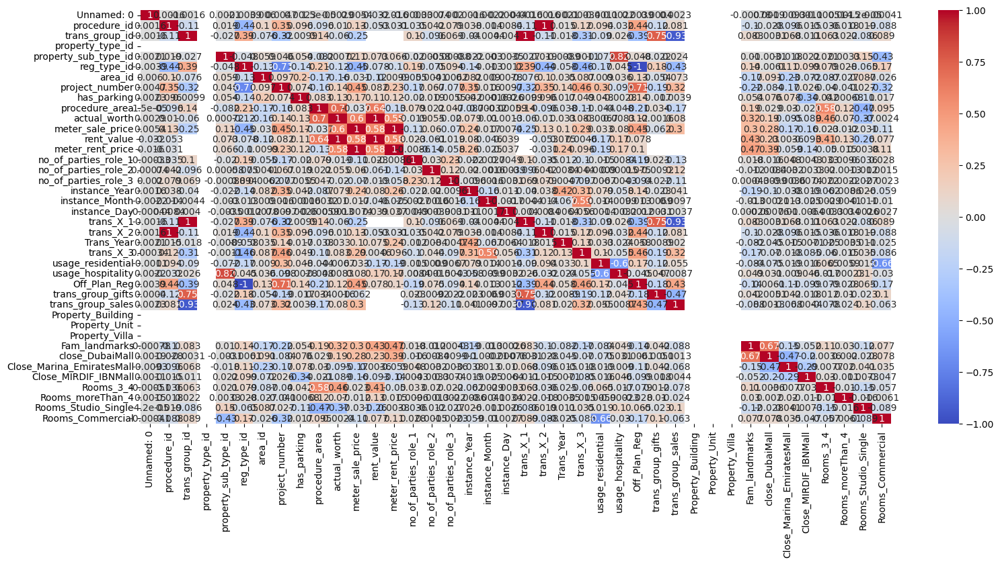

In [ ]:
# Heatmap
plt.figure(figsize=(18, 8))
sns.heatmap(data.corr(numeric_only=True), annot=True, cmap='coolwarm')

# Pairplot
#sns.pairplot(df, hue='has_parking')


In [ ]:
plt.figure(figsize=(18, 8))
sns.heatmap(df.corr(numeric_only=True), annot=True, cmap='coolwarm')


<Axes: >

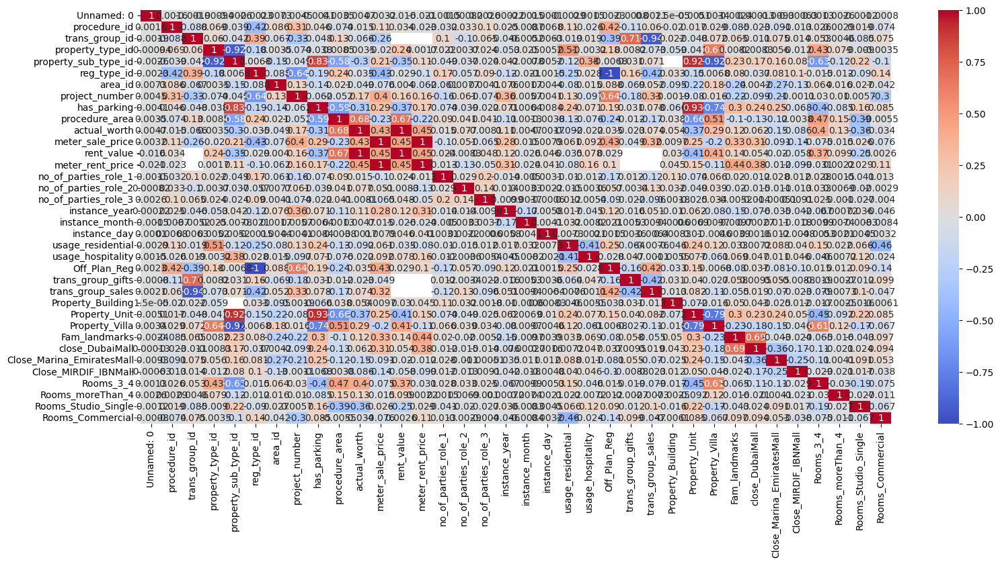

In [ ]:
plt.figure(figsize=(18, 8))
sns.heatmap(data1.corr(numeric_only=True), annot=True, cmap='coolwarm')

# regression model: sector wise and area_wise

## overall model run

In [ ]:
def run_linear_regression_overall(Data, target, test_size=0.2, seed=42):
    print("Processing Overall Linear Regression...")

    features = [
        'has_parking','Off_Plan_Reg','usage_residential','usage_hospitality',
        'trans_group_sales','trans_group_gifts',
        'close_DubaiMall', 'Close_Marina_EmiratesMall', 'Close_MIRDIF_IBNMall',
        'Rooms_3_4' , 'Rooms_Studio_Single', 'Rooms_Commercial','Fam_landmarks'
    ]

    X = Data[features]
    y = Data[target]

    if y.nunique() < 2:
        print("Target variable has less than 2 unique values.")
        return None

    X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=seed, test_size=test_size)

    model = LinearRegression()
    sfs = SFS(model, k_features='best', forward=True, scoring='r2', cv=5)
    sfs.fit(X_train, y_train)

    selected_features = list(sfs.k_feature_names_)

    # Build model with selected features
    X_train_selected = sm.add_constant(X_train[selected_features])
    model = sm.OLS(y_train, X_train_selected).fit()

    X_test_selected = sm.add_constant(X_test[selected_features])

    # Handle missing columns in test
    missing_cols = set(X_train_selected.columns) - set(X_test_selected.columns)
    for col in missing_cols:
        X_test_selected[col] = 0
    X_test_selected = X_test_selected[X_train_selected.columns]


    # Ensure columns match between train and test after adding constant
    X_test_selected = X_test_selected[X_train_selected.columns]

    X_train_ols = sm.add_constant(X_train)
    ols_model = sm.OLS(y_train, X_train_ols).fit()
    y_pred = model.predict(X_test_selected)

    mape = mean_absolute_percentage_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)

    if r2 < 0 or np.isnan(mape) or np.isinf(mape):
        print("Invalid model metrics. Skipping.")
        return None

    #print(f"MAPE: {mape}")
    #print(f"RMSE: {rmse}")
    print(f"R² Score: {r2}")

    result_df = pd.DataFrame({
        'sector_name': ['Overall'],
        'No. of Observations': [len(y_test)],
        'R2': [r2],
        'MAPE': [mape],
        'RMSE': [rmse],
        'Coefficient of Error': [rmse],
        'Model_Summary': [ols_model.summary()],
        'Selected_Features': [selected_features]
    })
    '''

    # Predicted vs Actual scatter plot
    df_pred = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
    fig = px.scatter(
        df_pred, x='Actual', y='Predicted', opacity=0.6,
        title="Predicted vs Actual Property Values - Overall",
        labels={
            'Actual': 'Actual Property Value per Square Meter (AED)',
            'Predicted': 'Predicted Property Value per Square Meter (AED)'
        },
        trendline='ols'
    )
    fig.update_traces(selector=dict(mode='lines'),  # Selects the trendline
                      line=dict(color='red'))

    # Save Plotly plot
    folder_name = "plots"
    os.makedirs(folder_name, exist_ok=True)
    plotly_path = os.path.join(folder_name, "predicted_vs_actual_overall_linear.html")
    pio.write_html(fig, file=plotly_path, auto_open=False)
    print(f"Plot saved to: {plotly_path}")

    # Save static plot
    plt.figure(figsize=(8, 6))
    sns.regplot(x=y_test, y=y_pred, scatter_kws={'alpha': 0.5}, line_kws={'color': np.random.rand(3,)})
    plt.title("Predicted vs Actual Property Values - Overall (Linear Regression)")
    plt.xlabel("Actual Property Value per Square Meter (AED)")
    plt.ylabel("Predicted Property Value per Square Meter (AED)")
    plt.savefig(os.path.join(folder_name, "overall_linear_plot.png"))
    plt.show()'''

    print(len(y_test), len(y_pred))
    print(len(y_train))

    return result_df

In [ ]:
overall_results_lr = run_linear_regression_overall(data, target)
overall_results_lr#.to_excel("LR_results.xlsx", index=False)

Processing Overall Linear Regression...
R² Score: 0.3994800570868742
92270 92270
369078


,sector_name,No. of Observations,R2,MAPE,RMSE,Coefficient of Error,Model_Summary,Selected_Features
0,Overall,92270,0.39948,0.468537,5141.231338,5141.231338,OLS Regression Res...,"[has_parking, Off_Plan_Reg, usage_residential,..."


## linear regression with sector_name

In [ ]:
all_sector_dfs = []

def run_regression_with_sector(Data):
    sector_name = Data['sector_name'].iloc[0]
    print(f"Processing area: {sector_name}")

    # Drop 'sector_name' column before one-hot encoding
    Data = Data.drop(columns=['sector_name'])

    # One-hot encode categorical features within the group
    #Data = pd.get_dummies(Data)

    X = Data[['has_parking','Off_Plan_Reg','usage_residential','usage_hospitality',
 'trans_group_sales','trans_group_gifts',
 'close_DubaiMall', 'Close_Marina_EmiratesMall', 'Close_MIRDIF_IBNMall',
 'Rooms_3_4' , 'Rooms_Studio_Single', 'Rooms_Commercial','Fam_landmarks']]
    y = Data[target]
    X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=seed, test_size=test_size)

    # Initialize y_test and y_pred
    y_pred = None

    model = LinearRegression()
    sfs = SFS(model, k_features='best', forward=True, scoring='r2', cv=5)

    # Fit SFS with the encoded data
    sfs.fit(X_train, y_train)

    X_train = sm.add_constant(X_train)
    model = sm.OLS(y_train, X_train).fit()

    # Convert sfs.k_feature_names_ to list
    x = X_train[list(sfs.k_feature_names_)]
    x = sm.add_constant(x)
    model = OLS(y_train, x).fit()

    # Validate the model
    x_test = X_test[list(sfs.k_feature_names_)]
    x_test = sm.add_constant(x_test)

    # Handle missing columns in x_test
    missing_cols = set(x.columns) - set(x_test.columns)
    for col in missing_cols:
        x_test[col] = 0
    x_test = x_test[x.columns]

    y_pred = model.predict(x_test)

    mape = mean_absolute_percentage_error(y_test, y_pred)
    print(f"MAPE: {mape}")

    r2 = r2_score(y_test, y_pred)
    if r2 < 0:
        print(f"Skipping area with negative R-squared: {sector_name}")
        return None

    MSE = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    print(f"RMSE: {rmse}")

    # Store results
    new_df = pd.DataFrame()
    new_df['sector_name'] = [sector_name]
    new_df['No. of Observations'] = [len(y_test)]
    #new_df['No. of Selected Features'] = [len(sfs.k_feature_names_)]
    new_df['R2'] = [r2]
    new_df['MAPE'] = [mape]
    new_df['RMSE'] = [rmse]
    new_df['Coefficient of Error'] = [np.sqrt(MSE)]
    new_df['Selected_Features'] = [sfs.k_feature_names_]
    new_df['Model_Summary'] = [model.summary()]
    all_sector_dfs.append(new_df)

    print('all stored successfully')

    # All variables analysis
    print(f"\nAll Variables Analysis for {sector_name}:")
    X_train_all = sm.add_constant(X_train)
    model = sm.OLS(y_train, X_train_all).fit()
    #print(model_all.summary())

    # Model definition
    print(f"\nModel Definition for {sector_name}:")
    print(model.summary())

    # Predicted vs Actual scatter plot
    plt.figure(figsize=(8, 6))
    sns.regplot(x=y_test, y=y_pred, scatter_kws={'alpha':0.5},
            line_kws={'color': np.random.rand(3,)})
    plt.title(f"Predicted vs Actual Property Values for {sector_name} Sector")  # More specific title
    plt.xlabel("Actual Property Value per Square Meter (AED)")  # Clear x-axis label
    plt.ylabel("Predicted Property Value per Square Meter (AED)")  # Clear y-axis label
    # ... (Rest of your code) ...
    df_pred = pd.DataFrame({
    'Actual': y_test,
    'Predicted': y_pred
    })

    # Create scatter plot using Plotly

    fig = px.scatter(
      df_pred, x='Actual', y='Predicted',
      opacity=0.6,
      title=f"Predicted vs Actual Property Values for {sector_name} Sector",
      labels={
        'Actual': 'Actual Property Value per Square Meter (AED)',
        'Predicted': 'Predicted Property Value per Square Meter (AED)'
      },
      trendline='ols'
    # Adds a regression line

    )

    # Define directory and filename

    folder_name = "plots"
    file_name = f"predicted_vs_actual_{sector_name.lower().replace(' ', '_')}.html"
    full_path = os.path.join(folder_name, file_name)

    # Create directory if it doesn't exist

    os.makedirs(folder_name, exist_ok=True)

    # Save the Plotly figure as HTML

    pio.write_html(fig, file=full_path, auto_open=False)

    print(f"Plot saved to: {full_path}")

    # Save the plot as an image
    if not os.path.exists("plots"):
        os.makedirs("plots")  # Create a 'plots' directory if it doesn't exist
    plt.savefig(f"plots/{sector_name}_plot.png")  # Save plot to 'plots' directory

    plt.show()

    return new_df

In [ ]:
reg_image_details = df.groupby(df['sector_name']).apply(run_regression_with_sector)
reg_image_details.to_excel("sector_lr_image_data.xlsx", index=False)

## linear regression with area_name

In [ ]:
all_sector_dfs = []

def run_regression_with_area_name(Data):
    # Check if the group has enough samples for cross-validation
    ##Sector_name is used for Area name in this function
    min_samples_for_cv = 5  # This should match the cv value in SFS
    if len(Data) < min_samples_for_cv:
        sector_name = Data['area_name_en'].iloc[0] if not Data.empty else "Empty Group"
        print(f"Skipping area '{sector_name}': Not enough samples ({len(Data)}) for cross-validation.")
        return None  # Return None for groups with insufficient data

    sector_name = Data['area_name_en'].iloc[0]
    print(f"Processing area: {sector_name}")

    # Drop 'sector_name' column before one-hot encoding
    # Ensure 'sector_name' column exists before dropping
    if 'sector_name' in Data.columns:
        Data = Data.drop(columns=['sector_name'])

    # One-hot encode categorical features within the group
    #Data = pd.get_dummies(Data)

    X = Data[['has_parking','Off_Plan_Reg','usage_residential','usage_hospitality',
 'trans_group_sales','trans_group_gifts',
 'close_DubaiMall', 'Close_Marina_EmiratesMall', 'Close_MIRDIF_IBNMall',
 'Rooms_3_4' , 'Rooms_Studio_Single', 'Rooms_Commercial','Fam_landmarks']]
    y = Data[target]

    # Check if the target variable has enough unique values for splitting
    if y.nunique() < 2:
         print(f"Skipping area '{sector_name}': Target variable has less than 2 unique values.")
         return None

    X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=seed, test_size=test_size)

    # Initialize y_test and y_pred
    y_pred = None

    model = LinearRegression()
    # Ensure cv value here matches the minimum samples check above
    sfs = SFS(model, k_features='best', forward=True, scoring='r2', cv=min_samples_for_cv)

    # Fit SFS with the encoded data
    # Add a check to ensure X_train is not empty
    if X_train.empty or y_train.empty:
        print(f"Skipping area '{sector_name}': Training data is empty after split.")
        return None

    try:
        sfs.fit(X_train, y_train)
    except ValueError as e:
        print(f"Skipping area '{sector_name}': Error during SFS fit - {e}")
        return None


    X_train = sm.add_constant(X_train)
    model = sm.OLS(y_train, X_train).fit()

    # Convert sfs.k_feature_names_ to list
    # Check if sfs.k_feature_names_ is empty
    if not sfs.k_feature_names_:
         print(f"Skipping area '{sector_name}': No features selected by SFS.")
         return None

    selected_features = list(sfs.k_feature_names_)

    # Add constant to selected features for OLS
    # Handle the case where the constant is already in selected_features
    if 'const' not in selected_features:
        x = sm.add_constant(X_train[selected_features])
    else:
        x = X_train[selected_features]

    # Check if x contains valid data
    if x.empty:
        print(f"Skipping area '{sector_name}': Selected features resulted in empty training data for OLS.")
        return None

    try:
        model = OLS(y_train, x).fit()
    except Exception as e:
        print(f"Skipping area '{sector_name}': Error during OLS fit - {e}")
        return None

    # Validate the model
    # Ensure x_test contains only the selected features
    # Add constant to x_test for prediction
    x_test = X_test[selected_features]
    if 'const' not in x_test.columns:
        x_test = sm.add_constant(x_test, has_constant='add')


    # Handle missing columns in x_test that were in x (the trained data)
    missing_cols_in_test = set(x.columns) - set(x_test.columns)
    for col in missing_cols_in_test:
         # Add missing columns to x_test with a value of 0
         x_test[col] = 0

    # Ensure the order of columns in x_test matches x
    x_test = x_test[x.columns]

    # Check if x_test is empty after handling missing columns
    if x_test.empty:
        print(f"Skipping area '{sector_name}': Test data is empty after feature selection and preparation.")
        return None

    try:
        y_pred = model.predict(x_test)
    except Exception as e:
        print(f"Skipping area '{sector_name}': Error during prediction - {e}")
        return None


    mape = mean_absolute_percentage_error(y_test, y_pred)
    print(f"MAPE: {mape}")

    r2 = r2_score(y_test, y_pred)
    # Check for negative R2 and handle potential issues with y_test
    if r2 < 0 or np.isinf(mape) or np.isnan(mape):
        print(f"Skipping area with negative R-squared or invalid MAPE: {sector_name}")
        return None

    MSE = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    print(f"RMSE: {rmse}")

    # Store results
    new_df = pd.DataFrame()
    new_df['Area_name'] = [sector_name]
    new_df['No. of Observations'] = [len(y_test)]
    #new_df['No. of Selected Features'] = [len(sfs.k_feature_names_)]
    new_df['R2'] = [r2]
    new_df['MAPE'] = [mape]
    new_df['RMSE'] = [rmse]
    new_df['Coefficient of Error'] = [np.sqrt(MSE)]
    new_df['Selected_Features'] = [sfs.k_feature_names_]
    new_df['Model_Summary'] = [model.summary()]
    all_sector_dfs.append(new_df)

    print('all stored successfully')

    # All variables analysis
    print(f"\nAll Variables Analysis for {sector_name}:")
    # Ensure X_train is not empty before fitting the full model
    if not X_train.empty and not y_train.empty:
        X_train_all = sm.add_constant(X_train)
        model_all = sm.OLS(y_train, X_train_all).fit()
        #print(model_all.summary()) # Uncomment if you want to see the summary for all variables
    else:
        print(f"Skipping All Variables Analysis for '{sector_name}': Training data is empty.")


    # Model definition
    print(f"\nModel Definition for {sector_name}:")
    #print(model.summary())

    # Predicted vs Actual scatter plot
    plt.figure(figsize=(8, 6))
    sns.regplot(x=y_test, y=y_pred, scatter_kws={'alpha':0.5},
            line_kws={'color': np.random.rand(3,)})
    plt.title(f"Predicted vs Actual Property Values for {sector_name} Sector")  # More specific title
    plt.xlabel("Actual Property Value per Square Meter (AED)")  # Clear x-axis label
    plt.ylabel("Predicted Property Value per Square Meter (AED)")  # Clear y-axis label
    # ... (Rest of your code) ...
    df_pred = pd.DataFrame({
    'Actual': y_test,
    'Predicted': y_pred
    })

    # Create scatter plot using Plotly

    fig = px.scatter(
      df_pred, x='Actual', y='Predicted',
      opacity=0.6,
      title=f"Predicted vs Actual Property Values for {sector_name} Sector",
      labels={
        'Actual': 'Actual Property Value per Square Meter (AED)',
        'Predicted': 'Predicted Property Value per Square Meter (AED)'
      },
      trendline='ols'
    # Adds a regression line

    )

    # Define directory and filename

    folder_name = "plots"
    file_name = f"predicted_vs_actual_{sector_name.lower().replace(' ', '_')}.html"
    full_path = os.path.join(folder_name, file_name)

    # Create directory if it doesn't exist

    os.makedirs(folder_name, exist_ok=True)

    # Save the Plotly figure as HTML

    pio.write_html(fig, file=full_path, auto_open=False)

    print(f"Plot saved to: {full_path}")

    # Save the plot as an image
    if not os.path.exists("plots"):
        os.makedirs("plots")  # Create a 'plots' directory if it doesn't exist
    plt.savefig(f"plots/{sector_name}_plot.png")  # Save plot to 'plots' directory

    plt.show()

    return new_df

Processing area: Al Barsha First
MAPE: 0.49670078656306466
RMSE: 3194.175039958418
all stored successfully

All Variables Analysis for Al Barsha First:

Model Definition for Al Barsha First:
Plot saved to: plots/predicted_vs_actual_al_barsha_first.html


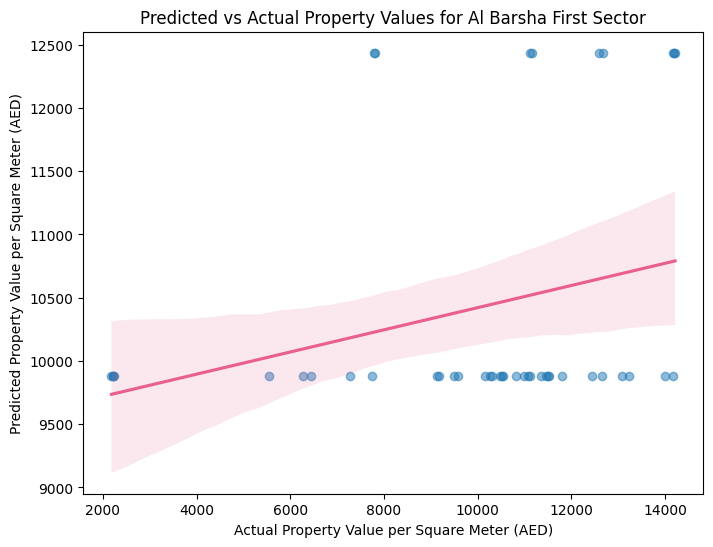

Processing area: Al Barsha South Fifth
MAPE: 0.20515913146503043
RMSE: 3026.0737918241775
all stored successfully

All Variables Analysis for Al Barsha South Fifth:

Model Definition for Al Barsha South Fifth:
Plot saved to: plots/predicted_vs_actual_al_barsha_south_fifth.html


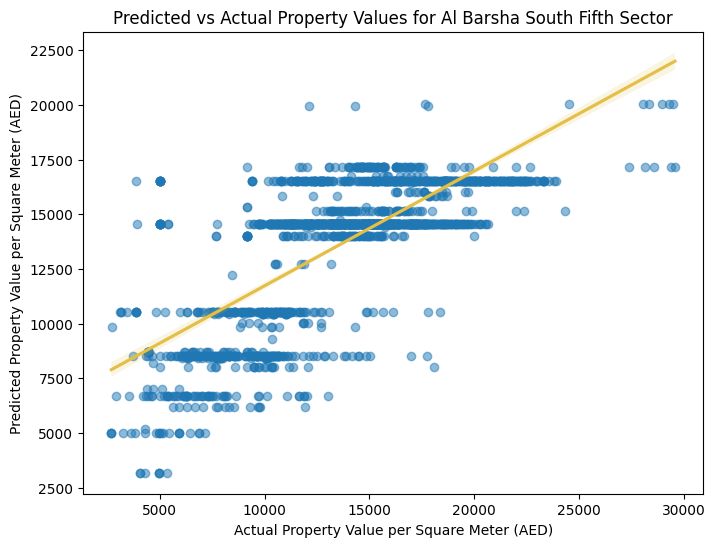

Processing area: Al Barsha South Fourth
MAPE: 0.4079625791773993
RMSE: 3188.5822994166056
all stored successfully

All Variables Analysis for Al Barsha South Fourth:

Model Definition for Al Barsha South Fourth:
Plot saved to: plots/predicted_vs_actual_al_barsha_south_fourth.html


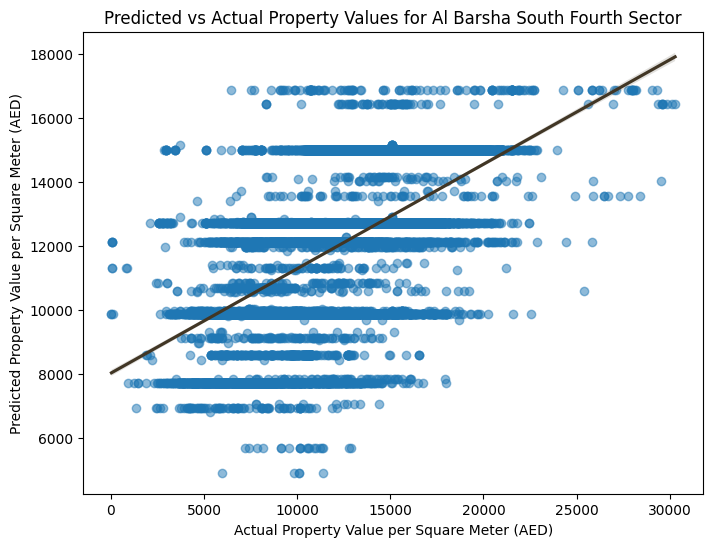

Processing area: Al Barshaa South Second
MAPE: 0.14186762046570878
RMSE: 2522.441223790556
all stored successfully

All Variables Analysis for Al Barshaa South Second:

Model Definition for Al Barshaa South Second:
Plot saved to: plots/predicted_vs_actual_al_barshaa_south_second.html


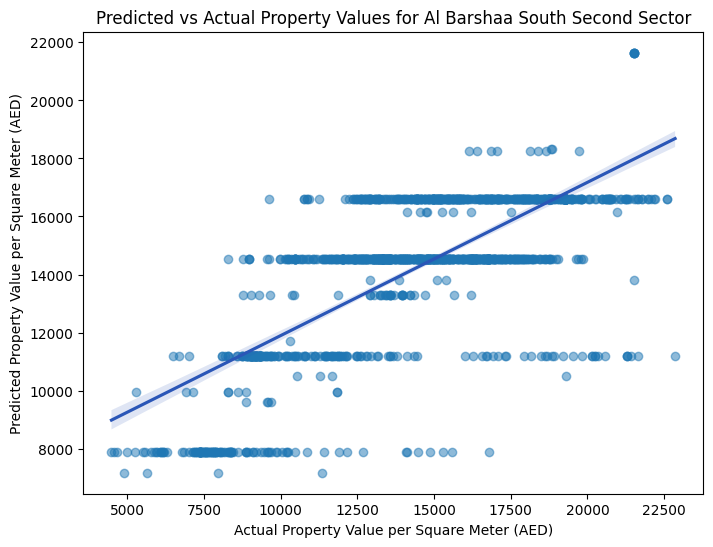

Processing area: Al Barshaa South Third
MAPE: 0.23540912143416465
RMSE: 2616.8781298412555
all stored successfully

All Variables Analysis for Al Barshaa South Third:

Model Definition for Al Barshaa South Third:
Plot saved to: plots/predicted_vs_actual_al_barshaa_south_third.html


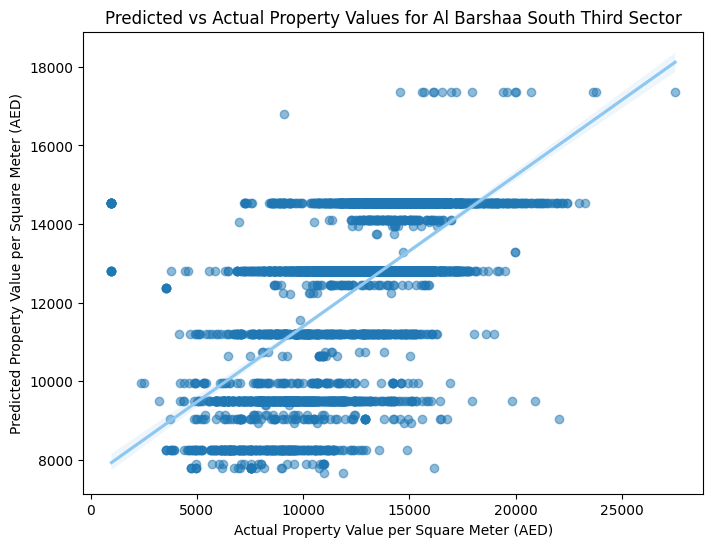

Processing area: Al Goze Fourth
MAPE: 0.23220810571371048
RMSE: 1582.7660844799525
all stored successfully

All Variables Analysis for Al Goze Fourth:

Model Definition for Al Goze Fourth:
Plot saved to: plots/predicted_vs_actual_al_goze_fourth.html


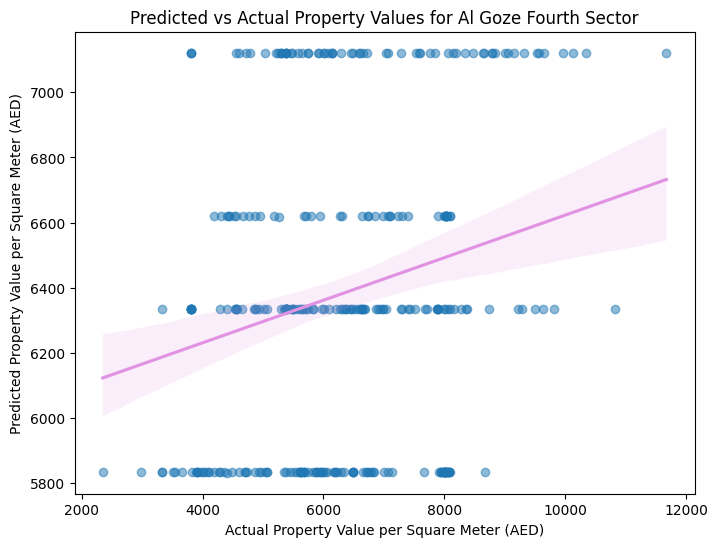

Processing area: Al Hebiah Fifth
MAPE: 0.42787067736544254
RMSE: 2089.379844051662
all stored successfully

All Variables Analysis for Al Hebiah Fifth:

Model Definition for Al Hebiah Fifth:
Plot saved to: plots/predicted_vs_actual_al_hebiah_fifth.html


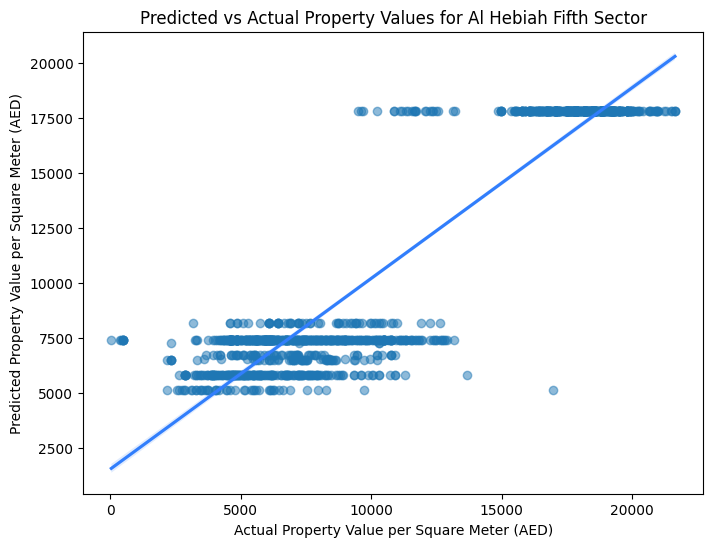

Processing area: Al Hebiah First
MAPE: 0.2026654740027499
RMSE: 2456.2005792041446
all stored successfully

All Variables Analysis for Al Hebiah First:

Model Definition for Al Hebiah First:
Plot saved to: plots/predicted_vs_actual_al_hebiah_first.html


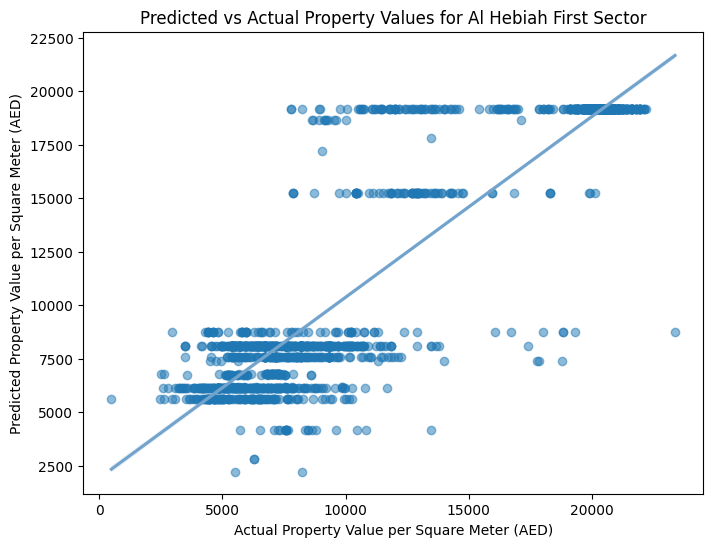

Processing area: Al Hebiah Fourth
MAPE: 0.3724918958388384
RMSE: 3141.8683656247003
all stored successfully

All Variables Analysis for Al Hebiah Fourth:

Model Definition for Al Hebiah Fourth:
Plot saved to: plots/predicted_vs_actual_al_hebiah_fourth.html


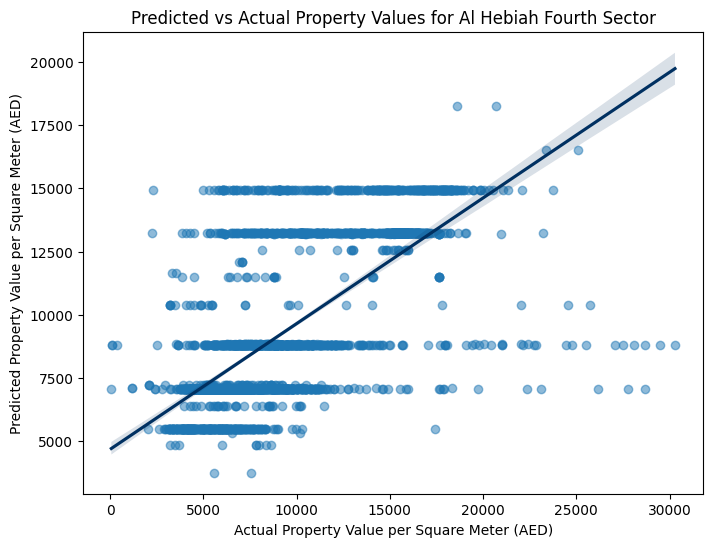

Processing area: Al Hebiah Second
MAPE: 0.188473463125549
RMSE: 2666.951747005469
all stored successfully

All Variables Analysis for Al Hebiah Second:

Model Definition for Al Hebiah Second:
Plot saved to: plots/predicted_vs_actual_al_hebiah_second.html


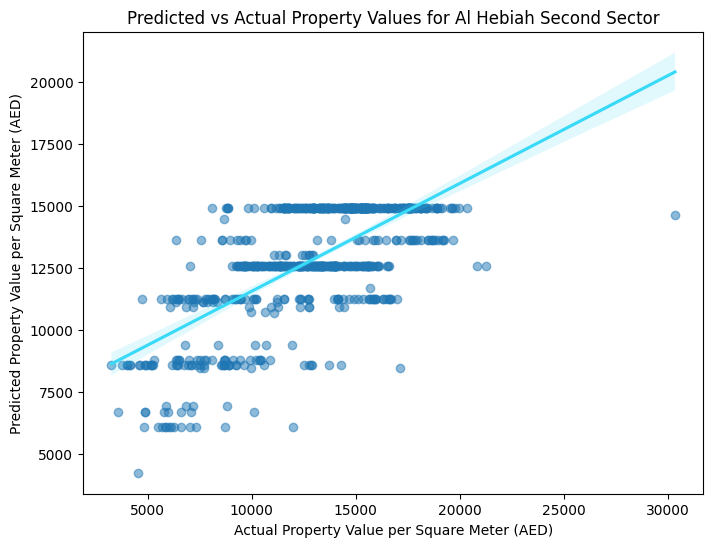

Processing area: Al Hebiah Sixth
MAPE: 0.14415495863572828
RMSE: 1982.7106665971198
all stored successfully

All Variables Analysis for Al Hebiah Sixth:

Model Definition for Al Hebiah Sixth:
Plot saved to: plots/predicted_vs_actual_al_hebiah_sixth.html


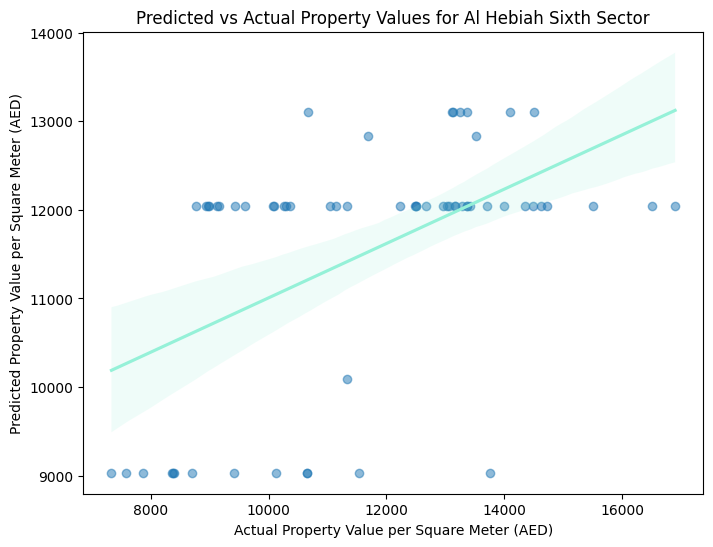

Processing area: Al Hebiah Third
MAPE: 0.1828623473291831
RMSE: 2650.1089712773664
all stored successfully

All Variables Analysis for Al Hebiah Third:

Model Definition for Al Hebiah Third:
Plot saved to: plots/predicted_vs_actual_al_hebiah_third.html


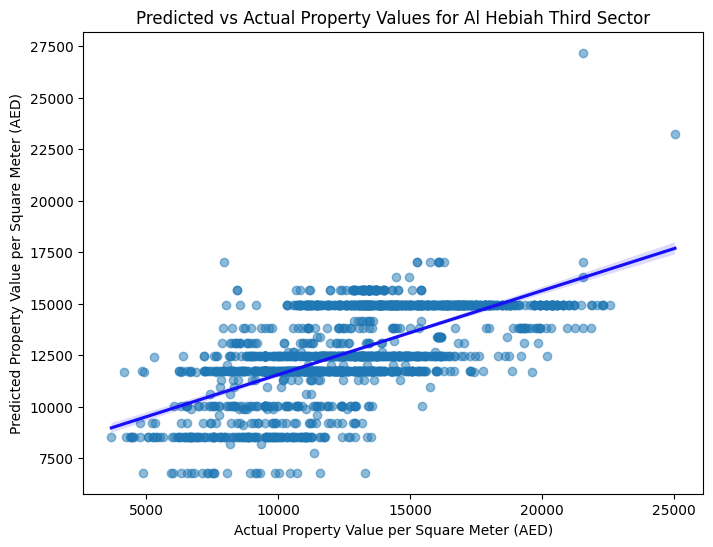

Processing area: Al Jadaf
MAPE: 0.31544867178219604
RMSE: 4724.721158935252
all stored successfully

All Variables Analysis for Al Jadaf:

Model Definition for Al Jadaf:
Plot saved to: plots/predicted_vs_actual_al_jadaf.html


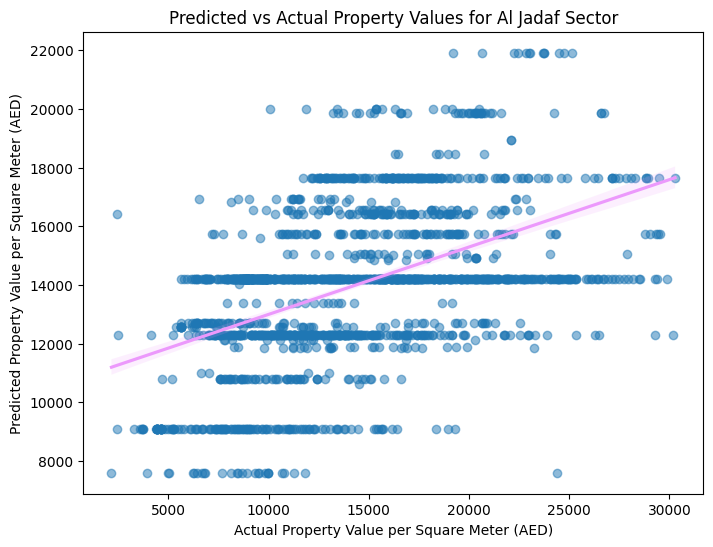

Processing area: Al Khairan First
MAPE: 0.19202994314907637
RMSE: 4092.446957790963
all stored successfully

All Variables Analysis for Al Khairan First:

Model Definition for Al Khairan First:
Plot saved to: plots/predicted_vs_actual_al_khairan_first.html


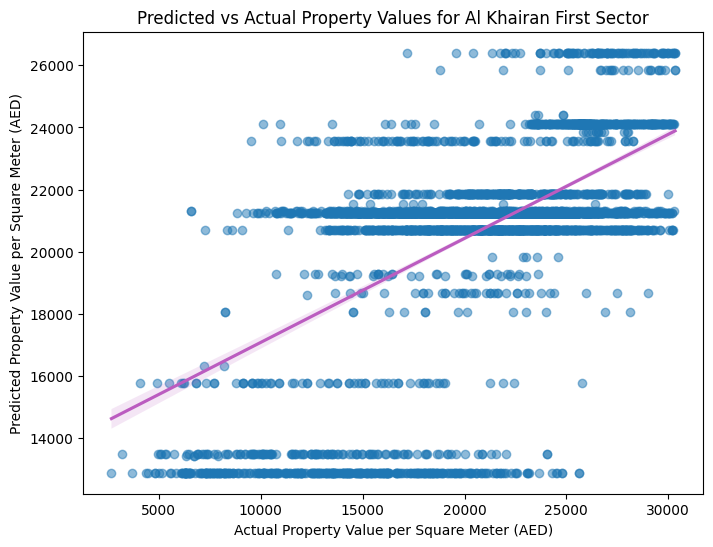

Processing area: Al Kheeran
MAPE: 0.2353392573980321
RMSE: 3279.425734280777
all stored successfully

All Variables Analysis for Al Kheeran:

Model Definition for Al Kheeran:
Plot saved to: plots/predicted_vs_actual_al_kheeran.html


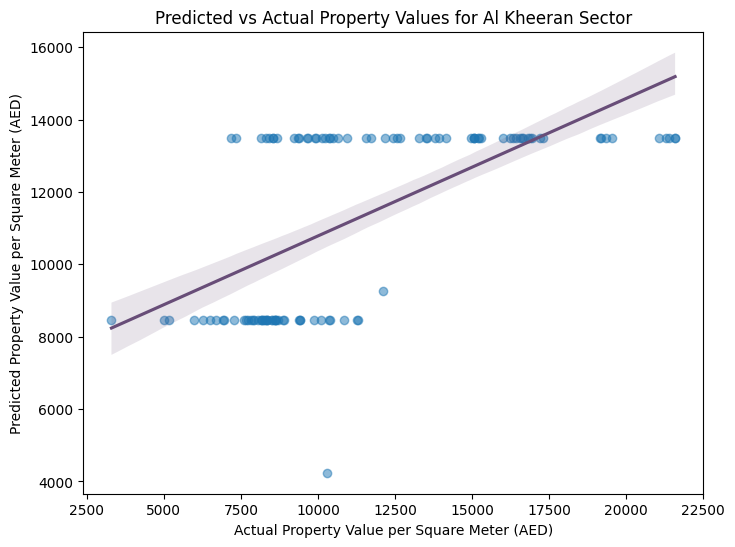

Processing area: Al Kifaf
MAPE: 0.1581734728411008
RMSE: 3104.322107263089
all stored successfully

All Variables Analysis for Al Kifaf:

Model Definition for Al Kifaf:
Plot saved to: plots/predicted_vs_actual_al_kifaf.html


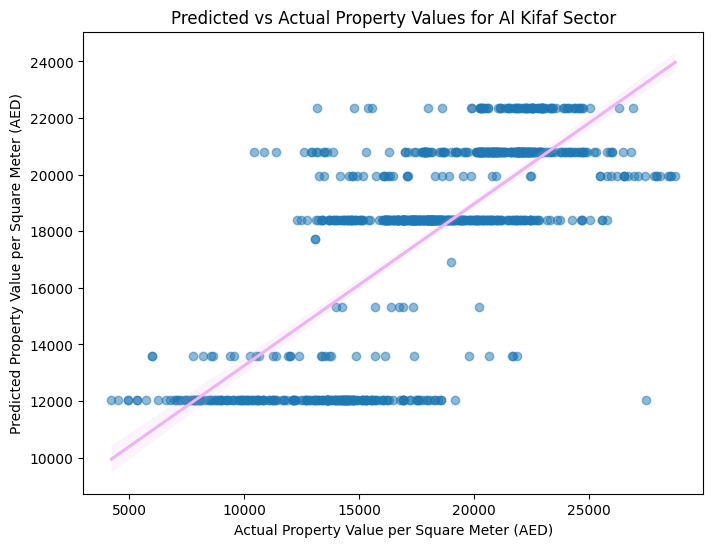

Processing area: Al Merkadh
MAPE: 0.1525845503182935
RMSE: 3395.246042188279
all stored successfully

All Variables Analysis for Al Merkadh:

Model Definition for Al Merkadh:
Plot saved to: plots/predicted_vs_actual_al_merkadh.html


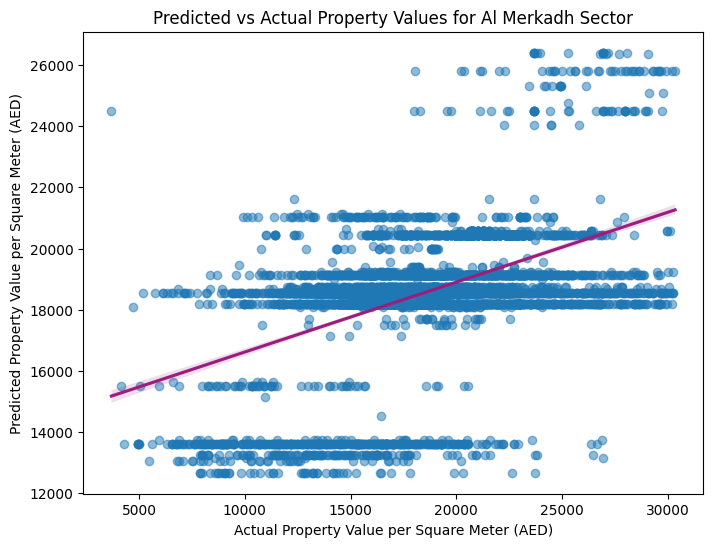

Processing area: Al Qusais Industrial Fifth
MAPE: 0.019631171970024137
RMSE: 211.69596750515086
all stored successfully

All Variables Analysis for Al Qusais Industrial Fifth:

Model Definition for Al Qusais Industrial Fifth:
Plot saved to: plots/predicted_vs_actual_al_qusais_industrial_fifth.html


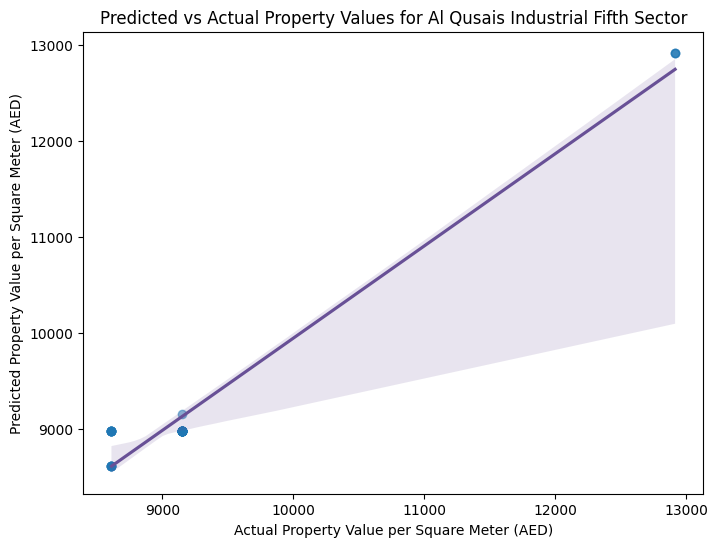

Processing area: Al Qusais Industrial Fourth
MAPE: 0.1307397808548349
RMSE: 1114.3505779974062
all stored successfully

All Variables Analysis for Al Qusais Industrial Fourth:

Model Definition for Al Qusais Industrial Fourth:
Plot saved to: plots/predicted_vs_actual_al_qusais_industrial_fourth.html


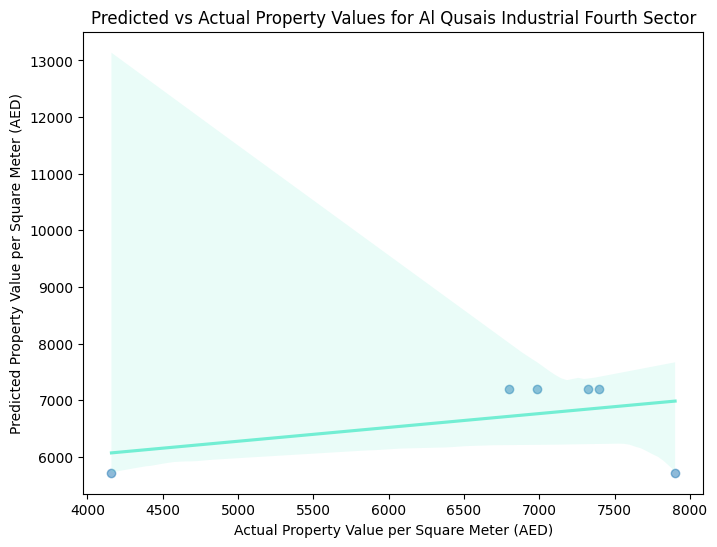

Processing area: Al Safouh First
MAPE: 0.16279960630065707
RMSE: 2735.660128801387
all stored successfully

All Variables Analysis for Al Safouh First:

Model Definition for Al Safouh First:
Plot saved to: plots/predicted_vs_actual_al_safouh_first.html


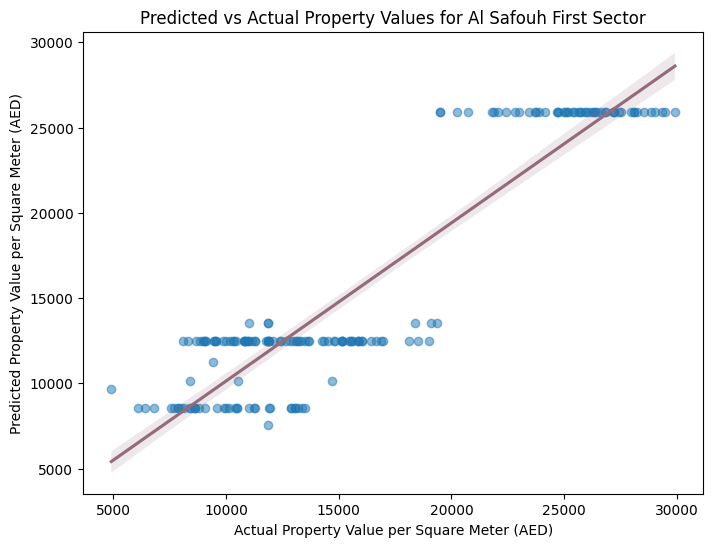

Processing area: Al Safouh Second
MAPE: 0.0828154661952052
RMSE: 2365.8127622913275
all stored successfully

All Variables Analysis for Al Safouh Second:

Model Definition for Al Safouh Second:
Plot saved to: plots/predicted_vs_actual_al_safouh_second.html


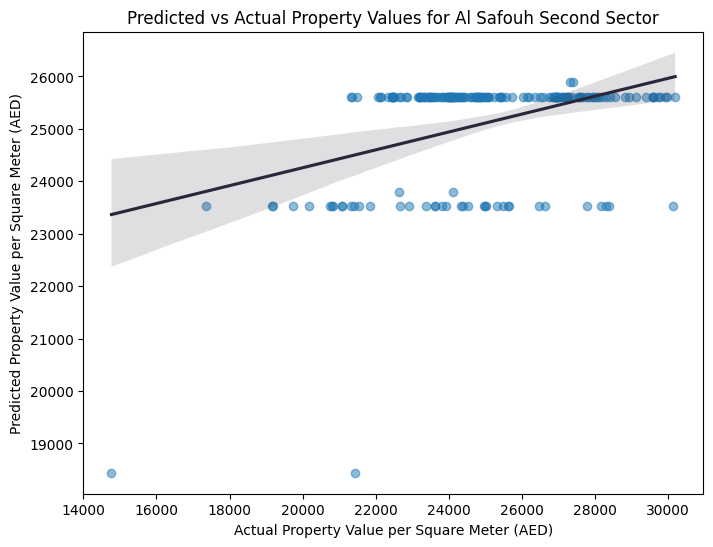

Processing area: Al Satwa
MAPE: 0.1574601208032254
RMSE: 3873.5348047329207
all stored successfully

All Variables Analysis for Al Satwa:

Model Definition for Al Satwa:
Plot saved to: plots/predicted_vs_actual_al_satwa.html


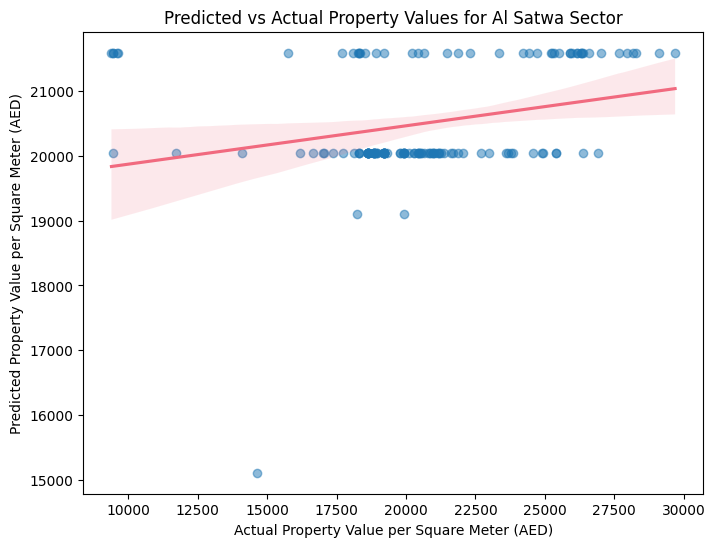

Processing area: Al Thanayah Fourth
Skipping area 'Al Thanayah Fourth': Error during SFS fit - Cannot have number of splits n_splits=5 greater than the number of samples: n_samples=3.
Processing area: Al Thanyah Fifth
MAPE: 0.5085872582360095
RMSE: 4953.715373941047
all stored successfully

All Variables Analysis for Al Thanyah Fifth:

Model Definition for Al Thanyah Fifth:
Plot saved to: plots/predicted_vs_actual_al_thanyah_fifth.html


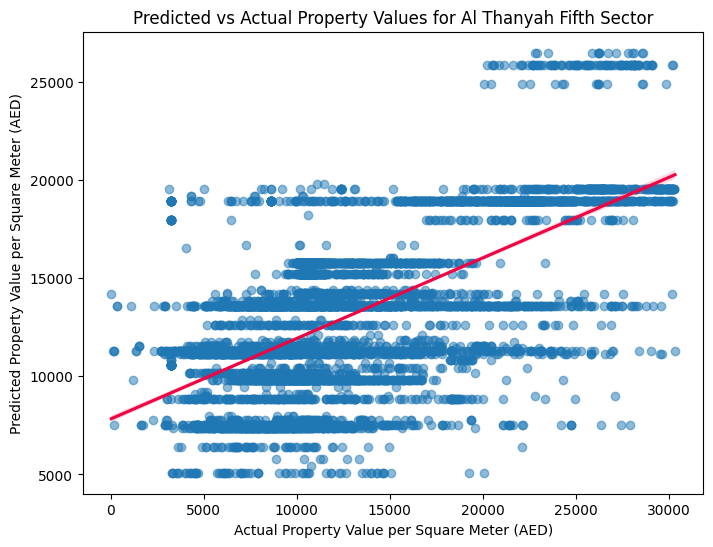

Processing area: Al Thanyah First
MAPE: 0.3437851105458775
RMSE: 4621.728938961778
all stored successfully

All Variables Analysis for Al Thanyah First:

Model Definition for Al Thanyah First:
Plot saved to: plots/predicted_vs_actual_al_thanyah_first.html


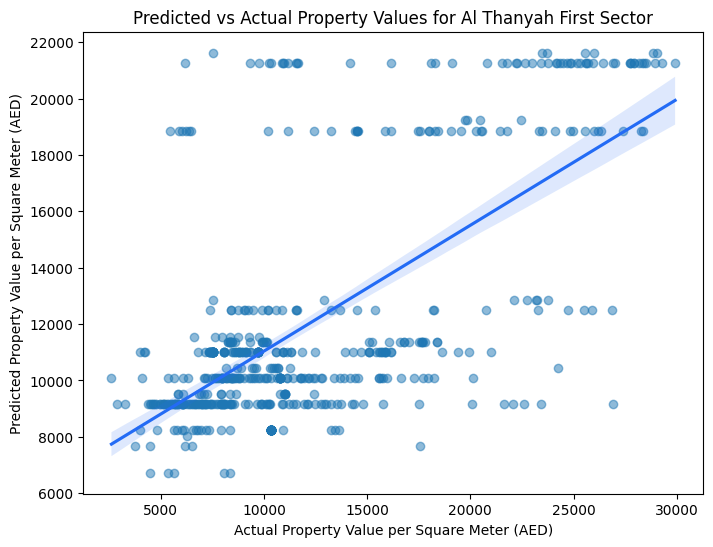

Processing area: Al Thanyah Third
MAPE: 0.404087571398107
RMSE: 4057.0405606355052
all stored successfully

All Variables Analysis for Al Thanyah Third:

Model Definition for Al Thanyah Third:
Plot saved to: plots/predicted_vs_actual_al_thanyah_third.html


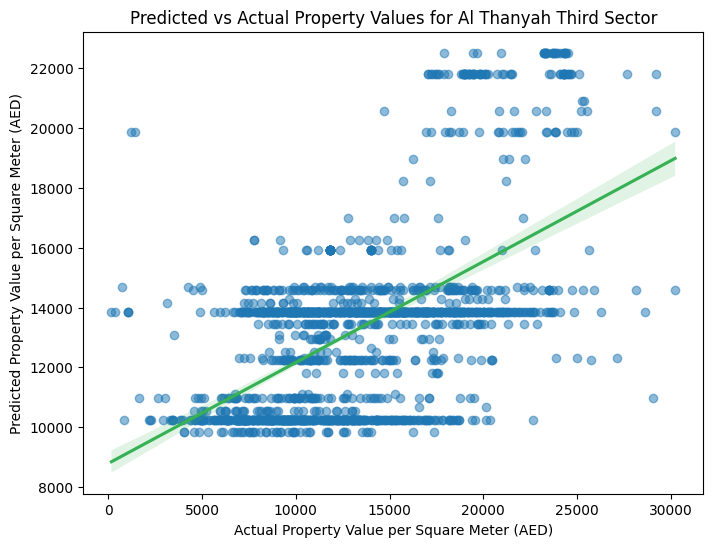

Processing area: Al Warsan First
MAPE: 0.1938013336460709
RMSE: 1633.289762623089
all stored successfully

All Variables Analysis for Al Warsan First:

Model Definition for Al Warsan First:
Plot saved to: plots/predicted_vs_actual_al_warsan_first.html


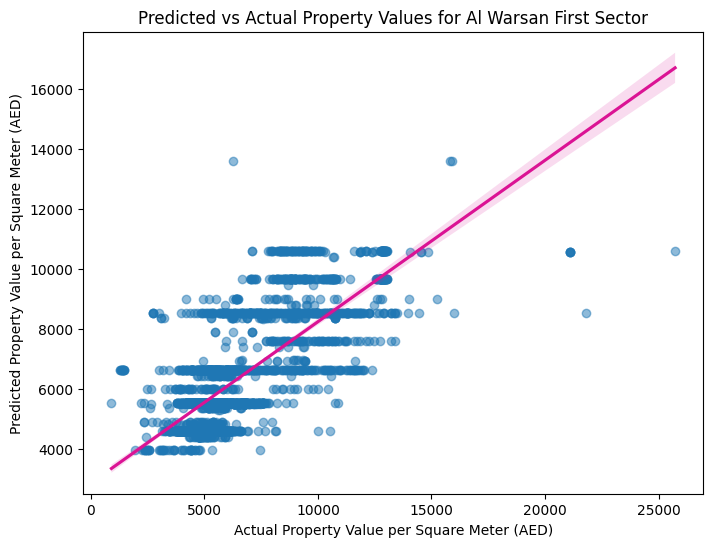

Processing area: Al Wasl
MAPE: 0.18918190200676743
RMSE: 3798.009325554195
all stored successfully

All Variables Analysis for Al Wasl:

Model Definition for Al Wasl:
Plot saved to: plots/predicted_vs_actual_al_wasl.html


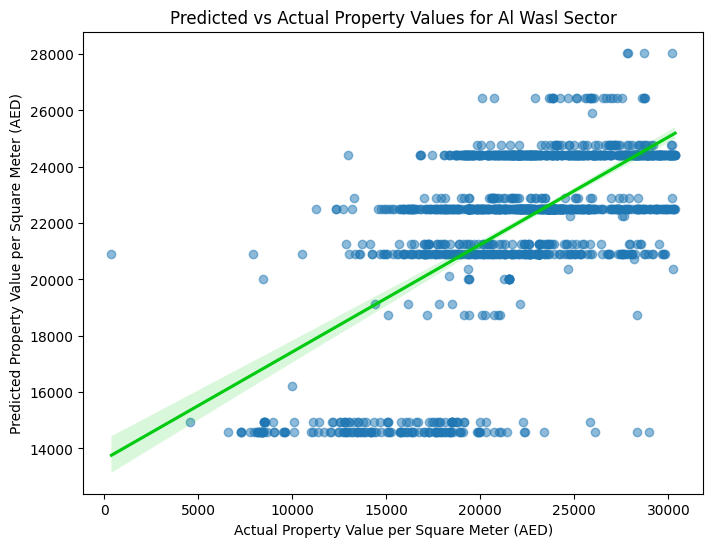

Processing area: Al Yelayiss 2
MAPE: 0.1756457055610674
RMSE: 2018.4963871676268
all stored successfully

All Variables Analysis for Al Yelayiss 2:

Model Definition for Al Yelayiss 2:
Plot saved to: plots/predicted_vs_actual_al_yelayiss_2.html


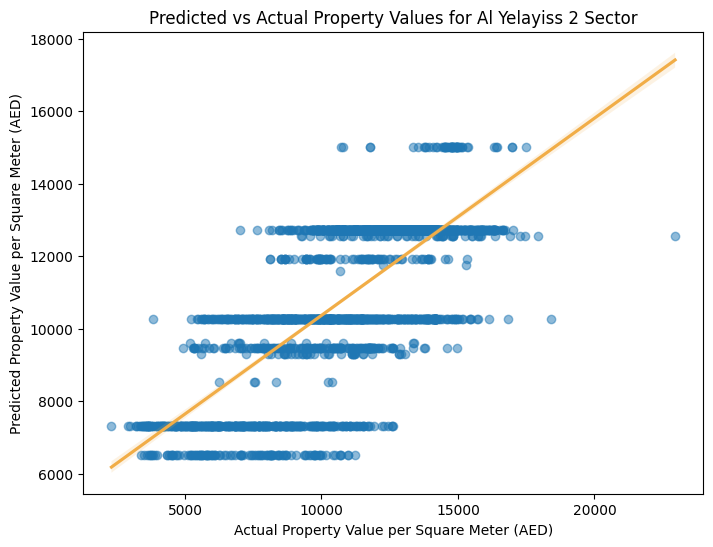

Processing area: Bukadra
MAPE: 0.048282287079168665
RMSE: 1488.453793671579
all stored successfully

All Variables Analysis for Bukadra:

Model Definition for Bukadra:
Plot saved to: plots/predicted_vs_actual_bukadra.html


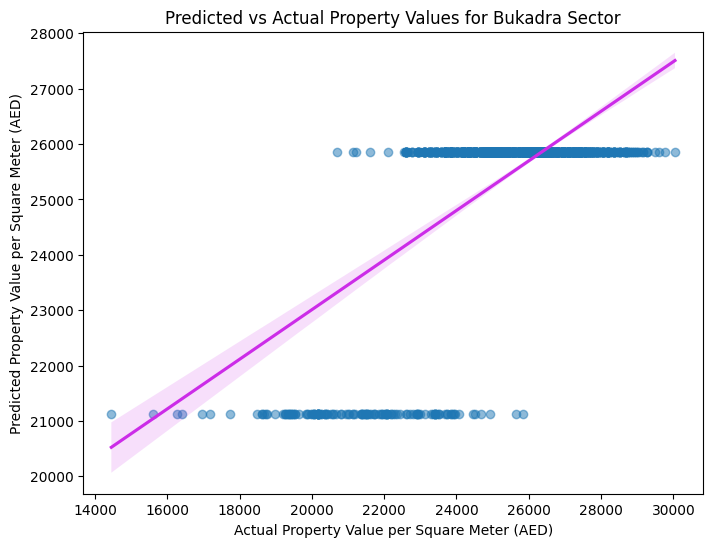

Processing area: Burj Khalifa
MAPE: 0.4216386533588983
RMSE: 5566.454690864052
all stored successfully

All Variables Analysis for Burj Khalifa:

Model Definition for Burj Khalifa:
Plot saved to: plots/predicted_vs_actual_burj_khalifa.html


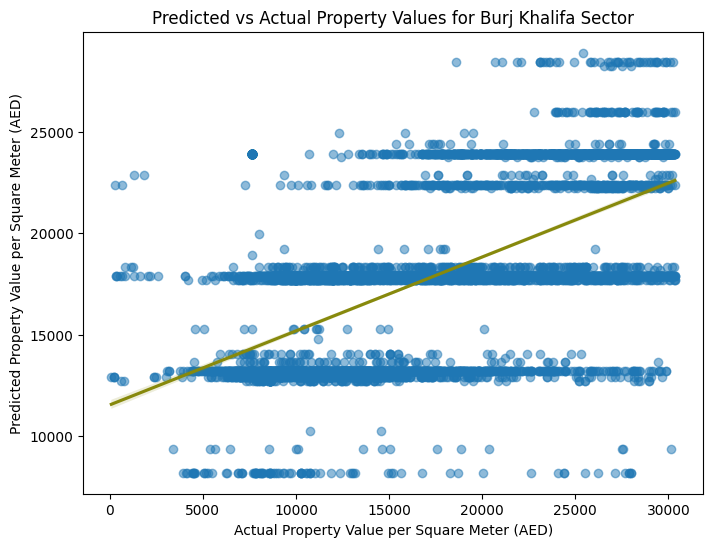

Processing area: Business Bay
MAPE: 0.28182527768464044
RMSE: 4863.407998834515
all stored successfully

All Variables Analysis for Business Bay:

Model Definition for Business Bay:
Plot saved to: plots/predicted_vs_actual_business_bay.html


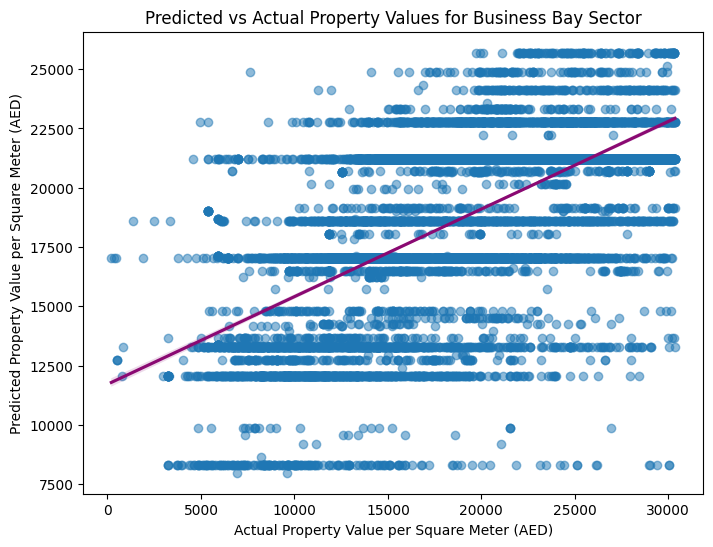

Processing area: Dubai Investment Park First
MAPE: 0.21482788794921245
RMSE: 2176.0180700078818
all stored successfully

All Variables Analysis for Dubai Investment Park First:

Model Definition for Dubai Investment Park First:
Plot saved to: plots/predicted_vs_actual_dubai_investment_park_first.html


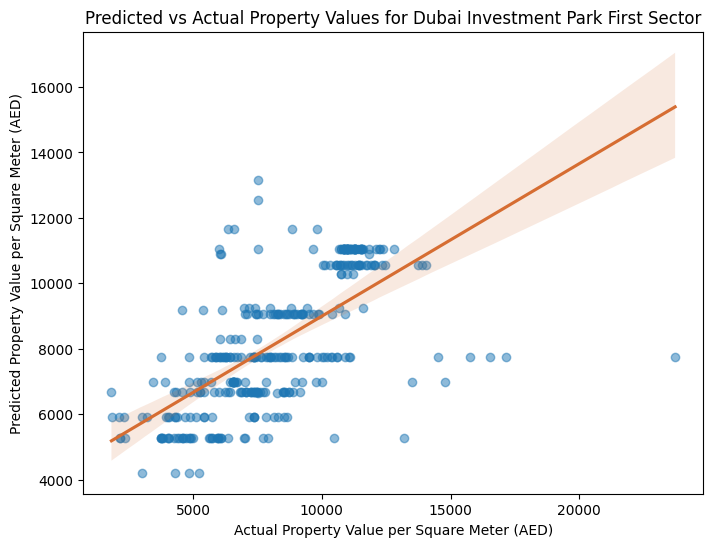

Processing area: Dubai Investment Park Second
MAPE: 0.17612661105305039
RMSE: 1526.945716642636
all stored successfully

All Variables Analysis for Dubai Investment Park Second:

Model Definition for Dubai Investment Park Second:
Plot saved to: plots/predicted_vs_actual_dubai_investment_park_second.html


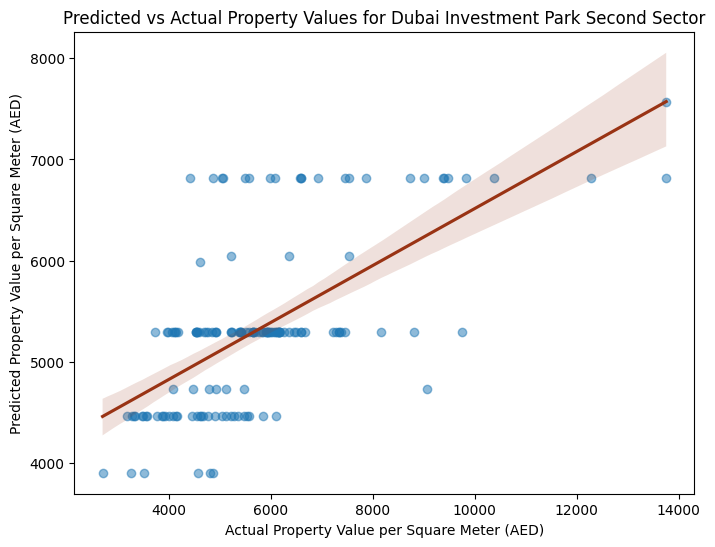

Processing area: Hadaeq Sheikh Mohammed Bin Rashid
MAPE: 0.19185357758494637
RMSE: 3891.4077332714955
all stored successfully

All Variables Analysis for Hadaeq Sheikh Mohammed Bin Rashid:

Model Definition for Hadaeq Sheikh Mohammed Bin Rashid:
Plot saved to: plots/predicted_vs_actual_hadaeq_sheikh_mohammed_bin_rashid.html


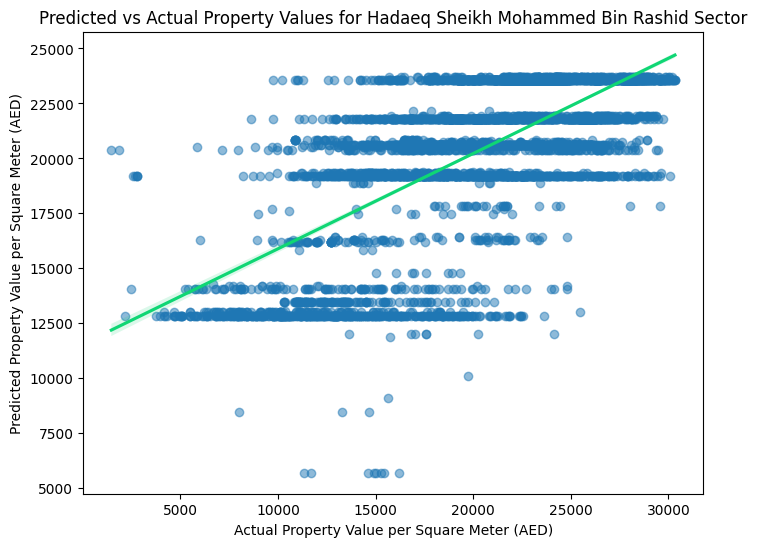

Processing area: Hessyan First
MAPE: 0.4599751385705453
Skipping area with negative R-squared or invalid MAPE: Hessyan First
Processing area: Island 2
MAPE: 0.34042469222372196
Skipping area with negative R-squared or invalid MAPE: Island 2
Processing area: Jabal Ali
MAPE: 0.2287722786012085
RMSE: 1498.3586710105858
all stored successfully

All Variables Analysis for Jabal Ali:

Model Definition for Jabal Ali:
Plot saved to: plots/predicted_vs_actual_jabal_ali.html


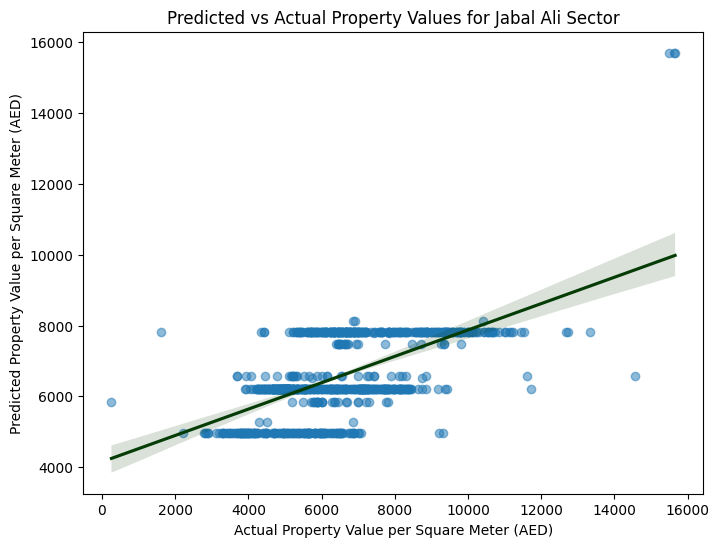

Processing area: Jabal Ali First
MAPE: 0.1760419705217672
RMSE: 2259.750033865972
all stored successfully

All Variables Analysis for Jabal Ali First:

Model Definition for Jabal Ali First:
Plot saved to: plots/predicted_vs_actual_jabal_ali_first.html


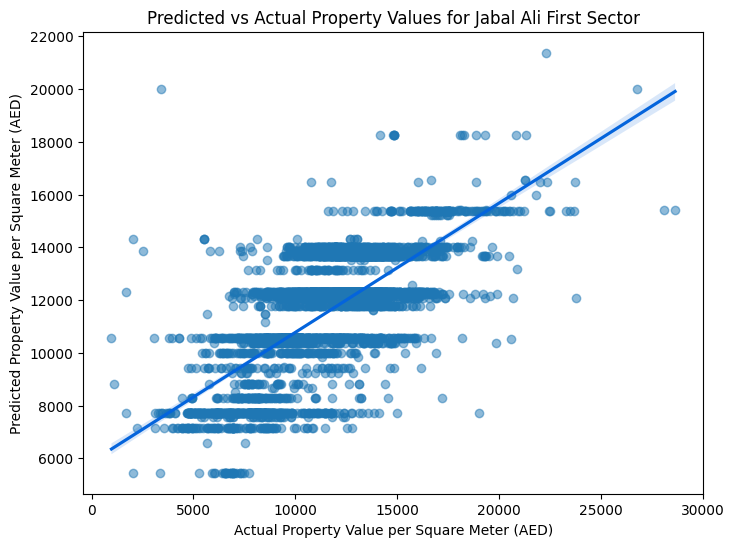

Processing area: Jabal Ali Industrial Second
MAPE: 0.19879410237947326
RMSE: 2322.0833241942123
all stored successfully

All Variables Analysis for Jabal Ali Industrial Second:

Model Definition for Jabal Ali Industrial Second:
Plot saved to: plots/predicted_vs_actual_jabal_ali_industrial_second.html


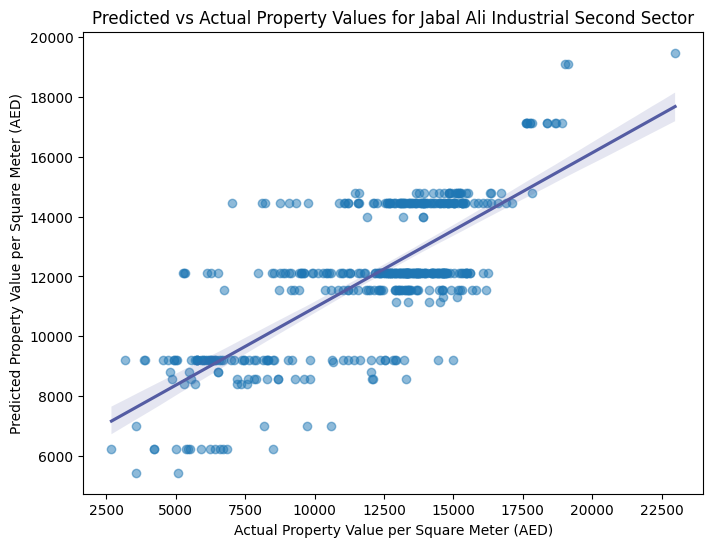

Processing area: Jumeirah First
MAPE: 0.12676887757919833
RMSE: 3326.0848656446838
all stored successfully

All Variables Analysis for Jumeirah First:

Model Definition for Jumeirah First:
Plot saved to: plots/predicted_vs_actual_jumeirah_first.html


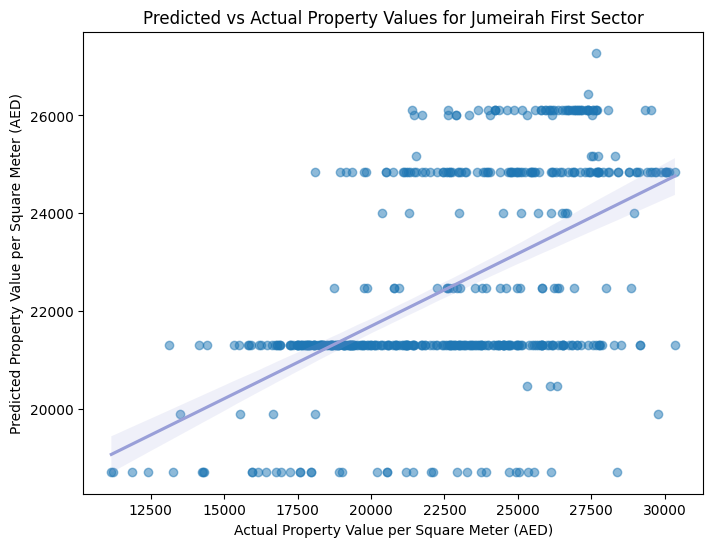

Skipping area 'Jumeirah Second': Not enough samples (1) for cross-validation.
Processing area: Madinat Al Mataar
MAPE: 0.2049499186537961
RMSE: 2899.264652416532
all stored successfully

All Variables Analysis for Madinat Al Mataar:

Model Definition for Madinat Al Mataar:
Plot saved to: plots/predicted_vs_actual_madinat_al_mataar.html


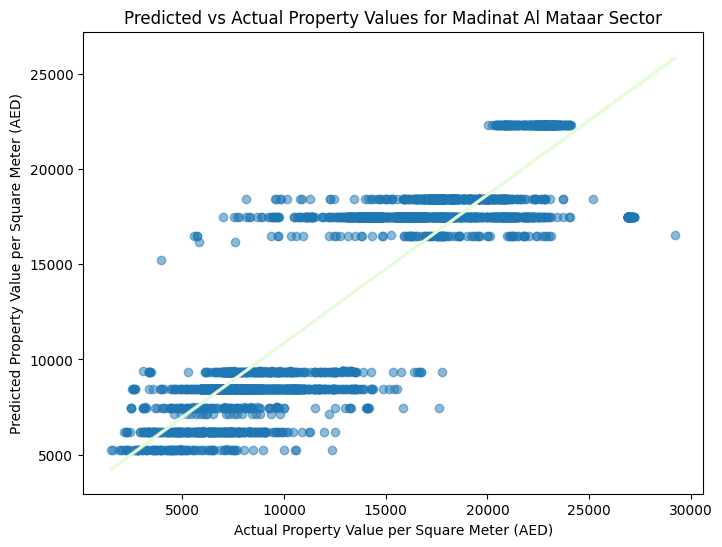

Processing area: Madinat Dubai Almelaheyah
MAPE: 0.1257700123840182
RMSE: 3428.0834218384643
all stored successfully

All Variables Analysis for Madinat Dubai Almelaheyah:

Model Definition for Madinat Dubai Almelaheyah:
Plot saved to: plots/predicted_vs_actual_madinat_dubai_almelaheyah.html


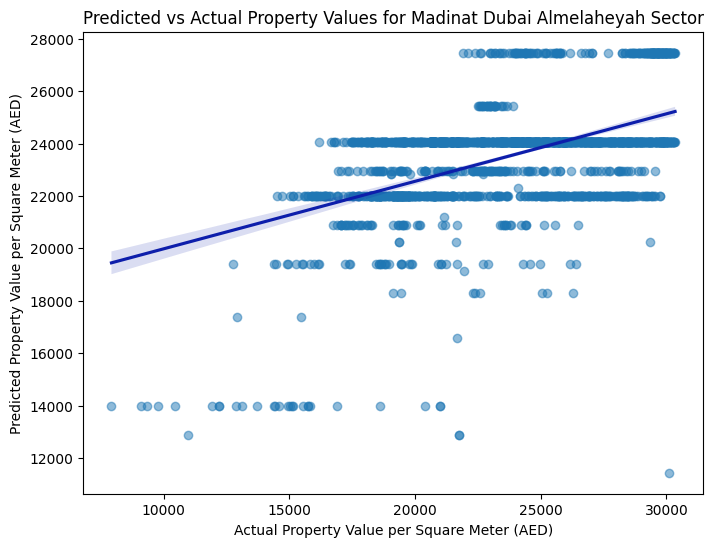

Processing area: Madinat Hind 4
MAPE: 0.11863252406356563
RMSE: 1742.5851732567064
all stored successfully

All Variables Analysis for Madinat Hind 4:

Model Definition for Madinat Hind 4:
Plot saved to: plots/predicted_vs_actual_madinat_hind_4.html


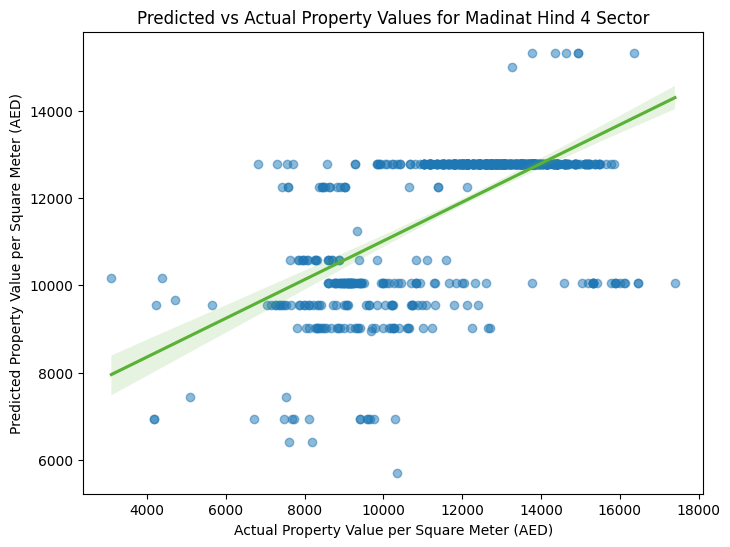

Processing area: Marsa Dubai
MAPE: 0.48446215057036446
RMSE: 5165.669523325511
all stored successfully

All Variables Analysis for Marsa Dubai:

Model Definition for Marsa Dubai:
Plot saved to: plots/predicted_vs_actual_marsa_dubai.html


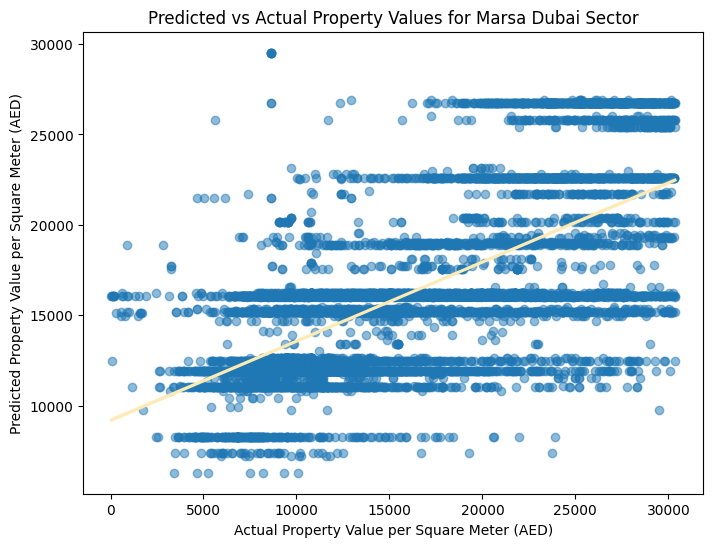

Processing area: Me'Aisem First
MAPE: 0.25952141138984086
RMSE: 2511.8898859670726
all stored successfully

All Variables Analysis for Me'Aisem First:

Model Definition for Me'Aisem First:
Plot saved to: plots/predicted_vs_actual_me'aisem_first.html


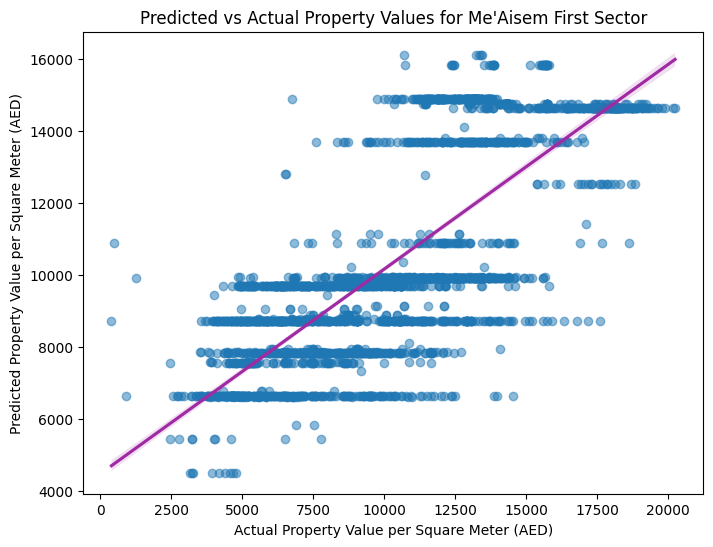

Processing area: Mirdif
MAPE: 0.19048575472461948
RMSE: 2347.7734549543825
all stored successfully

All Variables Analysis for Mirdif:

Model Definition for Mirdif:
Plot saved to: plots/predicted_vs_actual_mirdif.html


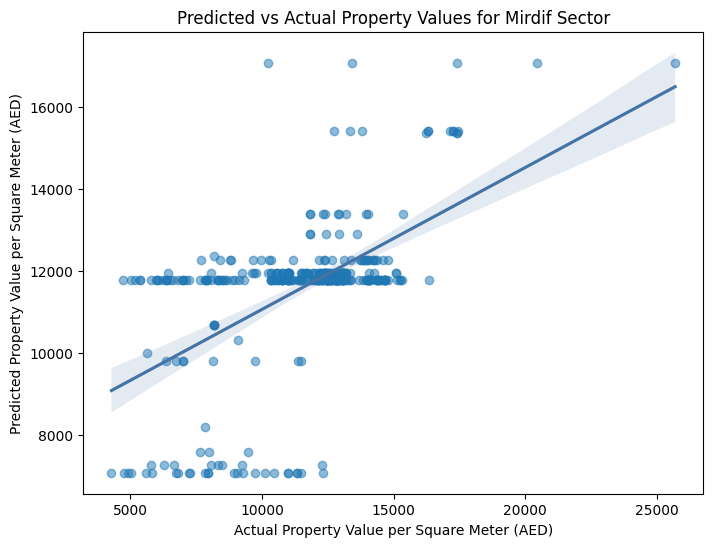

Processing area: Muhaisanah First
MAPE: 0.08933720365929246
RMSE: 1371.3197769486678
all stored successfully

All Variables Analysis for Muhaisanah First:

Model Definition for Muhaisanah First:
Plot saved to: plots/predicted_vs_actual_muhaisanah_first.html


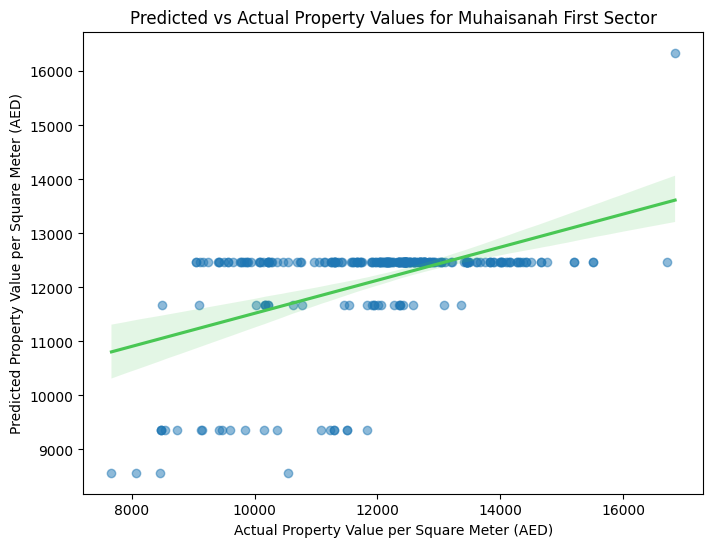

Processing area: Nad Al Hamar
MAPE: 0.042691915941662904
RMSE: 563.1783211278588
all stored successfully

All Variables Analysis for Nad Al Hamar:

Model Definition for Nad Al Hamar:
Plot saved to: plots/predicted_vs_actual_nad_al_hamar.html


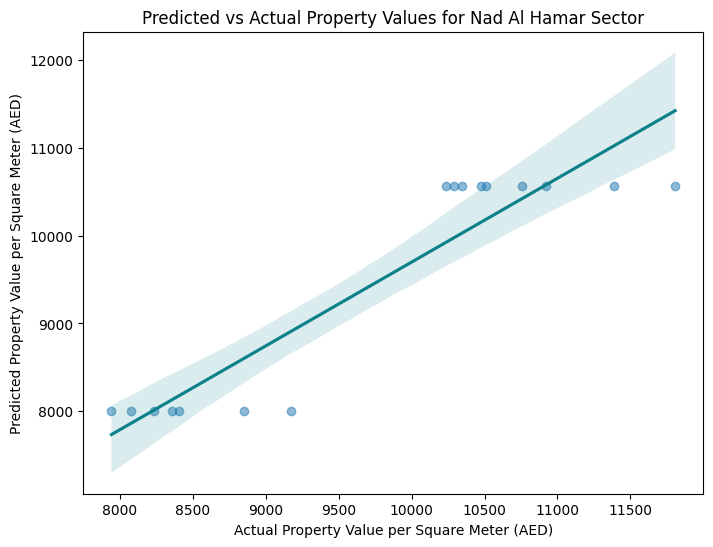

Processing area: Nad Al Shiba
MAPE: 0.2715945039675292
RMSE: 2375.7456316565454
all stored successfully

All Variables Analysis for Nad Al Shiba:

Model Definition for Nad Al Shiba:
Plot saved to: plots/predicted_vs_actual_nad_al_shiba.html


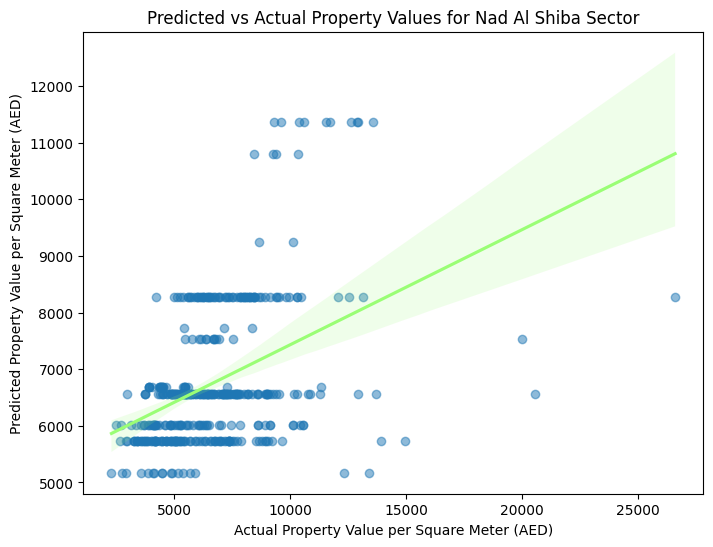

Processing area: Nad Al Shiba First
MAPE: 0.2153534295915834
RMSE: 2923.9154675031477
all stored successfully

All Variables Analysis for Nad Al Shiba First:

Model Definition for Nad Al Shiba First:
Plot saved to: plots/predicted_vs_actual_nad_al_shiba_first.html


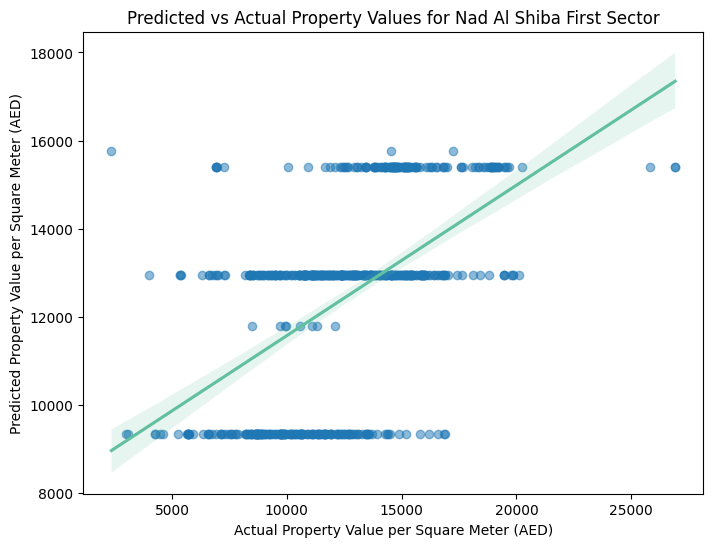

Processing area: Nadd Hessa
MAPE: 0.4951905847408709
RMSE: 3117.059231159669
all stored successfully

All Variables Analysis for Nadd Hessa:

Model Definition for Nadd Hessa:
Plot saved to: plots/predicted_vs_actual_nadd_hessa.html


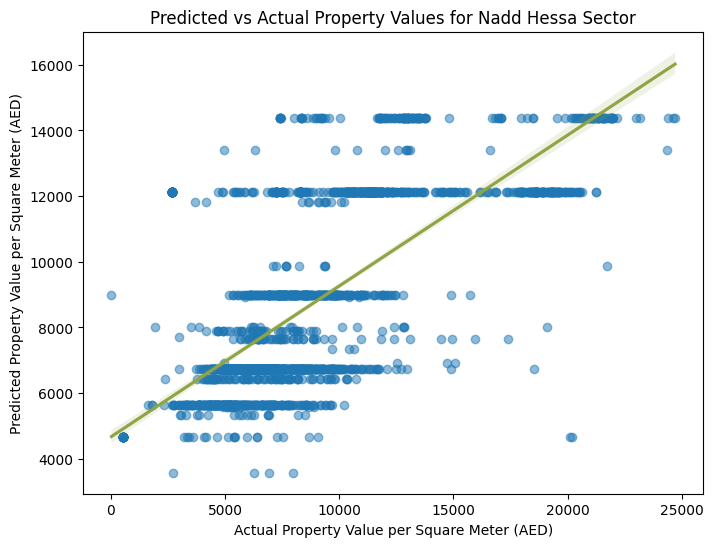

Processing area: Palm Deira
MAPE: 0.1305455933326296
RMSE: 3626.7998134012405
all stored successfully

All Variables Analysis for Palm Deira:

Model Definition for Palm Deira:
Plot saved to: plots/predicted_vs_actual_palm_deira.html


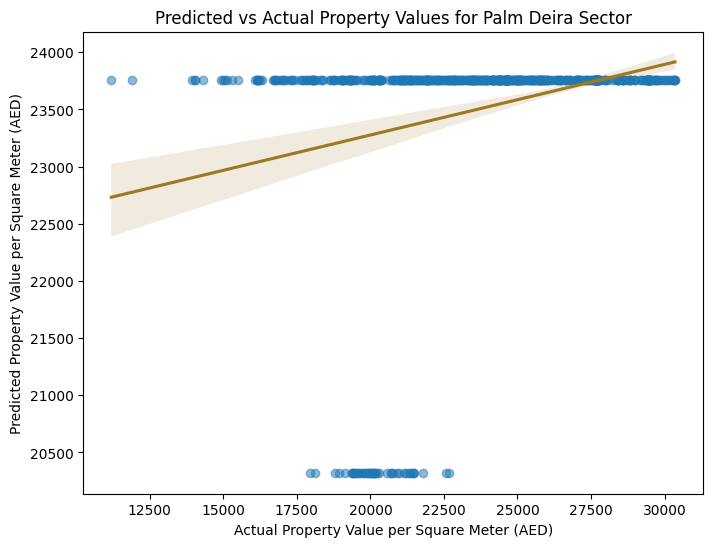

Processing area: Palm Jumeirah
MAPE: 0.36535124898965343
RMSE: 5485.102144705981
all stored successfully

All Variables Analysis for Palm Jumeirah:

Model Definition for Palm Jumeirah:
Plot saved to: plots/predicted_vs_actual_palm_jumeirah.html


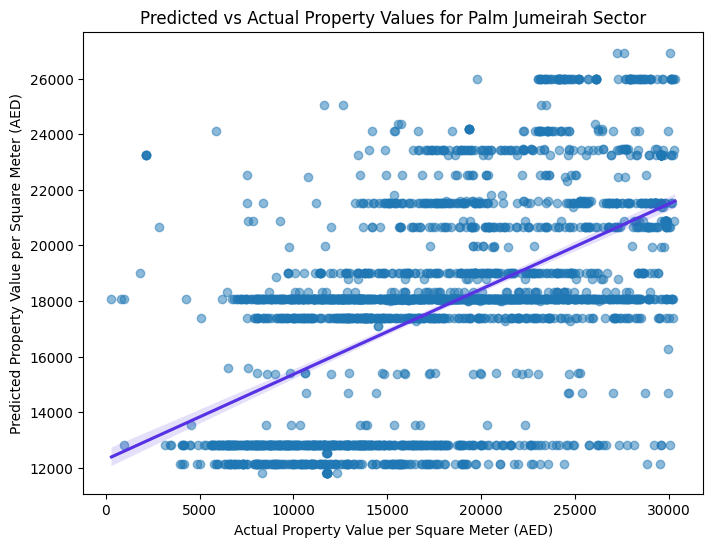

Processing area: Port Saeed
MAPE: 0.3081635463709453
Skipping area with negative R-squared or invalid MAPE: Port Saeed
Processing area: Ras Al Khor Industrial First
MAPE: 0.049708180495585695
RMSE: 1406.8733395326578
all stored successfully

All Variables Analysis for Ras Al Khor Industrial First:

Model Definition for Ras Al Khor Industrial First:
Plot saved to: plots/predicted_vs_actual_ras_al_khor_industrial_first.html


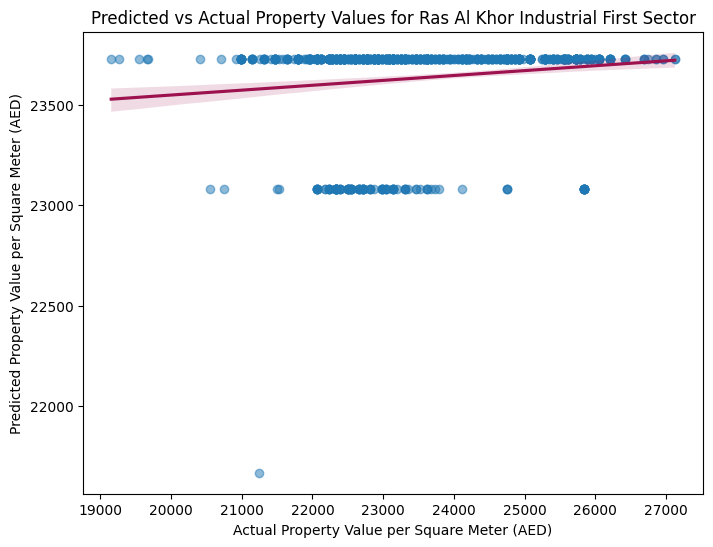

Processing area: Rega Al Buteen
MAPE: 0.1861164329124348
Skipping area with negative R-squared or invalid MAPE: Rega Al Buteen
Processing area: Saih Shuaib 2
MAPE: 0.13923682891785463
RMSE: 2213.1515264237532
all stored successfully

All Variables Analysis for Saih Shuaib 2:

Model Definition for Saih Shuaib 2:
Plot saved to: plots/predicted_vs_actual_saih_shuaib_2.html


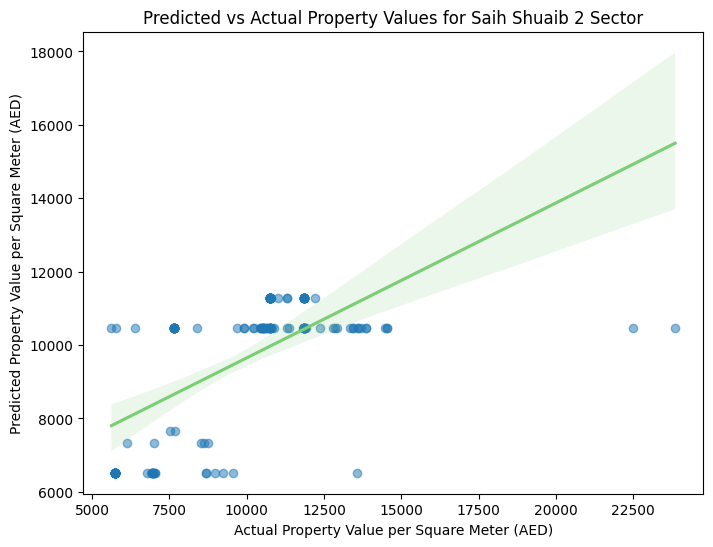

Processing area: Trade Center First
MAPE: 0.4069819152584648
Skipping area with negative R-squared or invalid MAPE: Trade Center First
Processing area: Trade Center Second
MAPE: 0.3123505669390143
RMSE: 3410.027480129125
all stored successfully

All Variables Analysis for Trade Center Second:

Model Definition for Trade Center Second:
Plot saved to: plots/predicted_vs_actual_trade_center_second.html


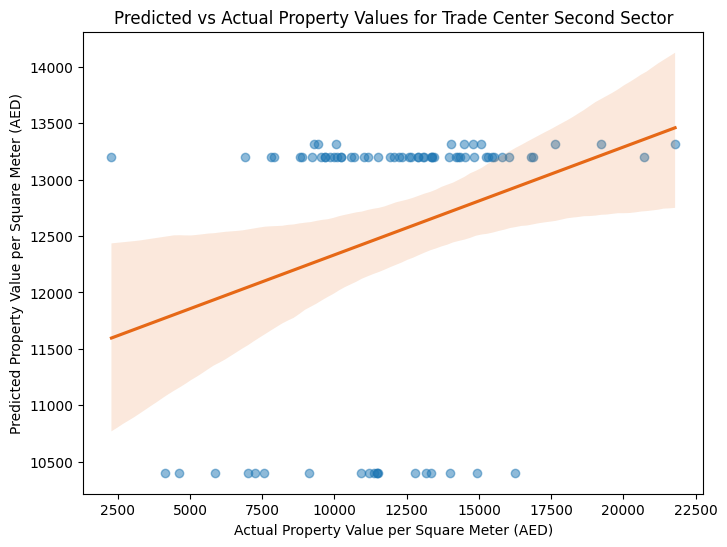

Processing area: Um Hurair Second
MAPE: 0.2240934749287809
Skipping area with negative R-squared or invalid MAPE: Um Hurair Second
Processing area: Um Suqaim Third
MAPE: 0.1208639764481704
RMSE: 3260.520241980167
all stored successfully

All Variables Analysis for Um Suqaim Third:

Model Definition for Um Suqaim Third:
Plot saved to: plots/predicted_vs_actual_um_suqaim_third.html


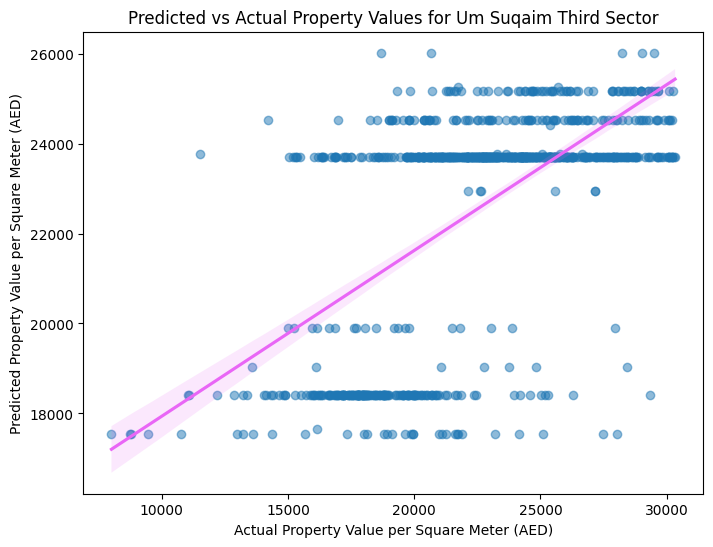

Processing area: Wadi Al Safa 2
MAPE: 0.24185802319103605
RMSE: 2057.608018231545
all stored successfully

All Variables Analysis for Wadi Al Safa 2:

Model Definition for Wadi Al Safa 2:
Plot saved to: plots/predicted_vs_actual_wadi_al_safa_2.html


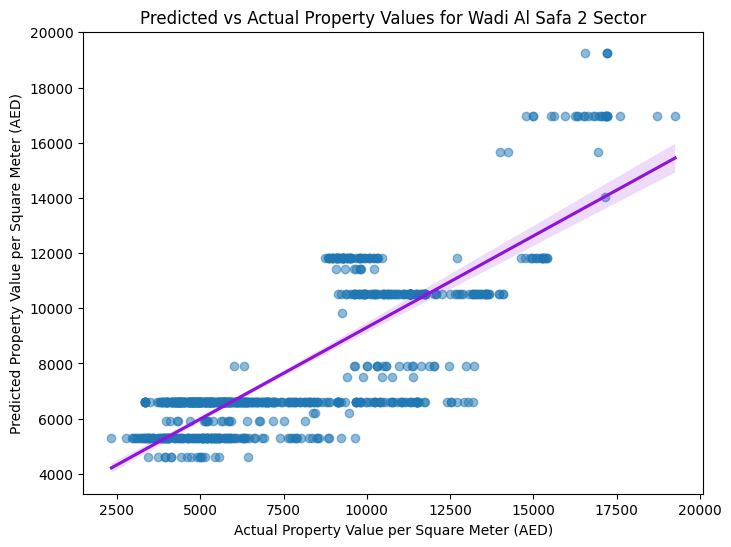

Processing area: Wadi Al Safa 3
MAPE: 0.26352215736354795
RMSE: 3380.698398461971
all stored successfully

All Variables Analysis for Wadi Al Safa 3:

Model Definition for Wadi Al Safa 3:
Plot saved to: plots/predicted_vs_actual_wadi_al_safa_3.html


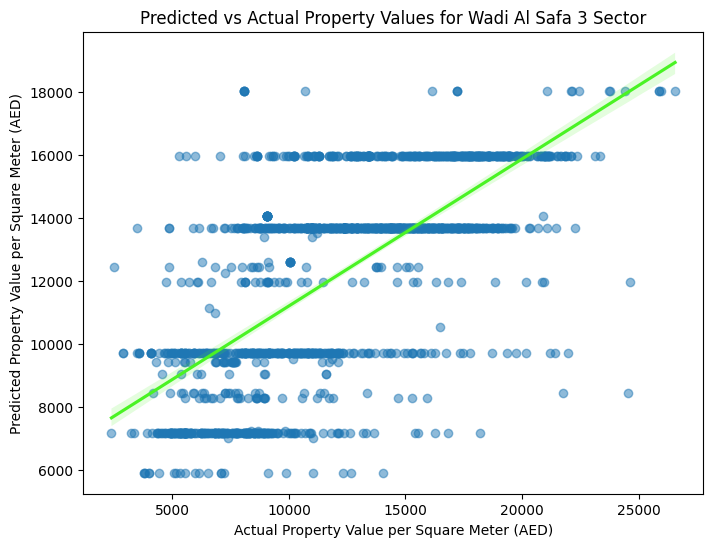

Processing area: Wadi Al Safa 4
MAPE: 0.11718567292242536
RMSE: 2369.6672756223966
all stored successfully

All Variables Analysis for Wadi Al Safa 4:

Model Definition for Wadi Al Safa 4:
Plot saved to: plots/predicted_vs_actual_wadi_al_safa_4.html


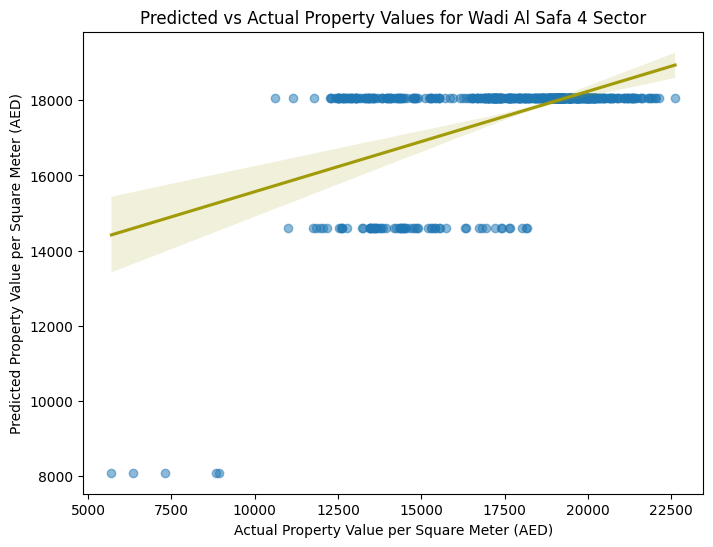

Processing area: Wadi Al Safa 5
MAPE: 0.2327275971657656
RMSE: 2449.7445839296597
all stored successfully

All Variables Analysis for Wadi Al Safa 5:

Model Definition for Wadi Al Safa 5:
Plot saved to: plots/predicted_vs_actual_wadi_al_safa_5.html


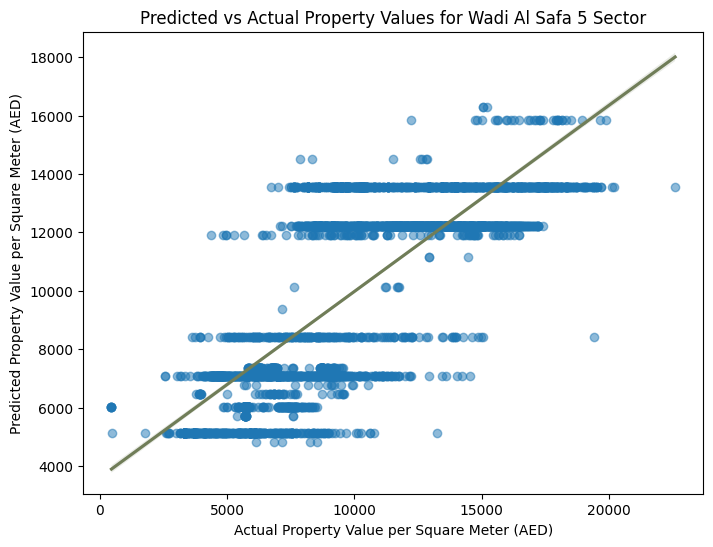

Processing area: Wadi Al Safa 7
MAPE: 0.5907592027307471
RMSE: 2096.4485046307377
all stored successfully

All Variables Analysis for Wadi Al Safa 7:

Model Definition for Wadi Al Safa 7:
Plot saved to: plots/predicted_vs_actual_wadi_al_safa_7.html


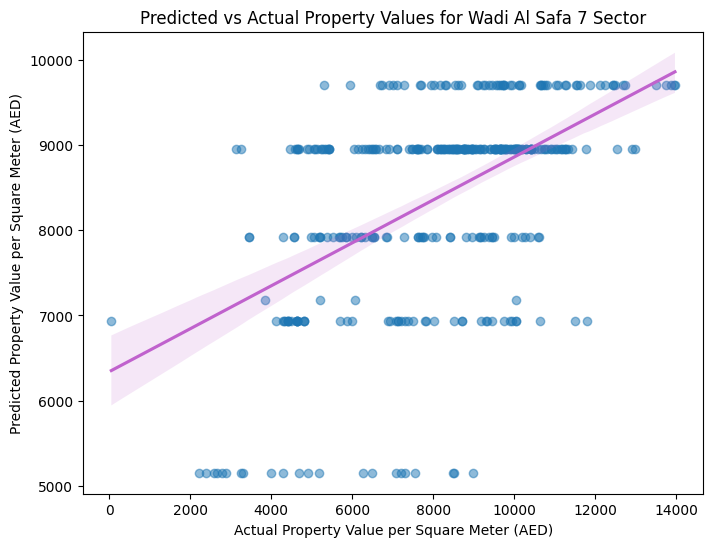

Processing area: Warsan Fourth
MAPE: 0.2679000428929301
RMSE: 2238.2200224715434
all stored successfully

All Variables Analysis for Warsan Fourth:

Model Definition for Warsan Fourth:
Plot saved to: plots/predicted_vs_actual_warsan_fourth.html


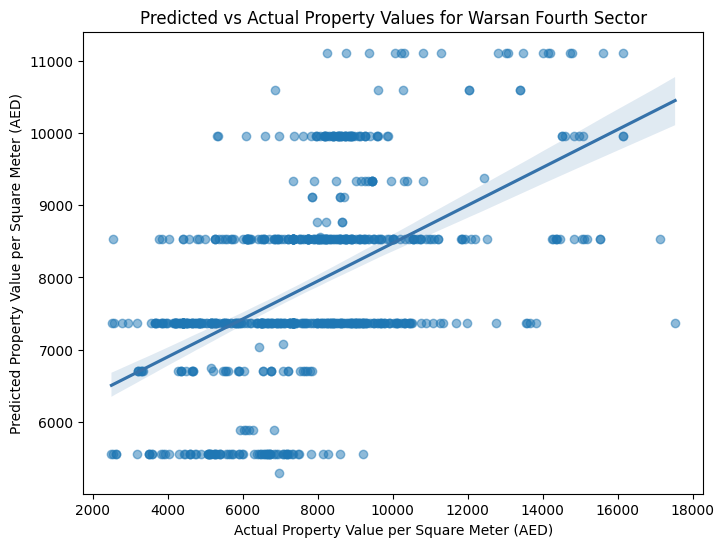

Processing area: World Islands
MAPE: 0.1913710286527138
RMSE: 4709.387204770241
all stored successfully

All Variables Analysis for World Islands:

Model Definition for World Islands:
Plot saved to: plots/predicted_vs_actual_world_islands.html


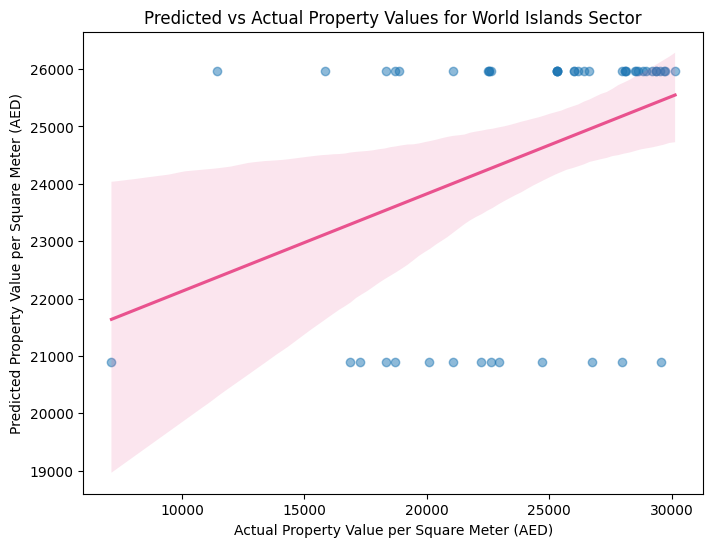

Processing area: Zaabeel First
MAPE: 0.062045505695831824
RMSE: 2121.6425047500393
all stored successfully

All Variables Analysis for Zaabeel First:

Model Definition for Zaabeel First:
Plot saved to: plots/predicted_vs_actual_zaabeel_first.html


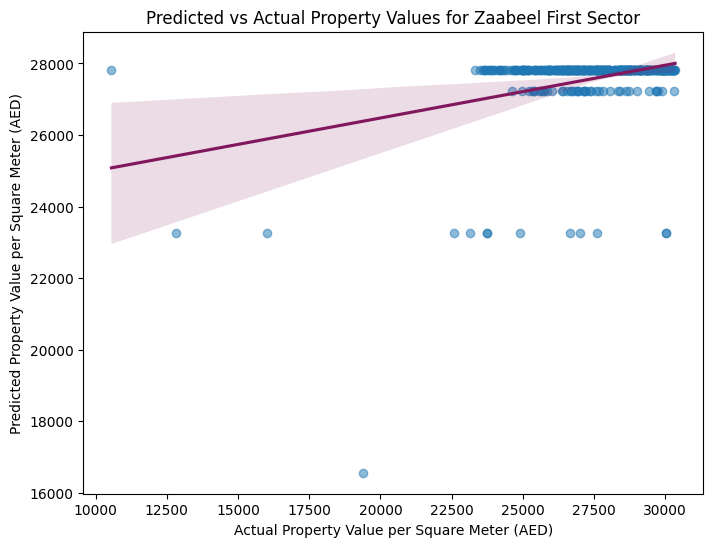

Processing area: Zaabeel Second
MAPE: 0.15801637760552945
RMSE: 3911.0074310934983
all stored successfully

All Variables Analysis for Zaabeel Second:

Model Definition for Zaabeel Second:
Plot saved to: plots/predicted_vs_actual_zaabeel_second.html


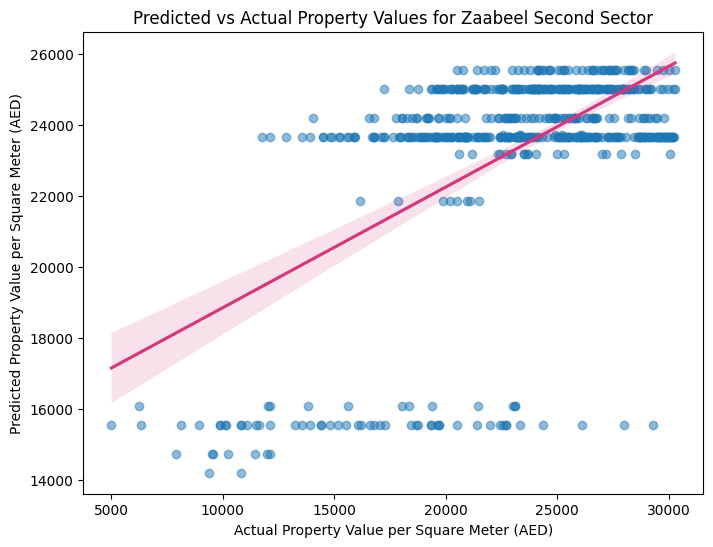

In [ ]:
reg_image_area = df.groupby(df['area_name_en']).apply(run_regression_with_area_name)
reg_image_area.to_excel("area_name_en_lr_image_data.xlsx", index=False)

# Decision tree

## sample

In [ ]:
def run_decision_tree_auto_and_export(df):
    """
    Runs a Decision Tree model, evaluates it, plots it, and saves key regression metrics to Excel.
    Assumes 'meter_sale_price' is the target column.
    """
    # Define target and features
    target_col = "meter_sale_price"
    X = df[['has_parking','Off_Plan_Reg','usage_residential','usage_hospitality',
            'trans_group_sales','trans_group_gifts',
            'close_DubaiMall', 'Close_Marina_EmiratesMall', 'Close_MIRDIF_IBNMall',
            'Rooms_3_4', 'Rooms_Studio_Single', 'Rooms_Commercial','Fam_landmarks']]
    y = df[target_col]

    # Detect model type
    # A regression problem is likely given the target variable name
    model_type = 'regression' # Explicitly set to regression based on target_col

    # Split data
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Initialize Decision Tree model
    if model_type == 'classification':
        dt_model = DecisionTreeClassifier(max_depth=5, random_state=42)
    else:
        dt_model = DecisionTreeRegressor(max_depth=5, random_state=42)

    # Train Decision Tree model
    dt_model.fit(X_train, y_train)
    y_pred = dt_model.predict(X_test) # Predict using the Decision Tree model

    # Fit OLS model for comparison/additional analysis if needed
    # Use a different variable name to avoid overwriting the Decision Tree model
    X_train_ols = sm.add_constant(X_train)
    ols_model = sm.OLS(y_train, X_train_ols).fit()


    # Evaluation and metrics collection
    if model_type == 'classification':
        acc = accuracy_score(y_test, y_pred)
        class_report = classification_report(y_test, y_pred)
        print("📊 Accuracy:", acc)
        print("\n📋 Classification Report:\n", class_report)

        # No Excel export for classification in this version
        new_df = pd.DataFrame({
            'Model_Summary': [str(dt_model)], # Reference the Decision Tree model
            'Accuracy': [acc]
        })
        new_df.to_excel('model_classification_summary.xlsx', index=False)
        print("✅ Classification results saved to model_classification_summary.xlsx")

    else:
        # Use predictions from the Decision Tree model for metrics
        mse = mean_squared_error(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)
        # Handle potential division by zero or inf in MAPE if y_test contains zeros
        mape = mean_absolute_percentage_error(y_test, y_pred) if (y_test != 0).all() else float('inf')
        rmse = np.sqrt(mse)
        coef_error = np.sqrt(mse)

        print("📉 MSE:", mse)
        print("📈 R² Score:", r2)
        print("📐 MAPE:", mape)

        # Save results to Excel
        new_df = pd.DataFrame({
            'Model_Summary': [ols_model.summary()], # Reference the OLS model summary, # Reference the Decision Tree model
            'MSE': [mse],
            'R2': [r2],
            'MAPE': [mape],
            'RMSE': [rmse],
            'Coefficient of Error': [coef_error]
        })
        new_df.to_excel('model_evaluation_summary.xlsx', index=False)
        print("✅ Regression results saved to model_evaluation_summary.xlsx")

    # Plot the decision tree
    plt.figure(figsize=(20, 10))
    # Pass the actual Decision Tree model to plot_tree
    plot_tree(dt_model, filled=True, feature_names=X.columns,
              class_names=True if model_type == 'classification' else None)
    plt.title("Decision Tree Visualization")
    plt.show()

# Example usage (you need to pass your DataFrame here)
# run_decision_tree_auto_and_export(your_dataframe)

📉 MSE: 24722353.073349502
📈 R² Score: 0.4383277766275816
📐 MAPE: 0.4521307142319782
✅ Regression results saved to model_evaluation_summary.xlsx


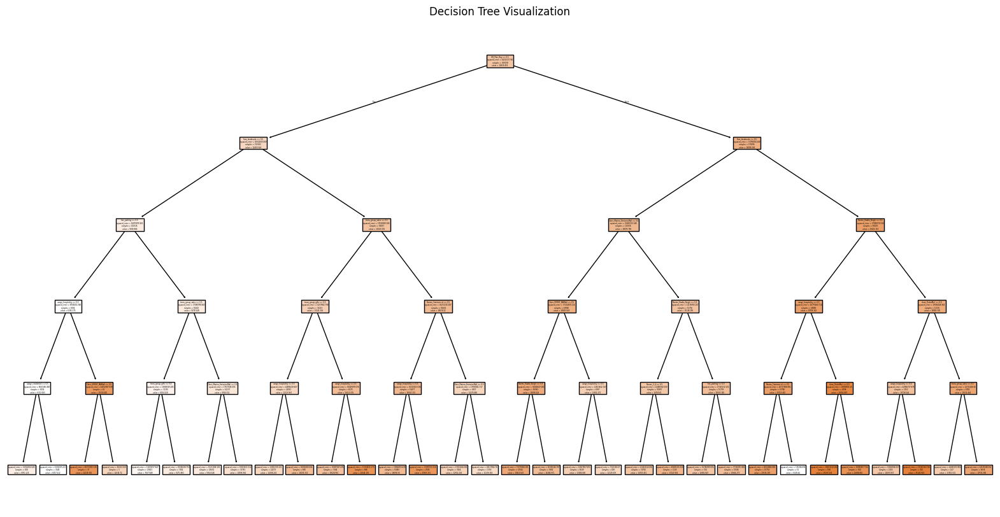

In [ ]:
dt_model = run_decision_tree_auto_and_export(data)


## overall Run

In [ ]:
def run_tree_regression_overall(Data, target, test_size=0.2, seed=42, max_depth=None):
    print("Processing overall Decision Tree Regression...")

    features = [
        'has_parking','Off_Plan_Reg','usage_residential','usage_hospitality',
        'trans_group_sales','trans_group_gifts',
        'close_DubaiMall', 'Close_Marina_EmiratesMall', 'Close_MIRDIF_IBNMall',
        'Rooms_3_4' , 'Rooms_Studio_Single', 'Rooms_Commercial','Fam_landmarks'
    ]

    X = Data[features]
    y = Data[target]

    if y.nunique() < 2:
        print("Target variable has less than 2 unique values.")
        return None

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=seed)

    if X_train.empty or y_train.empty:
        print("Training data is empty.")
        return None

    model = DecisionTreeRegressor(max_depth=max_depth, random_state=seed)

    try:
        model.fit(X_train, y_train)
    except Exception as e:
        print(f"Error during model training: {e}")
        return None

    X_train_ols = sm.add_constant(X_train)
    ols_model = sm.OLS(y_train, X_train_ols).fit()

    try:
        y_pred = model.predict(X_test)
    except Exception as e:
        print(f"Error during prediction: {e}")
        return None

    mape = mean_absolute_percentage_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)

    if r2 < 0 or np.isnan(mape) or np.isinf(mape):
        print("Invalid metrics. Skipping.")
        return None

    print(f"MAPE: {mape}")
    print(f"RMSE: {rmse}")
    print(f"R² Score: {r2}")

    new_df = pd.DataFrame({
        'Model': ['Decision Tree'],
        'no_of_obs': [len(y_test)],
        'R2': [r2],
        'MAPE': [mape],
        'RMSE': [rmse],
        'Coefficient of Error': [rmse],
        'Selected_Features': [features]
    })

    # Plotly visualization
    df_pred = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
    fig = px.scatter(
        df_pred, x='Actual', y='Predicted', opacity=0.6,
        title=f"Predicted vs Actual Property Values - Overall",
        labels={
            'Actual': 'Actual Property Value per Square Meter (AED)',
            'Predicted': 'Predicted Property Value per Square Meter (AED)'
        },
        trendline='ols'
    )
    fig.update_traces(selector=dict(mode='lines'),  # Selects the trendline
                      line=dict(color='red'))

    folder_name = "plots"
    os.makedirs(folder_name, exist_ok=True)
    file_name = "predicted_vs_actual_overall_decision_tree.html"
    full_path = os.path.join(folder_name, file_name)
    pio.write_html(fig, file=full_path, auto_open=False)
    print(f"Plot saved to: {full_path}")

    # Static matplotlib plot
    plt.figure(figsize=(8, 6))
    sns.regplot(x=y_test, y=y_pred, scatter_kws={'alpha': 0.5}, line_kws={'color': np.random.rand(3,)})
    plt.title("Predicted vs Actual Property Values - Overall (Decision Tree)")
    plt.xlabel("Actual Property Value per Square Meter (AED)")
    plt.ylabel("Predicted Property Value per Square Meter (AED)")
    plt.savefig("plots/overall_plot_decision_tree.png")
    plt.show()

    return new_df


In [ ]:
import pandas as pd
import numpy as np
import os
from sklearn.tree import DecisionTreeRegressor, plot_tree, export_text
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_percentage_error
import matplotlib.pyplot as plt

def run_tree_regression_overall(Data):
    print("Processing overall Decision Tree Regression...")
    test_size = 0.2
    seed = 42
    max_depth = None

    features = [
        'has_parking', 'Off_Plan_Reg', 'usage_residential', 'usage_hospitality',
        'trans_group_sales', 'trans_group_gifts',
        'close_DubaiMall', 'Close_Marina_EmiratesMall', 'Close_MIRDIF_IBNMall',
        'Rooms_3_4', 'Rooms_Studio_Single', 'Rooms_Commercial', 'Fam_landmarks'
    ]

    X = Data[features]
    y = Data[target]

    if y.nunique() < 2:
        print("Target variable has less than 2 unique values.")
        return None

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=seed)

    if X_train.empty or y_train.empty:
        print("Training data is empty.")
        return None

    # --- Train Decision Tree ---
    model = DecisionTreeRegressor(max_depth=max_depth, random_state=seed)
    model.fit(X_train, y_train)

    # --- Feature Importances (Like Coefficients) ---
    feature_importance_df = pd.DataFrame({
        'Feature': X_train.columns,
        'Importance': model.feature_importances_
    }).sort_values(by='Importance', ascending=False)

    print("\nFeature Importances (similar to coefficients):")
    print(feature_importance_df)

    # --- Model Rule Summary (Like Textual Summary) ---
    tree_rules = export_text(model, feature_names=list(X_train.columns))
    print("\nDecision Tree Rules Summary:")
    print(tree_rules)

    # --- Predictions ---
    y_pred = model.predict(X_test)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)

    print(f"\nMAPE: {mape:.4f}")
    print(f"RMSE: {rmse:.2f}")
    print(f"R² Score: {r2:.4f}")

    # --- Tree Plot (optional) ---
    """plt.figure(figsize=(20, 10))
    plot_tree(model, feature_names=X_train.columns, filled=True, rounded=True)
    plt.title("Decision Tree Visualization")
    # Create 'plots' directory if it doesn't exist
    os.makedirs('plots', exist_ok=True)
    plt.savefig("plots/overall_tree_plot.png")
    plt.close()"""

    # --- Summary DataFrame ---
    result_df = pd.DataFrame({
        'Model': ['Decision Tree'],
        'no_of_obs': [len(y_test)],
        'R2': [r2],
        'MAPE': [mape],
        'RMSE': [rmse],
        'Coefficient of Error': [rmse],
        'Selected_Features': [features],
        'Feature_Importance': [feature_importance_df],
        'Model_Summary': [tree_rules]
    })

    return result_df

In [ ]:
overall_results_dt=run_tree_regression_overall(df)
overall_results_dt.to_excel("/content/drive/MyDrive/Flipose-Analytics/TruEstates-2/Data/Model Run/Models/dt_overall.xlsx")

Processing overall Decision Tree Regression...

Feature Importances (similar to coefficients):
                      Feature  Importance
1                Off_Plan_Reg    0.437575
12              Fam_landmarks    0.315800
7   Close_Marina_EmiratesMall    0.048194
4           trans_group_sales    0.045432
8        Close_MIRDIF_IBNMall    0.036909
3           usage_hospitality    0.023573
10        Rooms_Studio_Single    0.021185
0                 has_parking    0.019424
5           trans_group_gifts    0.018808
11           Rooms_Commercial    0.017298
2           usage_residential    0.006442
6             close_DubaiMall    0.004829
9                   Rooms_3_4    0.004532

Decision Tree Rules Summary:
|--- Off_Plan_Reg <= 0.50
|   |--- Fam_landmarks <= 0.50
|   |   |--- has_parking <= 0.50
|   |   |   |--- usage_hospitality <= 0.50
|   |   |   |   |--- usage_residential <= 0.50
|   |   |   |   |   |--- Close_MIRDIF_IBNMall <= 0.50
|   |   |   |   |   |   |--- trans_group_sales <= 0.5

In [ ]:
#overall_results_dt = run_tree_regression_overall(data, target)
#overall_results_dt.to_excel("DT_regression.xlsx")

##  Model run as linear_regression(decision_tree)


In [ ]:
from sklearn.tree import DecisionTreeRegressor, export_text
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_percentage_error
import numpy as np
import pandas as pd
import os

all_sector_dfs = []

def run_tree_regression_with_area_name(Data):
    test_size=0.3
    seed=42
    min_samples_for_cv=5
    max_depth=None
    if len(Data) < min_samples_for_cv:
        sector_name = Data['area_name_en'].iloc[0] if not Data.empty else "Empty Group"
        print(f"Skipping area '{sector_name}': Not enough samples ({len(Data)}) for cross-validation.")
        return None

    sector_name = Data['area_name_en'].iloc[0]
    print(f"\nProcessing area: {sector_name}")

    if 'sector_name' in Data.columns:
        Data = Data.drop(columns=['sector_name'])

    features = [
        'has_parking','Off_Plan_Reg','usage_residential','usage_hospitality',
        'trans_group_sales','trans_group_gifts',
        'close_DubaiMall', 'Close_Marina_EmiratesMall', 'Close_MIRDIF_IBNMall',
        'Rooms_3_4' , 'Rooms_Studio_Single', 'Rooms_Commercial','Fam_landmarks'
    ]

    X = Data[features]
    y = Data[target]

    if y.nunique() < 2:
        print(f"Skipping area '{sector_name}': Target variable has less than 2 unique values.")
        return None

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=seed)

    if X_train.empty or y_train.empty:
        print(f"Skipping area '{sector_name}': Training data is empty.")
        return None

    # Train Decision Tree
    model = DecisionTreeRegressor(max_depth=max_depth, random_state=seed)
    try:
        model.fit(X_train, y_train)
    except Exception as e:
        print(f"Skipping area '{sector_name}': Error during model training - {e}")
        return None

    # Feature Importances
    feature_importance_df = pd.DataFrame({
        'Feature': X_train.columns,
        'Importance': model.feature_importances_
    }).sort_values(by='Importance', ascending=False)

    print("\nFeature Importances (similar to coefficients):")
    print(feature_importance_df)

    # Decision Tree Rules
    tree_rules = export_text(model, feature_names=list(X_train.columns))
    print("\nDecision Tree Rules Summary:")
    print(tree_rules)

    try:
        y_pred = model.predict(X_test)
    except Exception as e:
        print(f"Skipping area '{sector_name}': Error during prediction - {e}")
        return None

    mape = mean_absolute_percentage_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)

    if r2 < 0 or np.isnan(mape) or np.isinf(mape):
        print(f"Skipping area with invalid metrics: {sector_name}")
        return None

    print(f"\nMAPE: {mape:.4f}")
    print(f"RMSE: {rmse:.2f}")
    print(f"R² Score: {r2:.4f}")

    # Optional Plot (Commented)
    """
    import matplotlib.pyplot as plt
    from sklearn.tree import plot_tree
    plt.figure(figsize=(20, 10))
    plot_tree(model, feature_names=X_train.columns, filled=True, rounded=True)
    os.makedirs('plots', exist_ok=True)
    plt.title(f"Decision Tree for {sector_name}")
    plt.savefig(f"plots/tree_plot_{sector_name}.png")
    plt.close()
    """

    new_df = pd.DataFrame({
        'sector_name': [sector_name],
        'no_of_obs': [len(y_test)],
        'R2': [r2],
        'MAPE': [mape],
        'RMSE': [rmse],
        'Coefficient of Error': [rmse],
        'Selected_Features': [features],
        'Feature_Importance': [feature_importance_df],
        'Model_Summary': [tree_rules]
    })

    all_sector_dfs.append(new_df)
    print('Model metrics stored successfully.')

    return new_df


In [ ]:
dt_area = data.groupby(data['area_name_en']).apply(run_tree_regression_with_area_name)
dt_area.to_excel("/content/drive/MyDrive/Flipose-Analytics/TruEstates-2/Data/Model Run/Models/area_name_dt_new.xlsx", index=False)

Streaming output truncated to the last 5000 lines.
|   |   |   |   |--- Off_Plan_Reg >  0.50
|   |   |   |   |   |--- value: [7695.05]
|   |   |   |--- Fam_landmarks >  0.50
|   |   |   |   |--- Off_Plan_Reg <= 0.50
|   |   |   |   |   |--- close_DubaiMall <= 0.50
|   |   |   |   |   |   |--- Rooms_3_4 <= 0.50
|   |   |   |   |   |   |   |--- value: [13804.63]
|   |   |   |   |   |   |--- Rooms_3_4 >  0.50
|   |   |   |   |   |   |   |--- value: [13553.55]
|   |   |   |   |   |--- close_DubaiMall >  0.50
|   |   |   |   |   |   |--- Rooms_3_4 <= 0.50
|   |   |   |   |   |   |   |--- value: [12854.45]
|   |   |   |   |   |   |--- Rooms_3_4 >  0.50
|   |   |   |   |   |   |   |--- value: [14199.72]
|   |   |   |   |--- Off_Plan_Reg >  0.50
|   |   |   |   |   |--- Rooms_3_4 <= 0.50
|   |   |   |   |   |   |--- value: [6860.18]
|   |   |   |   |   |--- Rooms_3_4 >  0.50
|   |   |   |   |   |   |--- value: [8394.90]
|   |--- trans_group_gifts >  0.50
|   |   |--- usage_residential <= 0.50


Processing area: West
MAPE: 0.4382494992766107
RMSE: 4852.249788074407
R² Score: 0.46509157038449433
Model metrics stored successfully.
Plot saved to: plots/predicted_vs_actual_west.html


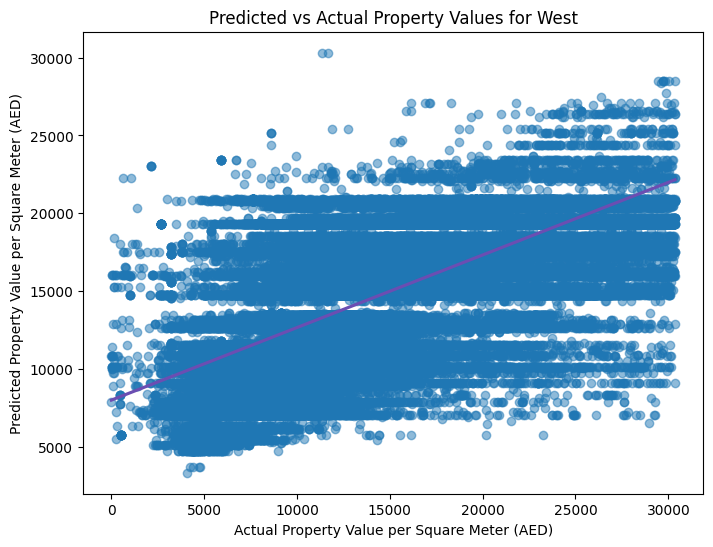

,sector_name,MSE,R2,MAPE,RMSE,Coefficient of Error,Selected_Features
0,West,2.354433e+07,0.465092,0.438249,4852.249788,4852.249788,"[has_parking, Off_Plan_Reg, usage_residential,..."


In [ ]:
#run_tree_regression_with_area_name(data)

## sector_dt

In [ ]:
from sklearn.tree import DecisionTreeRegressor, export_text
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_percentage_error
import numpy as np
import pandas as pd
import os

all_sector_dfs = []

def run_tree_regression_with_sector_name(Data):
    test_size=0.3
    seed=42
    min_samples_for_cv=5
    max_depth=None
    if len(Data) < min_samples_for_cv:
        sector_name = Data['sector_name'].iloc[0] if not Data.empty else "Empty Group"
        print(f"Skipping area '{sector_name}': Not enough samples ({len(Data)}) for cross-validation.")
        return None

    sector_name = Data['sector_name'].iloc[0]
    print(f"\nProcessing area: {sector_name}")

    if 'sector_name' in Data.columns:
        Data = Data.drop(columns=['sector_name'])

    features = [
        'has_parking','Off_Plan_Reg','usage_residential','usage_hospitality',
        'trans_group_sales','trans_group_gifts',
        'close_DubaiMall', 'Close_Marina_EmiratesMall', 'Close_MIRDIF_IBNMall',
        'Rooms_3_4' , 'Rooms_Studio_Single', 'Rooms_Commercial','Fam_landmarks'
    ]

    X = Data[features]
    y = Data[target]

    if y.nunique() < 2:
        print(f"Skipping area '{sector_name}': Target variable has less than 2 unique values.")
        return None

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=seed)

    if X_train.empty or y_train.empty:
        print(f"Skipping area '{sector_name}': Training data is empty.")
        return None

    # Train Decision Tree
    model = DecisionTreeRegressor(max_depth=max_depth, random_state=seed)
    try:
        model.fit(X_train, y_train)
    except Exception as e:
        print(f"Skipping area '{sector_name}': Error during model training - {e}")
        return None

    # Feature Importances
    feature_importance_df = pd.DataFrame({
        'Feature': X_train.columns,
        'Importance': model.feature_importances_
    }).sort_values(by='Importance', ascending=False)

    print("\nFeature Importances (similar to coefficients):")
    print(feature_importance_df)

    # Decision Tree Rules
    tree_rules = export_text(model, feature_names=list(X_train.columns))
    print("\nDecision Tree Rules Summary:")
    print(tree_rules)

    try:
        y_pred = model.predict(X_test)
    except Exception as e:
        print(f"Skipping area '{sector_name}': Error during prediction - {e}")
        return None

    mape = mean_absolute_percentage_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)

    if r2 < 0 or np.isnan(mape) or np.isinf(mape):
        print(f"Skipping area with invalid metrics: {sector_name}")
        return None

    print(f"\nMAPE: {mape:.4f}")
    print(f"RMSE: {rmse:.2f}")
    print(f"R² Score: {r2:.4f}")

    # Optional Plot (Commented)
    """
    import matplotlib.pyplot as plt
    from sklearn.tree import plot_tree
    plt.figure(figsize=(20, 10))
    plot_tree(model, feature_names=X_train.columns, filled=True, rounded=True)
    os.makedirs('plots', exist_ok=True)
    plt.title(f"Decision Tree for {sector_name}")
    plt.savefig(f"plots/tree_plot_{sector_name}.png")
    plt.close()
    """

    new_df = pd.DataFrame({
        'sector_name': [sector_name],
        'no_of_obs': [len(y_test)],
        'R2': [r2],
        'MAPE': [mape],
        'RMSE': [rmse],
        'Coefficient of Error': [rmse],
        'Selected_Features': [features],
        'Feature_Importance': [feature_importance_df],
        'Model_Summary': [tree_rules]
    })

    all_sector_dfs.append(new_df)
    print('Model metrics stored successfully.')

    return new_df


In [ ]:
dt_area = data.groupby(data['sector_name']).apply(run_tree_regression_with_sector_name)
dt_area.to_excel("/content/drive/MyDrive/Flipose-Analytics/TruEstates-2/Data/Model Run/Models/sector_name_dt_new.xlsx", index=False)


Processing area: Central

Feature Importances (similar to coefficients):
                      Feature  Importance
1                Off_Plan_Reg    0.663066
12              Fam_landmarks    0.136052
10        Rooms_Studio_Single    0.059153
7   Close_Marina_EmiratesMall    0.055738
4           trans_group_sales    0.033360
8        Close_MIRDIF_IBNMall    0.023983
9                   Rooms_3_4    0.006573
3           usage_hospitality    0.006008
0                 has_parking    0.004737
2           usage_residential    0.004672
5           trans_group_gifts    0.004618
11           Rooms_Commercial    0.001192
6             close_DubaiMall    0.000848

Decision Tree Rules Summary:
|--- Off_Plan_Reg <= 0.50
|   |--- Fam_landmarks <= 0.50
|   |   |--- trans_group_sales <= 0.50
|   |   |   |--- Close_Marina_EmiratesMall <= 0.50
|   |   |   |   |--- usage_residential <= 0.50
|   |   |   |   |   |--- Rooms_Studio_Single <= 0.50
|   |   |   |   |   |   |--- Rooms_Commercial <= 0.50
|   |  

In [ ]:
data

NameError: name 'data' is not defined

# XGB regressor

## sample overall

In [ ]:
def run_xgboost_regression_overall(Data, target, test_size=0.3, seed=42, xgb_params=None):
    if len(Data) < 5:
        print(f"Skipping overall model: Not enough samples ({len(Data)}) for training.")
        return None

    print(f"Processing overall dataset...")

    features = [
        'has_parking', 'Off_Plan_Reg', 'usage_residential', 'usage_hospitality',
        'trans_group_sales', 'trans_group_gifts',
        'close_DubaiMall', 'Close_Marina_EmiratesMall', 'Close_MIRDIF_IBNMall',
        'Rooms_3_4', 'Rooms_Studio_Single', 'Rooms_Commercial', 'Fam_landmarks'
    ]

    X = Data[features]
    y = Data[target]

    if y.nunique() < 2:
        print("Target variable has less than 2 unique values.")
        return None

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=seed)

    if xgb_params is None:
        xgb_params = {
            'n_estimators': 100,
            'learning_rate': 0.1,
            'max_depth': 5,
            'random_state': seed
        }

    model = XGBRegressor(**xgb_params)
    X_train_ols = sm.add_constant(X_train)
    ols_model = sm.OLS(y_train, X_train_ols).fit()

    try:
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
    except Exception as e:
        print(f"Error during model training or prediction - {e}")
        return None

    mape = mean_absolute_percentage_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)

    print(f"Overall Model Performance:\nR²: {r2:.3f}\nRMSE: {rmse:.2f}\nMAPE: {mape:.2%}")

    new_df = pd.DataFrame({
        'Model': ['XGBoost Overall'],
        'no_of_obs': [len(y_test)],
        'R2': [r2],
        'MAPE': [mape],
        'RMSE': [rmse],
        'Coefficient of Error': [rmse],
        'Selected_Features': [features]
    })
    """

        # Plotly visualization
    df_pred = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
    fig = px.scatter(
        df_pred, x='Actual', y='Predicted', opacity=0.6,
        title=f"Predicted vs Actual Property Values - Overall",
        labels={
            'Actual': 'Actual Property Value per Square Meter (AED)',
            'Predicted': 'Predicted Property Value per Square Meter (AED)'
        },
        trendline='ols'
    )
    fig.update_traces(selector=dict(mode='lines'),  # Selects the trendline
                      line=dict(color='red'))

    folder_name = "plots"
    os.makedirs(folder_name, exist_ok=True)
    file_name = "predicted_vs_actual_overall_XGB_regressor.html"
    full_path = os.path.join(folder_name, file_name)
    pio.write_html(fig, file=full_path, auto_open=False)
    print(f"Plot saved to: {full_path}")

    # Optional: Visualization
    plt.figure(figsize=(8, 6))
    sns.regplot(x=y_test, y=y_pred, scatter_kws={'alpha': 0.5}, line_kws={'color': np.random.rand(3,)})
    plt.title(f"Predicted vs Actual Property Values (Overall XGBoost)")
    plt.xlabel("Actual Property Value per Square Meter (AED)")
    plt.ylabel("Predicted Property Value per Square Meter (AED)")
    plt.savefig(f"plots/overall_plot_xgb.png")
    plt.show()"""

    return  new_df


In [ ]:
# Assuming df is your full preprocessed DataFrame and target is set
#target = 'Price_per_sqm'  # replace with your actual target column
overall_results_xgb = run_xgboost_regression_overall(data, target)
overall_results_xgb#.to_excel("xgb_regression.xlsx")

Processing overall dataset...
Overall Model Performance:
R²: 0.463
RMSE: 4864.49
MAPE: 42.61%


,Model,no_of_obs,R2,MAPE,RMSE,Coefficient of Error,Selected_Features
0,XGBoost Overall,138405,0.463186,0.426137,4864.493613,4864.493613,"[has_parking, Off_Plan_Reg, usage_residential,..."


## area_name_XGB

In [ ]:
all_sector_dfs = []

def run_xgboost_regression_with_area_name(Data,test_size=0.3, seed=42, min_samples_for_cv=5, xgb_params=None):
    if len(Data) < min_samples_for_cv:
        sector_name = Data['area_name_en'].iloc[0] if not Data.empty else "Empty Group"
        print(f"Skipping area '{sector_name}': Not enough samples ({len(Data)}) for training.")
        return None

    sector_name = Data['area_name_en'].iloc[0]
    print(f"Processing area: {sector_name}")

    if 'sector_name' in Data.columns:
        Data = Data.drop(columns=['sector_name'])

    features = [
        'has_parking','Off_Plan_Reg','usage_residential','usage_hospitality',
        'trans_group_sales','trans_group_gifts',
        'close_DubaiMall', 'Close_Marina_EmiratesMall', 'Close_MIRDIF_IBNMall',
        'Rooms_3_4' , 'Rooms_Studio_Single', 'Rooms_Commercial','Fam_landmarks'
    ]

    X = Data[features]
    y = Data[target]

    if y.nunique() < 2:
        print(f"Skipping area '{sector_name}': Target variable has less than 2 unique values.")
        return None

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=seed)

    if X_train.empty or y_train.empty:
        print(f"Skipping area '{sector_name}': Training data is empty.")
        return None

    # Default XGBoost parameters
    if xgb_params is None:
        xgb_params = {
            'n_estimators': 100,
            'learning_rate': 0.1,
            'max_depth': 5,
            'random_state': seed
        }

    model = XGBRegressor(**xgb_params)

    try:
        model.fit(X_train, y_train)
    except Exception as e:
        print(f"Skipping area '{sector_name}': Error during model training - {e}")
        return None

    try:
        y_pred = model.predict(X_test)
    except Exception as e:
        print(f"Skipping area '{sector_name}': Error during prediction - {e}")
        return None

    mape = mean_absolute_percentage_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)

    if r2 < 0 or np.isnan(mape) or np.isinf(mape):
        print(f"Skipping area with invalid metrics: {sector_name}")
        return None

    print(f"MAPE: {mape}")
    print(f"RMSE: {rmse}")
    print(f"R² Score: {r2}")

    new_df = pd.DataFrame({
        'sector_name': [sector_name],
        'no_of_obs': [len(y_test)],
        'R2': [r2],
        'MAPE': [mape],
        'RMSE': [rmse],
        'Coefficient of Error': [rmse],
        'Selected_Features': [features]
    })

    all_sector_dfs.append(new_df)
    print('Model metrics stored successfully.')

    # Plotly visualization
    df_pred = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})

    """fig = px.scatter(
        df_pred, x='Actual', y='Predicted', opacity=0.6,
        title=f"Predicted vs Actual Property Values for {sector_name} Sector",
        labels={
            'Actual': 'Actual Property Value per Square Meter (AED)',
            'Predicted': 'Predicted Property Value per Square Meter (AED)'
        },
        trendline='ols'
    )

    folder_name = "plots"
    os.makedirs(folder_name, exist_ok=True)
    file_name = f"predicted_vs_actual_{sector_name.lower().replace(' ', '_')}_xgb.html"
    full_path = os.path.join(folder_name, file_name)
    pio.write_html(fig, file=full_path, auto_open=False)
    print(f"Plot saved to: {full_path}")"""

    # Static matplotlib plot
    """plt.figure(figsize=(8, 6))
    sns.regplot(x=y_test, y=y_pred, scatter_kws={'alpha': 0.5}, line_kws={'color': np.random.rand(3,)})
    plt.title(f"Predicted vs Actual Property Values for {sector_name} (XGBoost)")
    plt.xlabel("Actual Property Value per Square Meter (AED)")
    plt.ylabel("Predicted Property Value per Square Meter (AED)")
    plt.savefig(f"plots/{sector_name}_plot_xgb.png")
    plt.show()"""

    return new_df


In [ ]:
xgb_area = data.groupby(data['area_name_en']).apply(run_xgboost_regression_with_area_name)
xgb_area.to_excel("area_name_en_xdb_model.xlsx", index=False)

Processing area: Al Barsha First
Skipping area with invalid metrics: Al Barsha First
Processing area: Al Barsha South Fifth
MAPE: 0.2143491605615224
RMSE: 3050.8990538273397
R² Score: 0.5239333174792198
Model metrics stored successfully.
Processing area: Al Barsha South Fourth
MAPE: 0.6508520166743027
RMSE: 3131.0224905898185
R² Score: 0.3465608691991767
Model metrics stored successfully.
Processing area: Al Barshaa South Second
MAPE: 0.14856645187875547
RMSE: 2542.1564620064746
R² Score: 0.5147384336231984
Model metrics stored successfully.
Processing area: Al Barshaa South Third
MAPE: 0.2302232724454822
RMSE: 2604.887795014203
R² Score: 0.3977620665711311
Model metrics stored successfully.
Processing area: Al Goze Fourth
MAPE: 0.22539712563015463
RMSE: 1656.6455601823789
R² Score: 0.08220858831097444
Model metrics stored successfully.
Processing area: Al Hebiah Fifth
MAPE: 0.509457898048339
RMSE: 2084.8645101103834
R² Score: 0.8723428533408032
Model metrics stored successfully.
Proce

## Sector_name_XGB

In [ ]:
all_sector_dfs = []

def run_xgboost_regression_with_sector_name(Data,test_size=0.2, seed=42, min_samples_for_cv=5, xgb_params=None):
    if len(Data) < min_samples_for_cv:
        sector_name = Data['sector_name'].iloc[0] if not Data.empty else "Empty Group"
        print(f"Skipping area '{sector_name}': Not enough samples ({len(Data)}) for training.")
        return None
    sector_name = Data['sector_name'].iloc[0]
    print(f"Processing area: {sector_name}")

    features = [
        'has_parking','Off_Plan_Reg','usage_residential','usage_hospitality',
        'trans_group_sales','trans_group_gifts',
        'close_DubaiMall', 'Close_Marina_EmiratesMall', 'Close_MIRDIF_IBNMall',
        'Rooms_3_4' , 'Rooms_Studio_Single', 'Rooms_Commercial','Fam_landmarks'
    ]

    X = Data[features]
    y = Data[target]

    if y.nunique() < 2:
        print(f"Skipping area '{sector_name}': Target variable has less than 2 unique values.")
        return None

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=seed)

    if X_train.empty or y_train.empty:
        print(f"Skipping area '{sector_name}': Training data is empty.")
        return None

    # Default XGBoost parameters
    if xgb_params is None:
        xgb_params = {
            'n_estimators': 100,
            'learning_rate': 0.1,
            'max_depth': 5,
            'random_state': seed
        }

    model = XGBRegressor(**xgb_params)

    try:
        model.fit(X_train, y_train)
    except Exception as e:
        print(f"Skipping area '{sector_name}': Error during model training - {e}")
        return None

    try:
        y_pred = model.predict(X_test)
    except Exception as e:
        print(f"Skipping area '{sector_name}': Error during prediction - {e}")
        return None

    mape = mean_absolute_percentage_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)

    if r2 < 0 or np.isnan(mape) or np.isinf(mape):
        print(f"Skipping area with invalid metrics: {sector_name}")
        return None

    print(f"MAPE: {mape}")
    print(f"RMSE: {rmse}")
    print(f"R² Score: {r2}")

    new_df = pd.DataFrame({
        'sector_name': [sector_name],
        'no_of_obs': [len(y_test)],
        'R2': [r2],
        'MAPE': [mape],
        'RMSE': [rmse],
        'Coefficient of Error': [rmse],
        'Selected_Features': [features]
    })

    all_sector_dfs.append(new_df)
    print('Model metrics stored successfully.')

    # Plotly visualization
    df_pred = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})

    """fig = px.scatter(
        df_pred, x='Actual', y='Predicted', opacity=0.6,
        title=f"Predicted vs Actual Property Values for {sector_name} Sector",
        labels={
            'Actual': 'Actual Property Value per Square Meter (AED)',
            'Predicted': 'Predicted Property Value per Square Meter (AED)'
        },
        trendline='ols'
    )

    folder_name = "plots"
    os.makedirs(folder_name, exist_ok=True)
    file_name = f"predicted_vs_actual_{sector_name.lower().replace(' ', '_')}_xgb.html"
    full_path = os.path.join(folder_name, file_name)
    pio.write_html(fig, file=full_path, auto_open=False)
    print(f"Plot saved to: {full_path}")"""

    # Static matplotlib plot
    """plt.figure(figsize=(8, 6))
    sns.regplot(x=y_test, y=y_pred, scatter_kws={'alpha': 0.5}, line_kws={'color': np.random.rand(3,)})
    plt.title(f"Predicted vs Actual Property Values for {sector_name} (XGBoost)")
    plt.xlabel("Actual Property Value per Square Meter (AED)")
    plt.ylabel("Predicted Property Value per Square Meter (AED)")
    plt.savefig(f"plots/{sector_name}_plot_xgb.png")
    plt.show()"""

    return new_df


In [ ]:
xgb_sector = data.groupby(data['sector_name']).apply(run_xgboost_regression_with_sector_name)
xgb_sector.to_excel("sector_name_en_xdb_model.xlsx", index=False)

Processing area: Central
MAPE: 0.47483234737265867
RMSE: 4329.241820752448
R² Score: 0.48816010717443936
Model metrics stored successfully.
Processing area: North
MAPE: 0.16181269224332284
RMSE: 2206.983587799346
R² Score: 0.3956753751989811
Model metrics stored successfully.
Processing area: North_Central
MAPE: 0.21274417763389764
RMSE: 3485.5727186894237
R² Score: 0.6274552062171999
Model metrics stored successfully.
Processing area: North_east
MAPE: 0.2246479486566363
RMSE: 3500.0845566822486
R² Score: 0.7154240118356663
Model metrics stored successfully.
Processing area: North_west
Skipping area with invalid metrics: North_west
Processing area: South
MAPE: 0.10388863695779899
RMSE: 1475.407696583056
R² Score: 0.585699005460122
Model metrics stored successfully.
Processing area: South_west
MAPE: 0.22138244612390537
RMSE: 2871.4547314671345
R² Score: 0.5810040149242939
Model metrics stored successfully.
Processing area: West
MAPE: 0.38861112435265216
RMSE: 5198.778775000329
R² Score:

# MLP(MultiLayer_perceptron)


## MLP over all

## MLP sector


#### trail

In [ ]:
def run_mlp_with_sector(Data):
    sector_name = Data['sector_name'].iloc[0]
    print(f"Processing area: {sector_name}")

    # Drop 'sector_name' column
    Data = Data.drop(columns=['sector_name'])

    # Define features and target
    X = Data[['has_parking', 'Off_Plan_Reg', 'usage_residential', 'usage_hospitality',
              'trans_group_sales', 'trans_group_gifts',
              'close_DubaiMall', 'Close_Marina_EmiratesMall', 'Close_MIRDIF_IBNMall',
              'Rooms_3_4', 'Rooms_Studio_Single', 'Rooms_Commercial', 'Fam_landmarks']]
    y = Data[target]

    X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=seed, test_size=test_size)

    # Initialize and train MLP
    mlp = MLPRegressor(hidden_layer_sizes=(32, 16), activation='relu', max_iter=1000, random_state=seed)

    # Feature selection
    sfs = SFS(mlp, k_features='best', forward=True, scoring='r2', cv=3)
    sfs.fit(X_train, y_train)

    # Fit MLP with selected features
    selected_features = list(sfs.k_feature_names_)
    mlp.fit(X_train[selected_features], y_train)

    # Predict
    y_pred = mlp.predict(X_test[selected_features])

    # Evaluation
    mape = mean_absolute_percentage_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)

    if r2 < 0:
        print(f"Skipping area with negative R²: {sector_name}")
        return None

    print(f"R²: {r2:.3f}, MAPE: {mape:.3f}, RMSE: {rmse:.2f}")

    # OLS Summary for interpretability
    try:
        X_train_ols = sm.add_constant(X_train[selected_features])
        ols_model = sm.OLS(y_train, X_train_ols).fit()
        ols_summary_text = ols_model.summary().as_text()
        print(f"\nOLS Model Summary for {sector_name}:\n")
        print(ols_summary_text)
    except Exception as e:
        ols_summary_text = f"OLS summary failed: {e}"
        print(ols_summary_text)

    # Store results
    new_df = pd.DataFrame({
        'sector_name': [sector_name],
        'No. of Observations': [len(y_test)],
        'R2': [r2],
        'MAPE': [mape],
        'RMSE': [rmse],
        'Coefficient of Error': [rmse],
        'Selected_Features': [selected_features],
        'Model_Summary': ["MLPRegressor(hidden_layer_sizes=(32,16))"],
        'OLS_Summary': [ols_summary_text]
    })
    all_sector_dfs.append(new_df)

    # Plot seaborn
    '''plt.figure(figsize=(8, 6))
    sns.regplot(x=y_test, y=y_pred, scatter_kws={'alpha': 0.5},
                line_kws={'color': np.random.rand(3,)})
    plt.title(f"Predicted vs Actual Property Values for {sector_name} (MLP)")
    plt.xlabel("Actual Value per Sqm (AED)")
    plt.ylabel("Predicted Value per Sqm (AED)")

    # Plotly
    df_pred = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
    fig = px.scatter(
        df_pred, x='Actual', y='Predicted',
        opacity=0.6,
        title=f"Predicted vs Actual for {sector_name} (MLP)",
        labels={'Actual': 'Actual Value', 'Predicted': 'Predicted Value'},
        trendline='ols'
    )

    # Save plots
    folder_name = "plots"
    os.makedirs(folder_name, exist_ok=True)
    pio.write_html(fig, file=os.path.join(folder_name, f"predicted_vs_actual_{sector_name.lower().replace(' ', '_')}_mlp.html"), auto_open=False)
    plt.savefig(os.path.join(folder_name, f"{sector_name}_mlp_plot.png"))
    plt.show()'''

    return new_df


In [ ]:
MLP_Sector = df.groupby(df['area_name_en']).apply(run_mlp_with_sector)
#MLP_sector.to_excel("Sector_MLP_output.xlsx", index=False)

Processing area: West
Skipping area with negative R²: West
Processing area: Central
R²: 0.536, MAPE: 0.203, RMSE: 3015.41

OLS Model Summary for Central:

                            OLS Regression Results                            
Dep. Variable:       meter_sale_price   R-squared:                       0.500
Model:                            OLS   Adj. R-squared:                  0.499
Method:                 Least Squares   F-statistic:                     506.9
Date:                Mon, 16 Jun 2025   Prob (F-statistic):               0.00
Time:                        11:05:11   Log-Likelihood:                -43264.
No. Observations:                4574   AIC:                         8.655e+04
Df Residuals:                    4564   BIC:                         8.661e+04
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t  

NameError: name 'all_sector_dfs' is not defined

#### Modified MLP

In [ ]:
def train_mlp_with_feature_selection(Data):
    """
    Train an MLPRegressor with forward feature selection, evaluate it, and store results.

    Parameters:
    - Data (pd.DataFrame): Input dataset
    - target (str): Target column name
    - sector_name (str): Name to identify the sector/area
    - seed (int): Random state for reproducibility
    - test_size (float): Proportion of test data
    - all_sector_dfs (list): List to append result DataFrame to

    Returns:
    - updated all_sector_dfs (list)
    """
    """#features = ['has_parking', 'Off_Plan_Reg', 'usage_residential', 'usage_hospitality',
              'trans_group_sales', 'trans_group_gifts',
              'close_DubaiMall', 'Close_Marina_EmiratesMall', 'Close_MIRDIF_IBNMall',
              'Rooms_3_4', 'Rooms_Studio_Single', 'Rooms_Commercial', 'Fam_landmarks']"""

    features=['has_parking','usage_residential', 'usage_hospitality', 'Off_Plan_Reg',
              'trans_group_gifts', 'trans_group_sales', 'Fam_landmarks', 'close_DubaiMall',
       'Close_Marina_EmiratesMall', 'Close_MIRDIF_IBNMall', 'Rooms_3_4',
       'Rooms_moreThan_4', 'Rooms_Studio_Single', 'Rooms_Commercial']

    # Define features and target
    """features = ['has_parking', 'Off_Plan_Reg', 'usage_residential', 'usage_hospitality',
                'trans_group_sales','close_DubaiMall','Rooms_3_4',  'Fam_landmarks']"""

    X = Data[features]
    y = Data[target]

    # Split the data
    X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=seed, test_size=test_size)

    # Scale features
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=X.columns)
    X_test_scaled_df = pd.DataFrame(X_test_scaled, columns=X.columns)

    # Initialize MLP
    #mlp = MLPRegressor(hidden_layer_sizes=(32, 16), activation='relu', max_iter=200, random_state=seed)
    '''mlp = MLPRegressor(hidden_layer_sizes=(32, 16),activation='relu',max_iter=200,random_state=42,early_stopping=True,
    validation_fraction=0.1,  # 10% of training data used for validation
    n_iter_no_change=10,      # Stop if no improvement in 10 iterations
    verbose=True              # (Optional) to show training messages
    )'''

    mlp = MLPRegressor(
    hidden_layer_sizes=(64, 32),   # Smaller network to prevent overfitting
    max_iter=500,                  # More iterations
    alpha=0.001,                   # Regularization strength (L2 penalty)
    early_stopping=True,          # Stop if validation loss doesn't improve
    validation_fraction=0.1,      # 10% of training set for internal validation
    random_state=42,
    verbose=True
    )



    # Feature Selection
    sfs = SFS(mlp, k_features='best', forward=True, scoring='r2', cv=3)
    sfs.fit(X_train_scaled_df, y_train)

    selected_features = list(sfs.k_feature_names_)

    # Fit final model on selected features
    mlp.fit(X_train_scaled_df[selected_features], y_train)

    # Predict and evaluate
    y_pred = mlp.predict(X_test_scaled_df[selected_features])
    mape = mean_absolute_percentage_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)

    """if r2 < 0:
        print(f"Skipping area with negative R²: {sector_name}")
        return all_sector_dfs

    print(f"R²: {r2:.3f}, MAPE: {mape:.3f}, RMSE: {rmse:.2f}")"""

    # OLS Summary
    """try:
        X_train_ols = sm.add_constant(X_train_scaled_df[selected_features])
        ols_model = sm.OLS(y_train, X_train_ols).fit()
        ols_summary_text = ols_model.summary().as_text()
        #print(f"\nOLS Model Summary for {sector_name}:\n")
        print(ols_summary_text)
    except Exception as e:
        ols_summary_text = f"OLS summary failed: {e}"
        print(ols_summary_text)"""
    #all_sector_dfs = [] # Removed this line
    # Store results
    # Collect weights and biases info as text
    layer_info = []
    for i, (w, b) in enumerate(zip(mlp.coefs_, mlp.intercepts_)):
      layer_info.append(f"Layer {i} → {i+1} weights shape: {w.shape}, biases shape: {b.shape}")

    # Join as one string or store as list (choose based on preference)
    layer_info_str = "\n".join(layer_info)  # or: layer_info if you prefer list format

    # Create the DataFrame
    new_df = pd.DataFrame({
    # 'sector_name': [sector_name],  # Uncomment if sector_name is defined
    'No. of Observations': [len(y_test)],
    'R2': [r2],
    'MAPE': [mape],
    'RMSE': [rmse],
    'Coefficient of Error': [rmse],
    'Selected_Features': [selected_features],
    'Model_Summary': ["MLPRegressor(hidden_layer_sizes=(32,16))"],
    'Layers (including input & output)': [mlp.n_layers_],
    'Output units': [mlp.n_outputs_],
    'Hidden Layer Sizes': [mlp.hidden_layer_sizes],
    'Weights & Bias Shapes': [layer_info_str]
    })


    #all_sector_dfs.append(new_df) # Removed this line
    return new_df # Return the single dataframe instead of the list

In [ ]:
MLP_overall=  train_mlp_with_feature_selection(df)

Streaming output truncated to the last 5000 lines.
Validation score: 0.356067
Iteration 18, loss = 14199340.92605200
Validation score: 0.356062
Iteration 19, loss = 14194416.51357307
Validation score: 0.356468
Iteration 20, loss = 14189494.87814025
Validation score: 0.356683
Iteration 21, loss = 14186312.00396436
Validation score: 0.356982
Iteration 22, loss = 14181923.01757631
Validation score: 0.356936
Iteration 23, loss = 14180455.33496919
Validation score: 0.357248
Iteration 24, loss = 14176533.03029085
Validation score: 0.357339
Iteration 25, loss = 14173658.86494598
Validation score: 0.357361
Iteration 26, loss = 14171501.66737239
Validation score: 0.357424
Iteration 27, loss = 14170177.06037027
Validation score: 0.357639
Iteration 28, loss = 14168244.75942453
Validation score: 0.357669
Iteration 29, loss = 14166811.01002875
Validation score: 0.357733
Iteration 30, loss = 14164809.34211761
Validation score: 0.357747
Iteration 31, loss = 14165018.20940145
Validation score: 0.35771

In [ ]:
MLP_all_features_overall=  train_mlp_with_feature_selection(df)

Streaming output truncated to the last 5000 lines.
Iteration 15, loss = 12196424.49840883
Validation score: 0.446629
Iteration 16, loss = 12183923.51262258
Validation score: 0.447039
Iteration 17, loss = 12171496.53530682
Validation score: 0.447568
Iteration 18, loss = 12162095.21865937
Validation score: 0.448030
Iteration 19, loss = 12152836.44381646
Validation score: 0.448326
Iteration 20, loss = 12145125.09107217
Validation score: 0.448730
Iteration 21, loss = 12135470.83790437
Validation score: 0.448650
Iteration 22, loss = 12129928.86147502
Validation score: 0.449200
Iteration 23, loss = 12125230.79766134
Validation score: 0.449604
Iteration 24, loss = 12118090.39021729
Validation score: 0.449647
Iteration 25, loss = 12115348.57150269
Validation score: 0.449921
Iteration 26, loss = 12110482.83423152
Validation score: 0.449814
Iteration 27, loss = 12106478.60552246
Validation score: 0.450262
Iteration 28, loss = 12103428.29210464
Validation score: 0.450352
Iteration 29, loss = 1210

In [ ]:
MLP_all_features=  train_mlp_with_feature_selection(data)

Streaming output truncated to the last 5000 lines.
Iteration 12, loss = 17556287.80289969
Validation score: 0.208233
Iteration 13, loss = 17556525.19461171
Validation score: 0.208117
Iteration 14, loss = 17556705.83830740
Validation score: 0.207902
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 117239947.47981052
Validation score: -2.402226
Iteration 2, loss = 34630768.50335011
Validation score: 0.190653
Iteration 3, loss = 17582171.96091966
Validation score: 0.207815
Iteration 4, loss = 17536423.90227798
Validation score: 0.207913
Iteration 5, loss = 17536783.27876658
Validation score: 0.207871
Iteration 6, loss = 17537360.79369359
Validation score: 0.207928
Iteration 7, loss = 17536806.50704617
Validation score: 0.207884
Iteration 8, loss = 17537551.20636212
Validation score: 0.207891
Iteration 9, loss = 17536708.10537373
Validation score: 0.207850
Iteration 10, loss = 17536993.47847414
Validation score: 0.207688
Itera

In [ ]:
MLP_all_features

NameError: name 'MLP_all_features' is not defined

## area_wise MLP


In [ ]:
all_sector_dfs = []
def train_mlp_with_area_name(Data):
    """
    Train an MLPRegressor with forward feature selection, evaluate it, and store results.

    Parameters:
    - Data (pd.DataFrame): Input dataset
    - target (str): Target column name
    - sector_name (str): Name to identify the sector/area
    - seed (int): Random state for reproducibility
    - test_size (float): Proportion of test data
    - all_sector_dfs (list): List to append result DataFrame to

    Returns:
    - updated all_sector_dfs (list)
    """
    """#features = ['has_parking', 'Off_Plan_Reg', 'usage_residential', 'usage_hospitality',
              'trans_group_sales', 'trans_group_gifts',
              'close_DubaiMall', 'Close_Marina_EmiratesMall', 'Close_MIRDIF_IBNMall',
              'Rooms_3_4', 'Rooms_Studio_Single', 'Rooms_Commercial', 'Fam_landmarks']"""

    sector_name = Data['area_name_en'].iloc[0]
    print(f"\nProcessing area: {sector_name}")

    features=['has_parking','usage_residential', 'usage_hospitality', 'Off_Plan_Reg',
              'trans_group_gifts', 'trans_group_sales', 'Fam_landmarks', 'close_DubaiMall',
       'Close_Marina_EmiratesMall', 'Close_MIRDIF_IBNMall', 'Rooms_3_4',
       'Rooms_moreThan_4', 'Rooms_Studio_Single', 'Rooms_Commercial']

    # Define features and target
    """features = ['has_parking', 'Off_Plan_Reg', 'usage_residential', 'usage_hospitality',
                'trans_group_sales','close_DubaiMall','Rooms_3_4',  'Fam_landmarks']"""



    X = Data[features]
    y = Data[target]

    # Split the data
    X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=seed, test_size=test_size)

    # Scale features
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=X.columns)
    X_test_scaled_df = pd.DataFrame(X_test_scaled, columns=X.columns)

    # Initialize MLP
    #mlp = MLPRegressor(hidden_layer_sizes=(32, 16), activation='relu', max_iter=200, random_state=seed)
    '''mlp = MLPRegressor(hidden_layer_sizes=(32, 16),activation='relu',max_iter=200,random_state=42,early_stopping=True,
    validation_fraction=0.1,  # 10% of training data used for validation
    n_iter_no_change=10,      # Stop if no improvement in 10 iterations
    verbose=True              # (Optional) to show training messages
    )'''

    mlp = MLPRegressor(
    hidden_layer_sizes=(64, 32),   # Smaller network to prevent overfitting
    max_iter=500,                  # More iterations
    alpha=0.001,                   # Regularization strength (L2 penalty)
    early_stopping=True,          # Stop if validation loss doesn't improve
    validation_fraction=0.1,      # 10% of training set for internal validation
    random_state=42,
    verbose=True
    )



    # Feature Selection
    sfs = SFS(mlp, k_features='best', forward=True, scoring='r2', cv=3)
    sfs.fit(X_train_scaled_df, y_train)

    selected_features = list(sfs.k_feature_names_)

    # Fit final model on selected features
    mlp.fit(X_train_scaled_df[selected_features], y_train)

    # Predict and evaluate
    y_pred = mlp.predict(X_test_scaled_df[selected_features])
    mape = mean_absolute_percentage_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)

    """if r2 < 0:
        print(f"Skipping area with negative R²: {sector_name}")
        return all_sector_dfs

    print(f"R²: {r2:.3f}, MAPE: {mape:.3f}, RMSE: {rmse:.2f}")"""

    # OLS Summary
    """try:
        X_train_ols = sm.add_constant(X_train_scaled_df[selected_features])
        ols_model = sm.OLS(y_train, X_train_ols).fit()
        ols_summary_text = ols_model.summary().as_text()
        #print(f"\nOLS Model Summary for {sector_name}:\n")
        print(ols_summary_text)
    except Exception as e:
        ols_summary_text = f"OLS summary failed: {e}"
        print(ols_summary_text)"""
    #all_sector_dfs = [] # Removed this line
    # Store results
    # Collect weights and biases info as text
    layer_info = []
    for i, (w, b) in enumerate(zip(mlp.coefs_, mlp.intercepts_)):
      layer_info.append(f"Layer {i} → {i+1} weights shape: {w.shape}, biases shape: {b.shape}")

    # Join as one string or store as list (choose based on preference)
    layer_info_str = "\n".join(layer_info)  # or: layer_info if you prefer list format

    # Create the DataFrame
    new_df = pd.DataFrame({
    'sector_name': [sector_name],  # Uncomment if sector_name is defined
    'No. of Observations': [len(y_test)],
    'R2': [r2],
    'MAPE': [mape],
    'RMSE': [rmse],
    'Coefficient of Error': [rmse],
    'Selected_Features': [selected_features],
    'Model_Summary': ["MLPRegressor(hidden_layer_sizes=(32,16))"],
    'Layers (including input & output)': [mlp.n_layers_],
    'Output units': [mlp.n_outputs_],
    'Hidden Layer Sizes': [mlp.hidden_layer_sizes],
    'Weights & Bias Shapes': [layer_info_str]
    })


    all_sector_dfs.append(new_df) # Removed this line
    return new_df # Return the single dataframe instead of the list

In [ ]:
mlp_area = data.groupby(data['area_name_en']).apply(train_mlp_with_area_name)
mlp_area#.to_excel("/content/drive/MyDrive/Flipose-Analytics/TruEstates-2/Data/Model Run/Models/sector_name_dt_new.xlsx", index=False)

In [ ]:
MLP_all_features

NameError: name 'MLP_all_features' is not defined

## MLP Area


# combining

In [ ]:
overall_results_lr['Model'] = 'Linear Regression'
overall_results_dt['Model'] = 'Decision Tree'
overall_results_xgb['Model'] = 'XGBoost'

all_results_overall = pd.concat(
    [overall_results_lr, overall_results_dt, overall_results_xgb],
    ignore_index= True
)

display(all_results_overall[['Model', 'R2', 'RMSE', 'MAPE']])

all_results_overall.to_excel("/content/drive/MyDrive/Flipose-Analytics/TruEstates-2/Data/Model Run/Models/new_all_results_overall.xlsx", index=False)


,Model,R2,RMSE,MAPE
0,Linear Regression,0.399480,5141.231338,0.468537
1,Decision Tree,0.465092,4852.249788,0.438249
2,XGBoost,0.463186,4864.493613,0.426137


In [ ]:
all_results_overall = pd.concat([overall_results_lr, overall_results_dt, overall_results_xgb], ignore_index=
True
)
display(all_results_overall[[
'Model'
,
'R2'
,
'RMSE'
,
'MAPE'
]])

,Model,R2,RMSE,MAPE
0,NaN,0.399480,5141.231338,0.468537
1,NaN,0.465092,4852.249788,0.438249
2,XGBoost,0.463623,4858.905244,0.439921


In [ ]:
import plotly.graph_objects as go

# Plot R2, RMSE, and MAPE for each model
fig = go.Figure()

metrics = ['R2', 'RMSE', 'MAPE']
for metric in metrics:
    fig.add_trace(go.Bar(
        x=all_results_overall['Model'],
        y=all_results_overall[metric],
        name=metric
    ))

fig.update_layout(
    barmode='group',
    title='Model Performance Comparison',
    xaxis_title='Model',
    yaxis_title='Metric Value',
    legend_title='Metrics',
    height=500,
    template='plotly_white'
)

fig.show()


In [ ]:
import os
import plotly.io as pio

# Your existing figure code here
fig = go.Figure()

# Add RMSE on primary y-axis (left)
fig.add_trace(go.Bar(
    x=all_results_overall['Model'],
    y=all_results_overall['RMSE'],
    name='RMSE',
    yaxis='y1'
))

# Add R2 on secondary y-axis (right)
fig.add_trace(go.Bar(
    x=all_results_overall['Model'],
    y=all_results_overall['R2'],
    name='R2',
    yaxis='y2'
))

# Add MAPE on secondary y-axis (right)
fig.add_trace(go.Bar(
    x=all_results_overall['Model'],
    y=all_results_overall['MAPE'],
    name='MAPE',
    yaxis='y2'
))

fig.update_layout(
    title='Model Performance Comparison',
    xaxis_title='Model',
    yaxis=dict(
        title='RMSE',
        side='left',
        showgrid=True,
        zeroline=True
    ),
    yaxis2=dict(
        title='R2 / MAPE',
        overlaying='y',
        side='right',
        showgrid=False,
        zeroline=False
    ),
    barmode='group',
    legend_title='Metrics',
    height=800,
    template='plotly_white'
)

# Create 'plots' directory if it doesn't exist
os.makedirs('comparision plot', exist_ok=True)

# Save the figure as HTML
file_path = 'comparision plot/model_performance_comparison.html'
pio.write_html(fig, file=file_path, auto_open=False)

print(f"Plot saved as HTML to: {file_path}")


Plot saved as HTML to: comparision plot/model_performance_comparison.html


In [ ]:
import plotly.graph_objects as go

fig = go.Figure()

# Add RMSE on primary y-axis (left)
fig.add_trace(go.Bar(
    x=all_results_overall['Model'],
    y=all_results_overall['RMSE'],
    name='RMSE',
    yaxis='y1'
))

# Add R2 on secondary y-axis (right)
fig.add_trace(go.Bar(
    x=all_results_overall['Model'],
    y=all_results_overall['R2'],
    name='R2',
    yaxis='y2'
))

# Add MAPE on secondary y-axis (right)
fig.add_trace(go.Bar(
    x=all_results_overall['Model'],
    y=all_results_overall['MAPE'],
    name='MAPE',
    yaxis='y2'
))

fig.update_layout(
    title='Model Performance Comparison',
    xaxis_title='Model',
    yaxis=dict(
        title='RMSE',
        side='left',
        showgrid=True,
        zeroline=True
    ),
    yaxis2=dict(
        title='R2 / MAPE',
        overlaying='y',
        side='right',
        showgrid=False,
        zeroline=False
    ),
    barmode='group',
    legend_title='Metrics',
    height=800,
    template='plotly_white'
)
import plotly.io as pio

# Assuming 'fig' is your Plotly figure object
pio.write_html(fig, file='model_performance_comparison.html', auto_open=False)
fig.show()


In [ ]:
import plotly.graph_objects as go
import numpy as np

# Original models
models = all_results_overall['Model']
x_shift = 0.2  # horizontal shift amount for R2 and MAPE

# Create shifted x-values for secondary y-axis
models_r2 = [str(model) + ' ' for model in models]  # adds space to make them appear separate

fig = go.Figure()

# RMSE on primary y-axis
fig.add_trace(go.Bar(
    x=models,
    y=all_results_overall['RMSE'],
    name='RMSE',
    yaxis='y1',
    offsetgroup=0
))

# R2 on secondary y-axis
fig.add_trace(go.Bar(
    x=models_r2,
    y=all_results_overall['R2'],
    name='R2',
    yaxis='y2',
    offsetgroup=1
))

# MAPE on secondary y-axis
fig.add_trace(go.Bar(
    x=models_r2,
    y=all_results_overall['MAPE'],
    name='MAPE',
    yaxis='y2',
    offsetgroup=2
))

# Layout with two Y axes
fig.update_layout(
    title='Model Performance Comparison',
    xaxis_title='Model',
    yaxis=dict(
        title='RMSE',
        side='left',
        showgrid=True,
        zeroline=True
    ),
    yaxis2=dict(
        title='R2 / MAPE',
        overlaying='y',
        side='right',
        showgrid=False,
        zeroline=False
    ),
    barmode='group',
    legend_title='Metrics',
    height=800,
    template='plotly_white'
)

import plotly.io as pio

# Save and show
pio.write_html(fig, file='model_performance_comparison.html', auto_open=False)
fig.show()


In [ ]:
fig.update_layout(
    barmode='overlay',
    bargap=0.2,
    bargroupgap=0.1,
    title='Model Performance Comparison',
    xaxis_title='Model',
    yaxis=dict(
        title='RMSE',
        side='left',
        showgrid=True,
        zeroline=True
    ),
    yaxis2=dict(
        title='R2 / MAPE',
        overlaying='y',
        side='right',
        showgrid=False,
        zeroline=False
    ),
    legend_title='Metrics',
    height=500,
    template='plotly_white'
)

for trace in fig.data:
    trace.opacity = 0.7  # Make bars semi-transparent for visibility

fig.show()


In [ ]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

models = all_results_overall['Model']

fig = make_subplots(
    rows=3, cols=1,
    shared_xaxes=True,
    vertical_spacing=0.1,
    subplot_titles=("RMSE (Y-axis 1)", "R2 (Y-axis 2)", "MAPE (Y-axis 2)")
)

# RMSE (yaxis on left)
fig.add_trace(go.Bar(x=models, y=all_results_overall['RMSE'], name='RMSE', marker_color='blue'), row=1, col=1)

# R2 (yaxis on right)
fig.add_trace(go.Bar(x=models, y=all_results_overall['R2'], name='R2', marker_color='green'), row=2, col=1)

# MAPE (yaxis on right)
fig.add_trace(go.Bar(x=models, y=all_results_overall['MAPE'], name='MAPE', marker_color='orange'), row=3, col=1)

# Update layout for y-axes
fig.update_yaxes(title_text="RMSE", row=1, col=1)
fig.update_yaxes(title_text="R2", row=2, col=1)
fig.update_yaxes(title_text="MAPE", row=3, col=1)

# Update x-axis title only at bottom plot
fig.update_xaxes(title_text="Model", row=3, col=1)

fig.update_layout(
    height=800,  # make taller to fit all subplots
    title_text="Model Performance Metrics (Separated Vertically)",
    showlegend=False,
    template='plotly_white'
)

fig.show()


In [ ]:
import plotly.graph_objects as go

# Prepare combined x labels and corresponding y values
x_labels = []
y_values = []

for model in all_results_overall['Model']:
    for metric in ['R2', 'RMSE', 'MAPE']:
        x_labels.append(f"{model} - {metric}")
        y_values.append(all_results_overall.loc[all_results_overall['Model'] == model, metric].values[0])

fig = go.Figure()

fig.add_trace(go.Bar(
    x=x_labels,
    y=y_values,
    marker_color='steelblue'
))

fig.update_layout(
    title='Model Performance Metrics (Unstacked Bars)',
    xaxis_title='Model and Metric',
    yaxis_title='Metric Value',
    template='plotly_white',
    height=500
)

fig.show()



# saving

In [ ]:
import os

# Define the path to the plots directory and the desired destination in Google Drive
plots_dir = '/content/plots'
drive_dir = '/content/drive/MyDrive/plots_archive'  # You can change 'plots_archive' to your preferred folder name

# Create the destination directory in Drive if it doesn't exist
os.makedirs(drive_dir, exist_ok=True)

# Define the name for the zipped file
zip_filename = 'plots.zip'
zip_filepath = f'/content/{zip_filename}'

# Zip the plots directory
!zip -r "$zip_filepath" "$plots_dir"

# Copy the zipped file to Google Drive
!cp "$zip_filepath" "$drive_dir"

print(f"All files from {plots_dir} have been zipped to {zip_filepath} and copied to {drive_dir}")

  adding: content/plots/ (stored 0%)
  adding: content/plots/West_plot.png (deflated 3%)
  adding: content/plots/Al Khairan First_plot_xgb.png (deflated 5%)
  adding: content/plots/predicted_vs_actual_trade_center_first.html (deflated 71%)
  adding: content/plots/Al Safouh First_plot_xgb.png (deflated 9%)
  adding: content/plots/Nad Al Shiba First_plot_xgb.png (deflated 8%)
  adding: content/plots/Trade Center Second_plot_xgb.png (deflated 10%)
  adding: content/plots/Al Hebiah Fourth_plot_xgb.png (deflated 6%)
  adding: content/plots/Al Safouh Second_plot_xgb.png (deflated 10%)
  adding: content/plots/Al Merkadh_plot_xgb.png (deflated 6%)
  adding: content/plots/Al Barsha South Fifth_plot_xgb.png (deflated 6%)
  adding: content/plots/Nad Al Hamar_plot_xgb.png (deflated 10%)
  adding: content/plots/Burj Khalifa_plot_xgb.png (deflated 4%)
  adding: content/plots/Al Hebiah Third_plot_xgb.png (deflated 6%)
  adding: content/plots/North_east_plot_xgb.png (deflated 4%)
  adding: content/plo

# pareto analysis


In [ ]:
pareto = pd.read_excel("/content/drive/MyDrive/Flipose-Analytics/TruEstates-2/Data/Modified_dashboard_req/Pareto_Final.xlsx")

In [ ]:
pareto['Cumulative_%'] = (pareto['Cumulative_%']*100).round(2)
pareto= pareto.drop(256)
pareto

,#,area_name_en,nRecords,Percentage,Cumulative_%
0,1,Marsa Dubai,127655,0.09,8.96
1,2,Al Thanyah Fifth,90459,0.06,15.31
2,3,Burj Khalifa,87811,0.06,21.47
3,4,Al Barsha South Fourth,86160,0.06,27.52
4,5,Business Bay,77013,0.05,32.93
...,...,...,...,...,...
251,252,Festival City First,1,0.00,100.00
252,253,Le Hemaira,1,0.00,100.00
253,254,Remah,1,0.00,100.00
254,255,Shandagha East,1,0.00,100.00


In [ ]:


# Example: Replace these with your actual column names
cause_column = 'area_name_en'     # column with categories
value_column = 'nRecords' # column with numeric values

# Sort and calculate cumulative %
#df_sorted = df.sort_values(by=value_column, ascending=False).copy()
#df_sorted['Cumulative %'] = df_sorted[value_column].cumsum() / df_sorted[value_column].sum() * 100
df_sorted = pareto


# Plotly figure
fig = go.Figure()

# Bar chart for frequency
fig.add_trace(go.Bar(
    x=df_sorted[cause_column],
    y=df_sorted[value_column],
    name='Frequency',
    marker_color='skyblue'
))

# Line chart for cumulative percentage
fig.add_trace(go.Scatter(
    x=df_sorted[cause_column],
    y=df_sorted['Cumulative_%'],
    name='Cumulative %',
    yaxis='y2',
    mode='lines+markers',
    marker=dict(color='red')
))

# Layout customization
fig.update_layout(
    title='Pareto Analysis',
    xaxis=dict(title=cause_column),
    yaxis=dict(title=value_column),
    yaxis2=dict(
        title='Cumulative %',
        overlaying='y',
        side='right',
        range=[0, 110]
    ),
    shapes=[
        dict(
            type='line',
            yref='y2', y0=40, y1=40,
            xref='paper', x0=0, x1=1,
            line=dict(color='gray', dash='dash')
        ),
        dict(
            type='line',
            yref='y2', y0=70, y1=70,
            xref='paper', x0=0, x1=1,
            line=dict(color='gray', dash='dash')
        )
    ],
    legend=dict(x=0.01, y=0.99),
    margin=dict(l=80, r=40, t=80, b=40)
)

# Show in Streamlit
#st.plotly_chart(fig, use_container_width=True)


In [ ]:
import plotly.graph_objects as go
import pandas as pd

# Example: Replace these with your actual column names
cause_column = 'area_name_en'     # column with categories
value_column = 'nRecords' # column with numeric values

# Sort and calculate cumulative %
#df_sorted = df.sort_values(by=value_column, ascending=False).copy()
#df_sorted['Cumulative %'] = df_sorted[value_column].cumsum() / df_sorted[value_column].sum() * 100
df_sorted = pareto # Assuming 'pareto' DataFrame is defined

# Create dummy data for demonstration if 'pareto' is not yet defined
# Replace this with your actual 'pareto' DataFrame loading or creation
try:
    pareto['Cumulative_%'] = pareto[value_column].cumsum() / pareto[value_column].sum() * 100
except NameError:
    print("Warning: 'pareto' DataFrame not found. Using dummy data for demonstration.")
    data = {'area_name_en': ['A', 'B', 'C', 'D', 'E'],
            'nRecords': [50, 30, 15, 5, 2]}
    pareto = pd.DataFrame(data)
    pareto['Cumulative_%'] = pareto['nRecords'].cumsum() / pareto['nRecords'].sum() * 100
    df_sorted = pareto


# Plotly figure
fig = go.Figure()

# Bar chart for frequency
fig.add_trace(go.Bar(
    x=df_sorted[cause_column],
    y=df_sorted[value_column],
    name='Frequency',
    marker_color='skyblue'
))

# Line chart for cumulative percentage
fig.add_trace(go.Scatter(
    x=df_sorted[cause_column],
    y=df_sorted['Cumulative_%'],
    name='Cumulative %',
    yaxis='y2',
    mode='lines+markers',
    marker=dict(color='red')
))

# Layout customization
fig.update_layout(
    title='Pareto Analysis',
    xaxis=dict(title=cause_column),
    yaxis=dict(title=value_column),
    yaxis2=dict(
        title='Cumulative %',
        overlaying='y',
        side='right',
        range=[0, 110] # Ensure the range includes 100
    ),
    shapes=[
        dict(
            type='line',
            yref='y2', y0=40, y1=40,
            xref='paper', x0=0, x1=1,
            line=dict(color='gray', dash='dash')
        ),
        dict(
            type='line',
            yref='y2', y0=70, y1=70,
            xref='paper', x0=0, x1=1,
            line=dict(color='gray', dash='dash')
        ),
        # Add the line at 100%
        dict(
            type='line',
            yref='y2', y0=100, y1=100,
            xref='paper', x0=0, x1=1,
            line=dict(color='blue', dash='dash') # You can choose a different color
        )
    ],
    legend=dict(x=0.01, y=0.99),
    margin=dict(l=80, r=40, t=80, b=40)
)

# Show in Streamlit (commented out as it's for a different environment)
#st.plotly_chart(fig, use_container_width=True)

# To display the plot in a Colab notebook:
fig.show()

In [ ]:
import plotly.graph_objects as go
import pandas as pd

# Example: Replace these with your actual column names
cause_column = 'area_name_en'     # column with categories
value_column = 'nRecords' # column with numeric values

# Sort and calculate cumulative %
#df_sorted = df.sort_values(by=value_column, ascending=False).copy()
#df_sorted['Cumulative %'] = df_sorted[value_column].cumsum() / df_sorted[value_column].sum() * 100
df_sorted = pareto # Assuming 'pareto' DataFrame is defined




# Plotly figure
fig = go.Figure()

# Bar chart for frequency
fig.add_trace(go.Bar(
    x=df_sorted[cause_column],
    y=df_sorted[value_column],
    name='Frequency',
    marker_color='blue'
))

# Line chart for cumulative percentage
fig.add_trace(go.Scatter(
    x=df_sorted[cause_column],
    y=df_sorted['Cumulative_%'],
    name='Cumulative %',
    yaxis='y2',
    mode='lines',
    marker=dict(color='red')
))

# Layout customization
fig.update_layout(
    title='Pareto Analysis by Area_name_en',
    xaxis=dict(title=cause_column),
    yaxis=dict(title=value_column),
    yaxis2=dict(
        title='Cumulative %',
        overlaying='y',
        side='right',
        range=[0, 110]
    ),
    shapes=[
        # Existing horizontal lines
        # Add Vertical lines parallel to the Y-axis
        dict(
            type='line',
            xref='x', x0='Wadi Al Safa 5', x1='Wadi Al Safa 5',  # x0 and x1 are the same category on the x-axis
            yref='paper', y0=0, y1=1,  # Span the entire height of the plot
            line=dict(color='green', dash='dot', width=2) # Customize line appearance
        ),
        dict(
            type='line',
            xref='x', x0='Al Hebiah Third', x1='Al Hebiah Third',  # Another vertical line at category 'D'
            yref='paper', y0=0, y1=1,
            line=dict(color='purple', dash='dot', width=2)
        )
    ],
    legend=dict(x=1.1, y=0.99),
    margin=dict(l=40, r=40, t=40, b=40),
    width=800,  # Set the width in pixels
    height=600
)

# Show in Streamlit (commented out as it's for a different environment)
#st.plotly_chart(fig, use_container_width=True)

# To display the plot in a Colab notebook:
fig.show()
fig.write_html("pareto_analysis_plot.html")

In [ ]:
# Check the data types of the DataFrame columns
print(df.dtypes)

# Identify non-numeric columns
non_numeric_cols = df.select_dtypes(exclude=np.number).columns
print("\nNon-numeric columns:")
print(non_numeric_cols)

In [ ]:
# Increase the figure size for the heatmap
plt.figure(figsize=(12, 10))

# Heatmap
sns.heatmap(df.corr(numeric_only=True), annot=True, cmap='coolwarm')

# Pairplot
# sns.pairplot(df, hue='Product') # Commented out the pairplot as it's resource intensive